In [3]:
import gym
from gym import spaces
import numpy as np
import math

In [7]:
pip install gym

  Using cached gym-0.26.2.tar.gz (721 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached gym_notices-0.0.8-py3-none-any.whl.metadata (1.0 kB)
Using cached gym_notices-0.0.8-py3-none-any.whl (3.0 kB)
  Created wheel for gym: filename=gym-0.26.2-py3-none-any.whl size=827624 sha256=0a0c1ed02d67db26146b8eaa48468dda587f53e0eb1727acd4e1633436753526
  Stored in directory: /Users/jackzhang/Library/Caches/pip/wheels/17/79/65/7afedc162d858b02708a3b8f7a6dd5b1000dcd5b0f894f7cc1
Successfully built gym
Note: you may need to restart the kernel to use updated packages.


In [5]:
# Define the environment
class RoomTemperatureControlEnv(gym.Env):
    def __init__(self, noise_int=0.5, noise_ext=0.5, k=1.0, lambda_=3.0):
        super(RoomTemperatureControlEnv, self).__init__()
        self.insulation_factor = 0.1  # Adjusted insulation factor
        self.temperature_setpoint = 26.0  # Setpoint temperature
        self.action_space = spaces.Discrete(9)  # -0.1,+0.1
        self.observation_space = spaces.Box(
            low=np.array([-np.inf, -np.inf]),
            high=np.array([np.inf, np.inf]),
            dtype=np.float32
        )
        self.state = None
        self.noise_int = noise_int
        self.noise_ext = noise_ext
        self.k = k
        self.lambda_ = lambda_  # Weighting factor for energy penalty
        self.action_values = [-2, -1, -0.5, -0.1, 0.0, 0.1, 0.5, 1, 2]  # Action values

    def reset(self):
        self.state = np.array([15.0, self.external_temperature(0)], dtype=np.float32)
        self.time = 0
        return self._get_obs()

    def step(self, action):
        action_value = self.action_values[action]
        internal_temp, external_temp = self.state
        internal_temp += self.insulation_factor * (external_temp - internal_temp) + action_value
        self.time += 1
        self.state = np.array([internal_temp, self.external_temperature(self.time)], dtype=np.float32)
        done = self.time >= 1440
        reward = self.calculate_reward(internal_temp, external_temp)
        return self._get_obs(), reward, done, {}

    def external_temperature(self, t):
        return 20 + 10 * np.sin(2 * np.pi * t / (24 * 60))  # Keep the original amplitude

    def _get_obs(self):
        internal_temp, external_temp = self.state
        noisy_internal = internal_temp + np.random.normal(0, self.noise_int)
        noisy_external = external_temp + np.random.normal(0, self.noise_ext)
        return np.array([noisy_internal, noisy_external], dtype=np.float32)

    def calculate_reward(self, internal_temp, external_temp):
        distance_from_setpoint = internal_temp - self.temperature_setpoint
        return -abs(distance_from_setpoint)

In [15]:
pip install torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 MB 10.8 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [7]:
import gym
from gym import spaces
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import random
from collections import deque

# Define the DQN
class DQNetwork(nn.Module):
    def __init__(self, state_size, action_size):
        super(DQNetwork, self).__init__()
        self.fc1 = nn.Linear(state_size, 24)
        self.fc2 = nn.Linear(24, 24)
        self.fc3 = nn.Linear(24, action_size)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        return self.fc3(x)

# Define the DQN agent
class DQNAgent:
    def __init__(self, state_size, action_size, gamma=0.99, lr=0.001, batch_size=64, memory_size=1000000, target_update=10, epsilon_decay=0.995, epsilon_min=0.01):
        self.state_size = state_size
        self.action_size = action_size
        self.gamma = gamma
        self.lr = lr
        self.batch_size = batch_size
        self.memory = deque(maxlen=memory_size)
        self.target_update = target_update
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        self.policy_net = DQNetwork(state_size, action_size).to(self.device)
        self.target_net = DQNetwork(state_size, action_size).to(self.device)
        self.optimizer = optim.Adam(self.policy_net.parameters(), lr=self.lr)
        self.loss_fn = nn.MSELoss()
        self.update_target_network()

        self.steps_done = 0
        self.epsilon = 1.0
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min

        self.training_rewards = []
        self.episode_durations = []

    def update_target_network(self):
        self.target_net.load_state_dict(self.policy_net.state_dict())

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def act(self, state):
        if random.random() < self.epsilon:
            return random.choice(range(self.action_size))
        state = torch.FloatTensor(state).unsqueeze(0).to(self.device)
        with torch.no_grad():
            q_values = self.policy_net(state)
        return torch.argmax(q_values).item()

    def replay(self):
        if len(self.memory) < self.batch_size:
            return
        batch = random.sample(self.memory, self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        states = torch.FloatTensor(states).to(self.device)
        actions = torch.LongTensor(actions).unsqueeze(1).to(self.device)
        rewards = torch.FloatTensor(rewards).to(self.device)
        next_states = torch.FloatTensor(next_states).to(self.device)
        dones = torch.FloatTensor(dones).to(self.device)

        q_values = self.policy_net(states).gather(1, actions).squeeze(1)
        with torch.no_grad():
            max_next_q_values = self.target_net(next_states).max(1)[0]
            target_q_values = rewards + (self.gamma * max_next_q_values * (1 - dones))

        loss = self.loss_fn(q_values, target_q_values)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        if self.steps_done % self.target_update == 0:
            self.update_target_network()

        self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
        self.steps_done += 1

    def train(self, env, episodes=10):
        for episode in range(episodes):
            state = env.reset()
            total_reward = 0
            done = False
            while not done:
                action = self.act(state)
                next_state, reward, done, _ = env.step(action)
                self.remember(state, action, reward, next_state, done)
                state = next_state
                total_reward += reward
                self.replay()
            self.training_rewards.append(total_reward)
            self.episode_durations.append(env.time)
            print(f"Episode {episode + 1}/{episodes}, Total Reward: {total_reward}, Epsilon: {self.epsilon:.2f}")

    def evaluate(self, env, episodes=100):
        rewards = []
        for episode in range(episodes):
            state = env.reset()
            done = False
            total_reward = 0
            while not done:
                action = self.act(state)
                state, reward, done, _ = env.step(action)
                total_reward += reward
            rewards.append(total_reward)
        average_reward = np.mean(rewards)
        return average_reward, rewards

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import random
from collections import deque

In [11]:
def plot_training_rewards(rewards):
    plt.plot(rewards)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Rewards over Training Episodes')
    plt.show()

def track_temperature_and_actions(agent, env, episodes=1):
    for episode in range(episodes):
        state = env.reset()
        done = False
        internal_temps = []
        external_temps = []
        actions = []
        while not done:
            action = agent.act(state)
            state, _, done, _ = env.step(action)
            internal_temps.append(state[0])  
            external_temps.append(state[1])  
            actions.append(action)
        plt.plot(internal_temps, label='Internal Temperature')
        plt.plot(external_temps, label='External Temperature', linestyle='--')
        plt.axhline(y=env.temperature_setpoint, color='r', linestyle='--', label='Setpoint')
        plt.xlabel('Time Step')
        plt.ylabel('Temperature')
        plt.title(f'Episode {episode + 1}')
        plt.legend()
        plt.show()
        plt.plot(actions, label='Actions')
        plt.xlabel('Time Step')
        plt.ylabel('Action')
        plt.title(f'Actions in Episode {episode + 1}')
        plt.legend()
        plt.show()

Episode 1/100, Total Reward: -12350.485325145728, Epsilon: 0.01
Episode 2/100, Total Reward: -8546.598939704892, Epsilon: 0.01
Episode 3/100, Total Reward: -7439.777555656431, Epsilon: 0.01
Episode 4/100, Total Reward: -7221.8292134285, Epsilon: 0.01
Episode 5/100, Total Reward: -4579.72544221879, Epsilon: 0.01
Episode 6/100, Total Reward: -3009.7864030838045, Epsilon: 0.01
Episode 7/100, Total Reward: -2171.7045827865622, Epsilon: 0.01
Episode 8/100, Total Reward: -2076.7689780235314, Epsilon: 0.01
Episode 9/100, Total Reward: -2231.1674333572364, Epsilon: 0.01
Episode 10/100, Total Reward: -2264.8580225944534, Epsilon: 0.01
Episode 11/100, Total Reward: -2066.3797448158275, Epsilon: 0.01
Episode 12/100, Total Reward: -1599.1798364639287, Epsilon: 0.01
Episode 13/100, Total Reward: -1362.45675945282, Epsilon: 0.01
Episode 14/100, Total Reward: -1447.6156884193413, Epsilon: 0.01
Episode 15/100, Total Reward: -1252.880007362366, Epsilon: 0.01
Episode 16/100, Total Reward: -1220.62119903

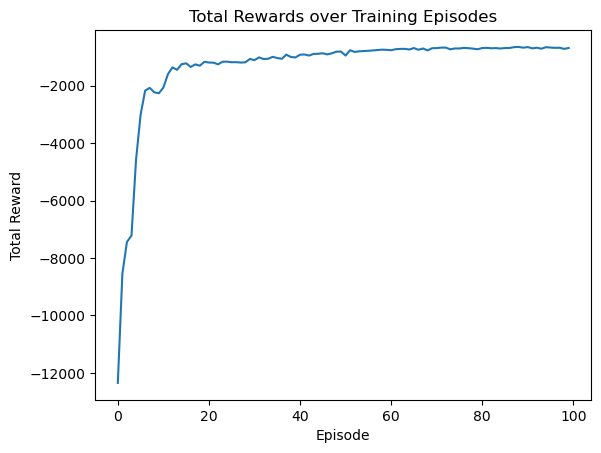

Average Reward over 100 episodes: -730.6995026636122


In [85]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv()
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")

In [13]:
def track_temperature_and_actions_precise(agent, env, episodes=1):
    for episode in range(episodes):
        state = env.reset()
        done = False
        internal_temps = []
        external_temps = []
        actions = []
        total_reward = 0
        while not done:
            action = agent.act(state)
            state, reward, done, _ = env.step(action)
            internal_temps.append(state[0])  
            external_temps.append(state[1])  
            actions.append(action)
            total_reward += reward
        print(f"Total Reward: {total_reward}")
        plt.plot(internal_temps, label='Internal Temperature')
        plt.plot(external_temps, label='External Temperature', linestyle='--')
        plt.axhline(y=env.temperature_setpoint - 1, color='r', linestyle='--', label='Setpoint')
        plt.axhline(y=env.temperature_setpoint, color='r', linestyle='--', label='Setpoint')
        plt.axhline(y=env.temperature_setpoint + 1, color='r', linestyle='--', label='Setpoint')
        plt.xlabel('Time Step')
        plt.ylabel('Temperature')
        plt.title(f'Episode {episode + 1}')
        plt.legend()
        plt.show()
        plt.plot(actions, label='Actions')
        plt.xlabel('Time Step')
        plt.ylabel('Action')
        plt.title(f'Actions in Episode {episode + 1}')
        plt.legend()
        plt.show()

#track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11814.331524705889, Epsilon: 0.01
Episode 2/100, Total Reward: -9774.11241626738, Epsilon: 0.01
Episode 3/100, Total Reward: -9905.206119060522, Epsilon: 0.01
Episode 4/100, Total Reward: -7773.210958099368, Epsilon: 0.01
Episode 5/100, Total Reward: -6080.102115344995, Epsilon: 0.01
Episode 6/100, Total Reward: -3872.8369728088405, Epsilon: 0.01
Episode 7/100, Total Reward: -3277.7118005752586, Epsilon: 0.01
Episode 8/100, Total Reward: -3345.7713876724238, Epsilon: 0.01
Episode 9/100, Total Reward: -3172.0425901412927, Epsilon: 0.01
Episode 10/100, Total Reward: -2188.12127866745, Epsilon: 0.01
Episode 11/100, Total Reward: -2113.092909622191, Epsilon: 0.01
Episode 12/100, Total Reward: -2136.959797382356, Epsilon: 0.01
Episode 13/100, Total Reward: -1984.5064394950857, Epsilon: 0.01
Episode 14/100, Total Reward: -1751.257026386263, Epsilon: 0.01
Episode 15/100, Total Reward: -1622.8584280967716, Epsilon: 0.01
Episode 16/100, Total Reward: -1826.10173082

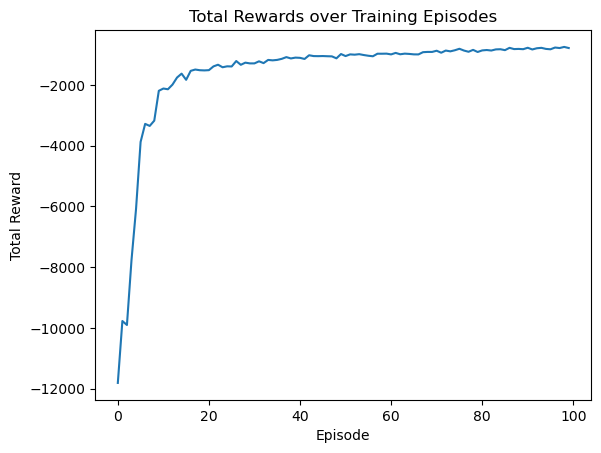

Average Reward over 100 episodes: -606.1913051099777
Total Reward: -619.6235640525821


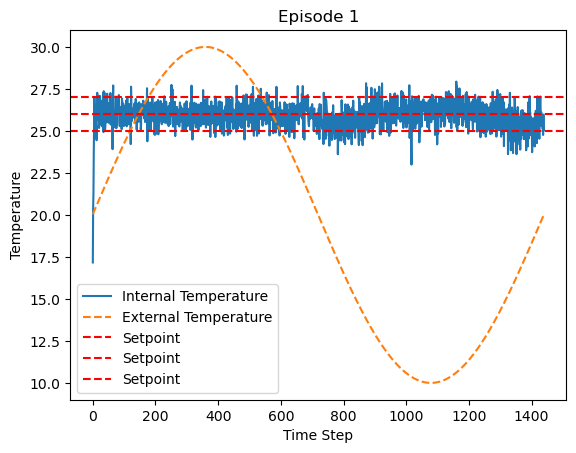

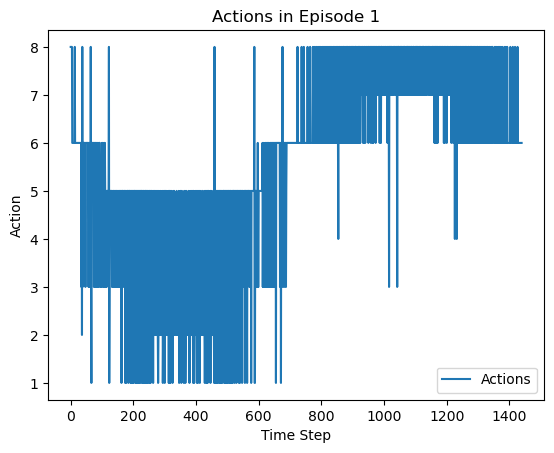

In [89]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -13795.84855475424, Epsilon: 0.01
Episode 2/100, Total Reward: -11098.578491115568, Epsilon: 0.01
Episode 3/100, Total Reward: -8595.237306976322, Epsilon: 0.01
Episode 4/100, Total Reward: -8111.583245277403, Epsilon: 0.01
Episode 5/100, Total Reward: -7408.117012119292, Epsilon: 0.01
Episode 6/100, Total Reward: -6170.211643028264, Epsilon: 0.01
Episode 7/100, Total Reward: -6335.222152519212, Epsilon: 0.01
Episode 8/100, Total Reward: -4484.149817657469, Epsilon: 0.01
Episode 9/100, Total Reward: -5657.675672531139, Epsilon: 0.01
Episode 10/100, Total Reward: -5792.325305652625, Epsilon: 0.01
Episode 11/100, Total Reward: -4029.6595793724023, Epsilon: 0.01
Episode 12/100, Total Reward: -1917.5937537193306, Epsilon: 0.01
Episode 13/100, Total Reward: -2108.776710605622, Epsilon: 0.01
Episode 14/100, Total Reward: -2218.9007491111743, Epsilon: 0.01
Episode 15/100, Total Reward: -1748.053778743743, Epsilon: 0.01
Episode 16/100, Total Reward: -1430.930216979

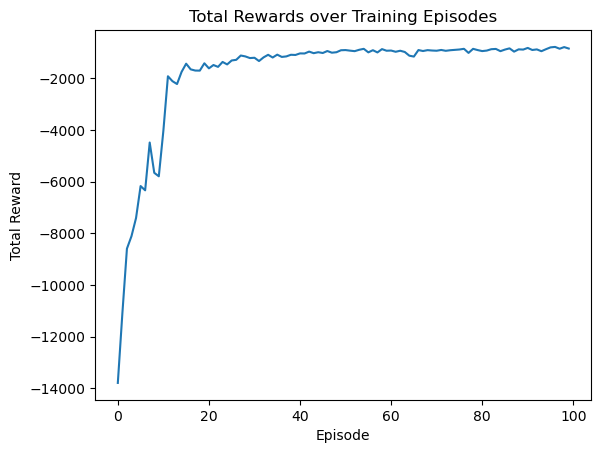

Average Reward over 100 episodes: -855.5398808269503
Total Reward: -869.4918120384218


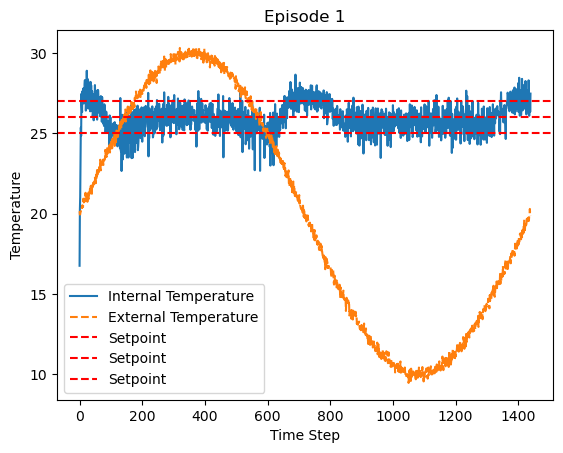

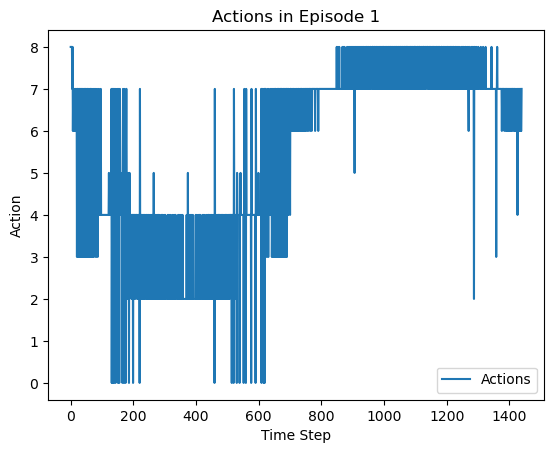

In [90]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.2)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -12559.447405421735, Epsilon: 0.01
Episode 2/100, Total Reward: -8607.451077461234, Epsilon: 0.01
Episode 3/100, Total Reward: -6696.370836925502, Epsilon: 0.01
Episode 4/100, Total Reward: -4408.9540671348495, Epsilon: 0.01
Episode 5/100, Total Reward: -4299.469800853726, Epsilon: 0.01
Episode 6/100, Total Reward: -3247.6242888450624, Epsilon: 0.01
Episode 7/100, Total Reward: -2909.8417933463984, Epsilon: 0.01
Episode 8/100, Total Reward: -2039.7161512374855, Epsilon: 0.01
Episode 9/100, Total Reward: -1954.8517432212836, Epsilon: 0.01
Episode 10/100, Total Reward: -1496.8035569191013, Epsilon: 0.01
Episode 11/100, Total Reward: -1508.6821047782885, Epsilon: 0.01
Episode 12/100, Total Reward: -1483.3682980537415, Epsilon: 0.01
Episode 13/100, Total Reward: -1337.1430569648724, Epsilon: 0.01
Episode 14/100, Total Reward: -1336.1604016304013, Epsilon: 0.01
Episode 15/100, Total Reward: -1227.4620393753055, Epsilon: 0.01
Episode 16/100, Total Reward: -1128.0

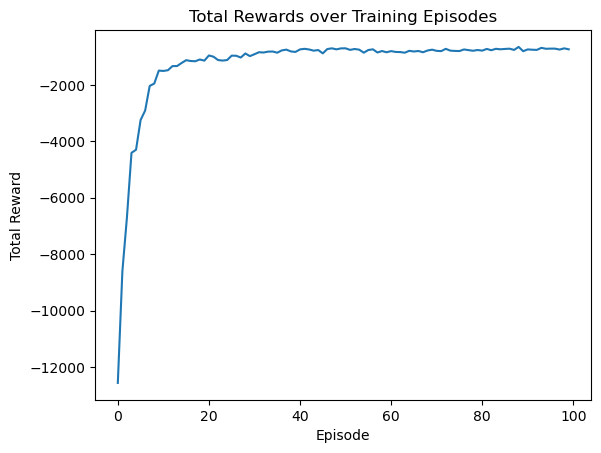

Average Reward over 100 episodes: -554.9750298128127
Total Reward: -552.6381518363968


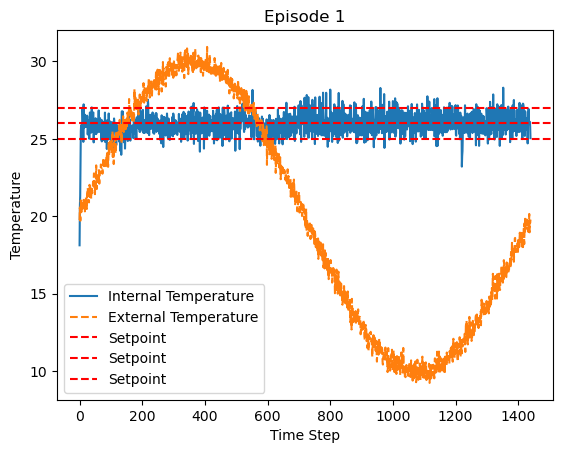

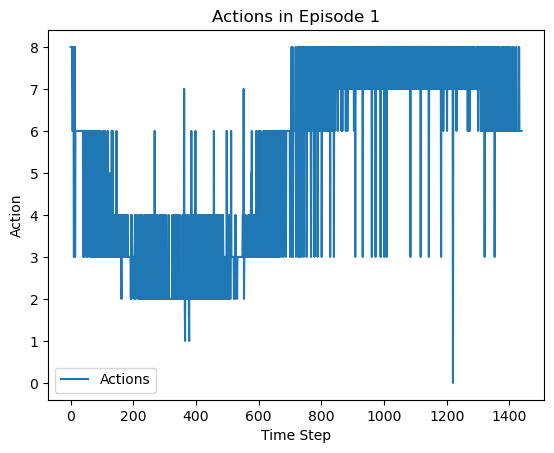

In [91]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.4)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -12518.730341672888, Epsilon: 0.01
Episode 2/100, Total Reward: -9604.112484836583, Epsilon: 0.01
Episode 3/100, Total Reward: -9083.016126060491, Epsilon: 0.01
Episode 4/100, Total Reward: -6705.064437103271, Epsilon: 0.01
Episode 5/100, Total Reward: -5249.6916086197, Epsilon: 0.01
Episode 6/100, Total Reward: -4697.342055130011, Epsilon: 0.01
Episode 7/100, Total Reward: -4437.248364830014, Epsilon: 0.01
Episode 8/100, Total Reward: -4698.448759269705, Epsilon: 0.01
Episode 9/100, Total Reward: -3651.7396257400537, Epsilon: 0.01
Episode 10/100, Total Reward: -3536.969713401791, Epsilon: 0.01
Episode 11/100, Total Reward: -2925.161680889127, Epsilon: 0.01
Episode 12/100, Total Reward: -2884.165112876894, Epsilon: 0.01
Episode 13/100, Total Reward: -1982.6946947097786, Epsilon: 0.01
Episode 14/100, Total Reward: -1596.0301623344403, Epsilon: 0.01
Episode 15/100, Total Reward: -1636.0457603454602, Epsilon: 0.01
Episode 16/100, Total Reward: -1661.1395911216

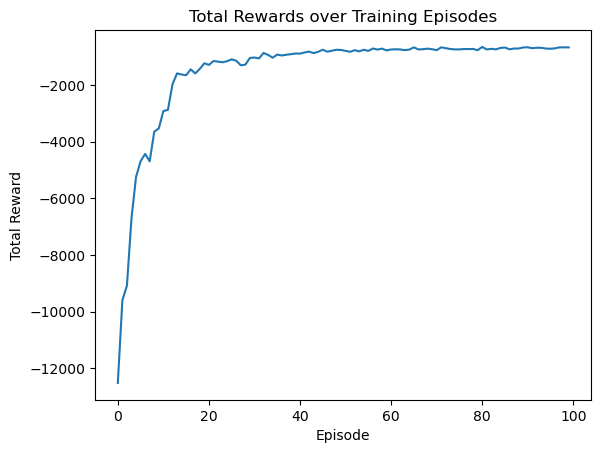

Average Reward over 100 episodes: -536.8730270032883
Total Reward: -523.5333440780636


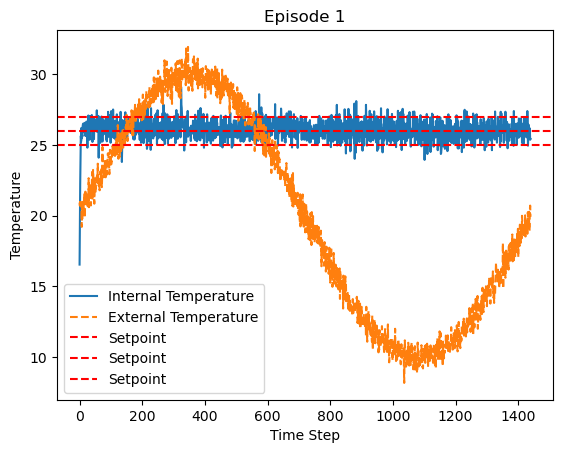

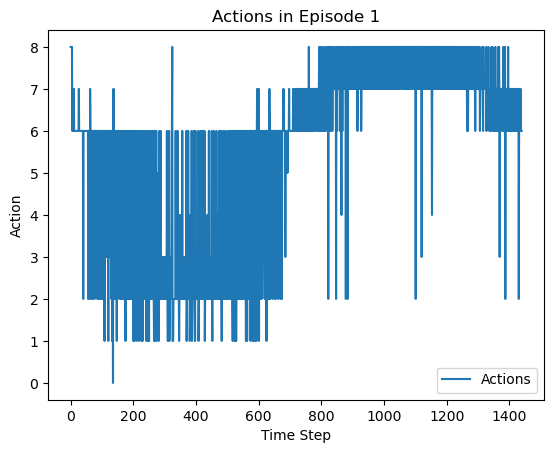

In [92]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.6)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -13068.663108277311, Epsilon: 0.01
Episode 2/100, Total Reward: -11894.138906049735, Epsilon: 0.01
Episode 3/100, Total Reward: -8957.34459047318, Epsilon: 0.01
Episode 4/100, Total Reward: -6528.613784027104, Epsilon: 0.01
Episode 5/100, Total Reward: -3383.5715465545672, Epsilon: 0.01
Episode 6/100, Total Reward: -2544.443179893493, Epsilon: 0.01
Episode 7/100, Total Reward: -1959.7180811882026, Epsilon: 0.01
Episode 8/100, Total Reward: -1836.941178894044, Epsilon: 0.01
Episode 9/100, Total Reward: -1831.9470752716047, Epsilon: 0.01
Episode 10/100, Total Reward: -1542.9957179069502, Epsilon: 0.01
Episode 11/100, Total Reward: -1505.8985944747938, Epsilon: 0.01
Episode 12/100, Total Reward: -1469.3087569236766, Epsilon: 0.01
Episode 13/100, Total Reward: -1435.8393964767456, Epsilon: 0.01
Episode 14/100, Total Reward: -1283.4419988632228, Epsilon: 0.01
Episode 15/100, Total Reward: -1245.3512529373152, Epsilon: 0.01
Episode 16/100, Total Reward: -1202.800

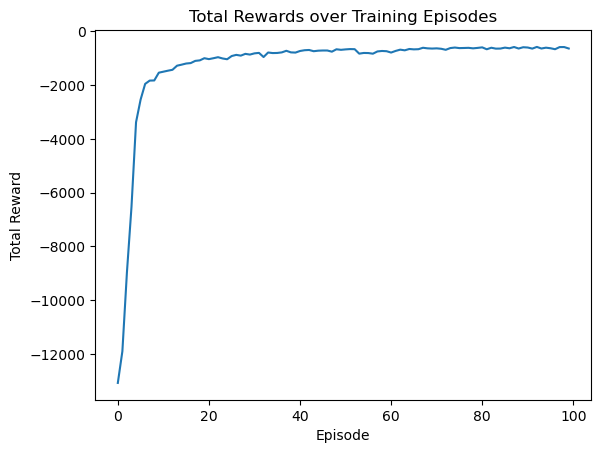

Average Reward over 100 episodes: -785.4385521755217
Total Reward: -765.4914477348328


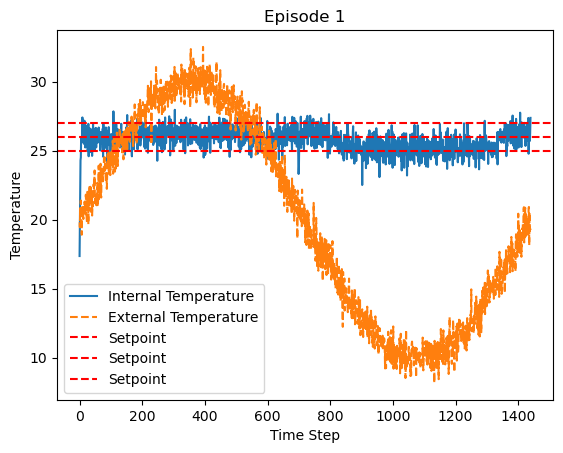

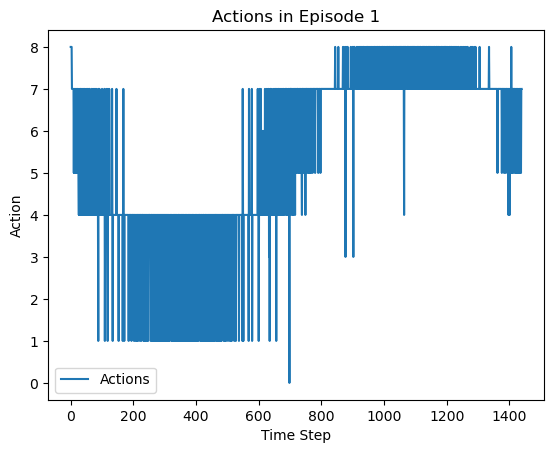

In [93]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.8)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -10920.299069786079, Epsilon: 0.01
Episode 2/100, Total Reward: -10760.286721992492, Epsilon: 0.01
Episode 3/100, Total Reward: -7323.438433933259, Epsilon: 0.01
Episode 4/100, Total Reward: -5053.6318655014065, Epsilon: 0.01
Episode 5/100, Total Reward: -4002.5650908470193, Epsilon: 0.01
Episode 6/100, Total Reward: -3223.314671516421, Epsilon: 0.01
Episode 7/100, Total Reward: -2941.914721107484, Epsilon: 0.01
Episode 8/100, Total Reward: -2111.0464244842524, Epsilon: 0.01
Episode 9/100, Total Reward: -1725.8401150703478, Epsilon: 0.01
Episode 10/100, Total Reward: -1370.2482273101832, Epsilon: 0.01
Episode 11/100, Total Reward: -1120.2115570068352, Epsilon: 0.01
Episode 12/100, Total Reward: -1039.6164869308452, Epsilon: 0.01
Episode 13/100, Total Reward: -1246.1100866317743, Epsilon: 0.01
Episode 14/100, Total Reward: -1164.1601897239686, Epsilon: 0.01
Episode 15/100, Total Reward: -1103.4288612365713, Epsilon: 0.01
Episode 16/100, Total Reward: -1176.4

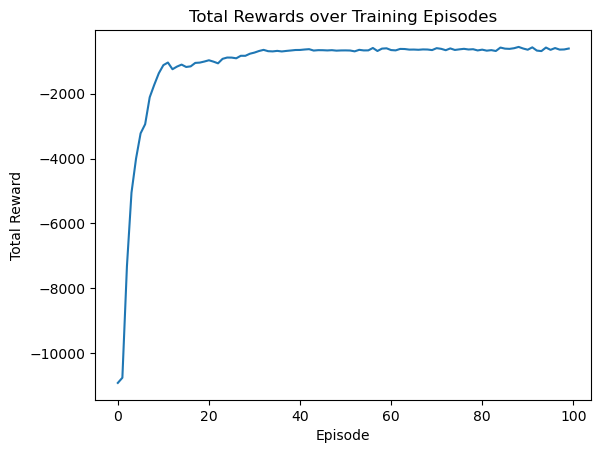

Average Reward over 100 episodes: -557.633336435318
Total Reward: -547.1204730033882


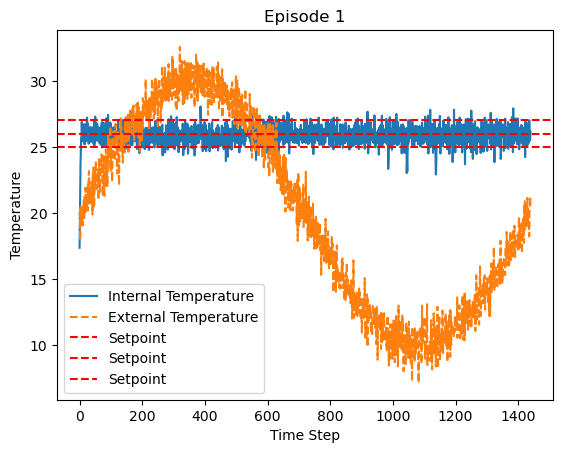

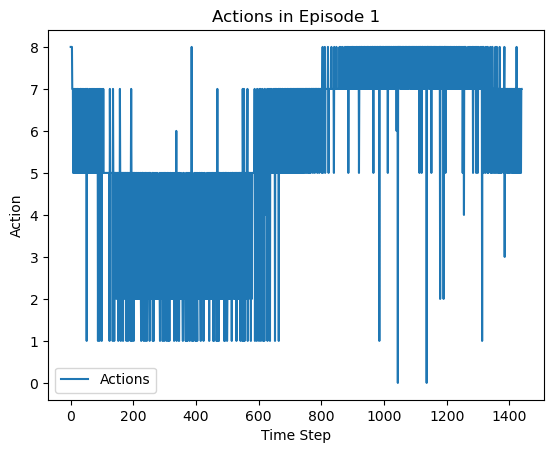

In [94]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=1.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -13957.614416170107, Epsilon: 0.01
Episode 2/100, Total Reward: -13574.053580856338, Epsilon: 0.01
Episode 3/100, Total Reward: -12142.960719680772, Epsilon: 0.01
Episode 4/100, Total Reward: -7544.44478397369, Epsilon: 0.01
Episode 5/100, Total Reward: -5424.516853141782, Epsilon: 0.01
Episode 6/100, Total Reward: -5358.595437431328, Epsilon: 0.01
Episode 7/100, Total Reward: -2893.207975482935, Epsilon: 0.01
Episode 8/100, Total Reward: -3794.1787789344826, Epsilon: 0.01
Episode 9/100, Total Reward: -1993.3564443588261, Epsilon: 0.01
Episode 10/100, Total Reward: -1800.8067617416377, Epsilon: 0.01
Episode 11/100, Total Reward: -1624.95139579773, Epsilon: 0.01
Episode 12/100, Total Reward: -1557.861906051635, Epsilon: 0.01
Episode 13/100, Total Reward: -1356.113729000089, Epsilon: 0.01
Episode 14/100, Total Reward: -1249.058825016021, Epsilon: 0.01
Episode 15/100, Total Reward: -1160.5487527847285, Epsilon: 0.01
Episode 16/100, Total Reward: -1066.07539443

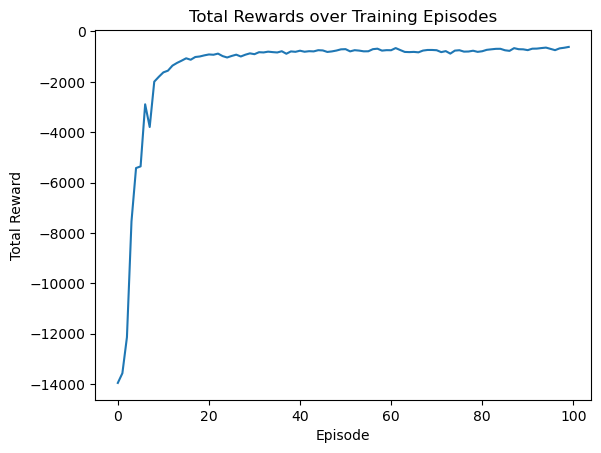

Average Reward over 100 episodes: -549.7754744396209
Total Reward: -542.9289227485665


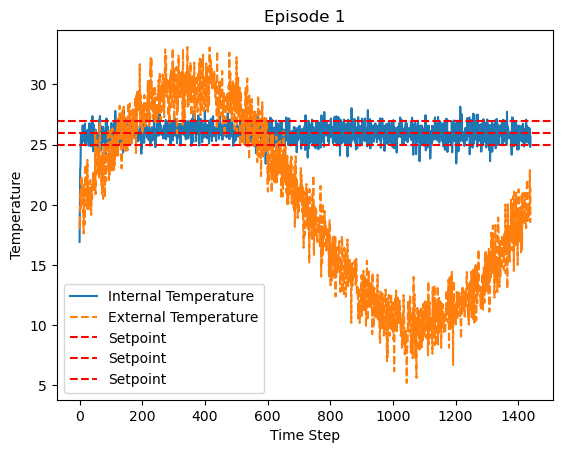

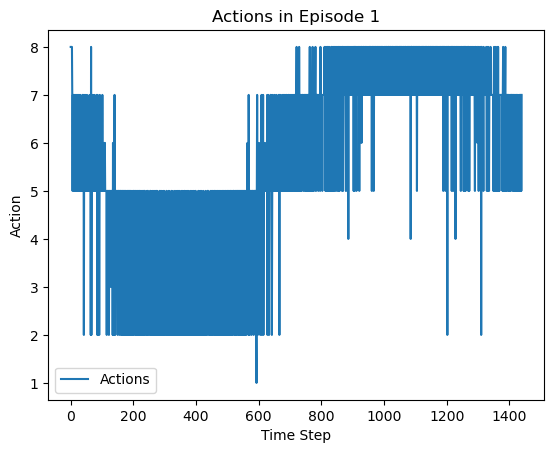

In [95]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=1.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -15709.765972566616, Epsilon: 0.01
Episode 2/100, Total Reward: -15837.921772098558, Epsilon: 0.01
Episode 3/100, Total Reward: -11854.062913036338, Epsilon: 0.01
Episode 4/100, Total Reward: -5044.743425273894, Epsilon: 0.01
Episode 5/100, Total Reward: -3372.080127811434, Epsilon: 0.01
Episode 6/100, Total Reward: -3644.1931795120254, Epsilon: 0.01
Episode 7/100, Total Reward: -2544.7620642662105, Epsilon: 0.01
Episode 8/100, Total Reward: -2350.3745947837824, Epsilon: 0.01
Episode 9/100, Total Reward: -2774.8421051979026, Epsilon: 0.01
Episode 10/100, Total Reward: -2182.76382350922, Epsilon: 0.01
Episode 11/100, Total Reward: -1838.7040988922115, Epsilon: 0.01
Episode 12/100, Total Reward: -1961.3383615493772, Epsilon: 0.01
Episode 13/100, Total Reward: -1921.2295430183417, Epsilon: 0.01
Episode 14/100, Total Reward: -1975.2479616165156, Epsilon: 0.01
Episode 15/100, Total Reward: -1887.753386878965, Epsilon: 0.01
Episode 16/100, Total Reward: -1804.065

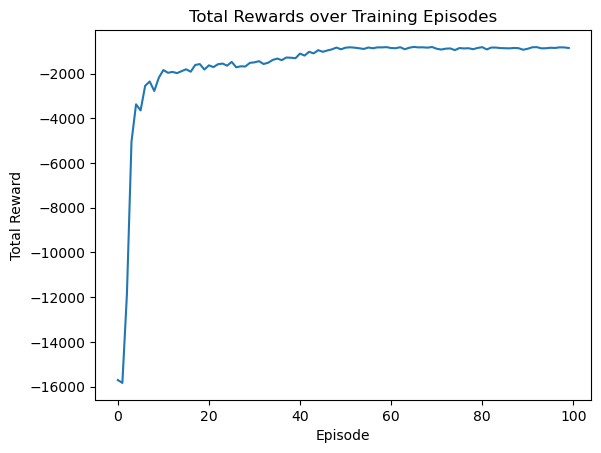

Average Reward over 100 episodes: -768.7856267528533
Total Reward: -776.5550838470456


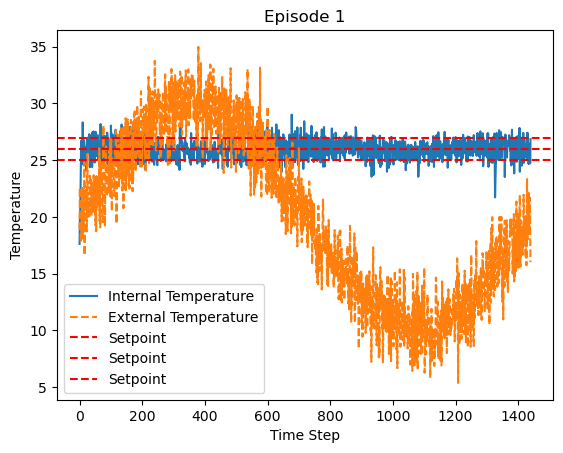

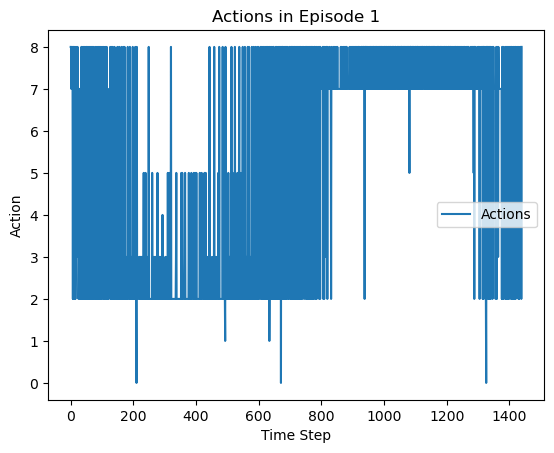

In [96]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=2.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -14657.503185554595, Epsilon: 0.01
Episode 2/100, Total Reward: -7531.747252559679, Epsilon: 0.01
Episode 3/100, Total Reward: -4455.91403264999, Epsilon: 0.01
Episode 4/100, Total Reward: -2588.457046794896, Epsilon: 0.01
Episode 5/100, Total Reward: -3550.0237081527694, Epsilon: 0.01
Episode 6/100, Total Reward: -3058.2511665344236, Epsilon: 0.01
Episode 7/100, Total Reward: -1972.717330265046, Epsilon: 0.01
Episode 8/100, Total Reward: -1569.300812435149, Epsilon: 0.01
Episode 9/100, Total Reward: -1433.3351546287547, Epsilon: 0.01
Episode 10/100, Total Reward: -1406.345410633088, Epsilon: 0.01
Episode 11/100, Total Reward: -1403.9259364128106, Epsilon: 0.01
Episode 12/100, Total Reward: -1291.446803569794, Epsilon: 0.01
Episode 13/100, Total Reward: -1236.4296643257126, Epsilon: 0.01
Episode 14/100, Total Reward: -1200.368358421327, Epsilon: 0.01
Episode 15/100, Total Reward: -1199.7862897872928, Epsilon: 0.01
Episode 16/100, Total Reward: -1185.5658696

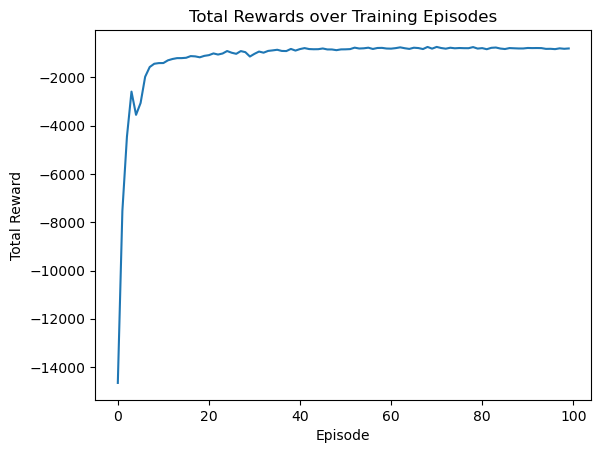

Average Reward over 100 episodes: -1002.719775182724
Total Reward: -984.2734880447397


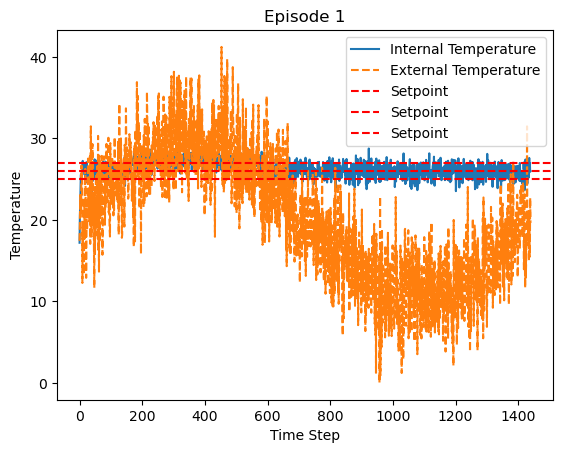

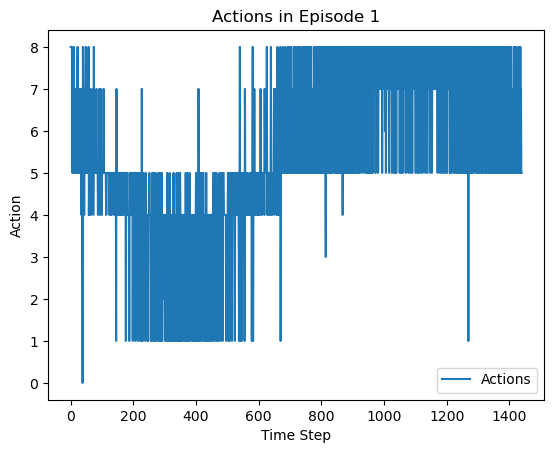

In [97]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=4.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -17928.691136816902, Epsilon: 0.01
Episode 2/100, Total Reward: -9582.929915618886, Epsilon: 0.01
Episode 3/100, Total Reward: -4037.6507278442346, Epsilon: 0.01
Episode 4/100, Total Reward: -3939.7579048156636, Epsilon: 0.01
Episode 5/100, Total Reward: -2819.5101882934596, Epsilon: 0.01
Episode 6/100, Total Reward: -2249.0958517074578, Epsilon: 0.01
Episode 7/100, Total Reward: -2051.0089680671726, Epsilon: 0.01
Episode 8/100, Total Reward: -1866.6087535858146, Epsilon: 0.01
Episode 9/100, Total Reward: -1746.4850802421572, Epsilon: 0.01
Episode 10/100, Total Reward: -1520.2917229652392, Epsilon: 0.01
Episode 11/100, Total Reward: -1461.8421825408934, Epsilon: 0.01
Episode 12/100, Total Reward: -1423.0082964897142, Epsilon: 0.01
Episode 13/100, Total Reward: -1341.7564602851855, Epsilon: 0.01
Episode 14/100, Total Reward: -1229.2327362060566, Epsilon: 0.01
Episode 15/100, Total Reward: -1270.8160851478558, Epsilon: 0.01
Episode 16/100, Total Reward: -1207

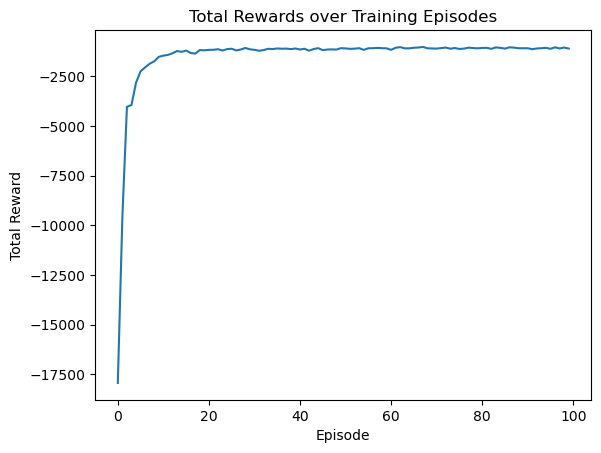

Average Reward over 100 episodes: -949.8888973398208
Total Reward: -960.1662473678599


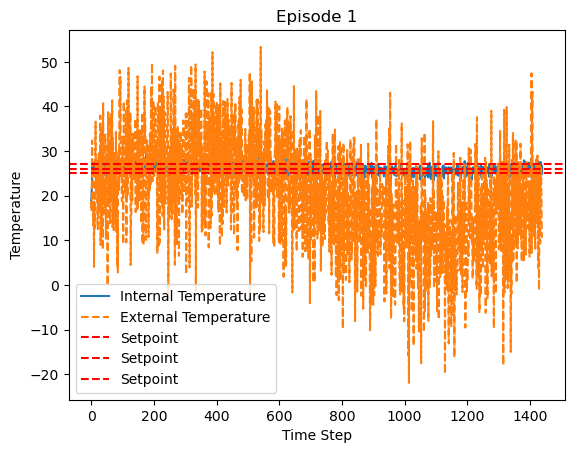

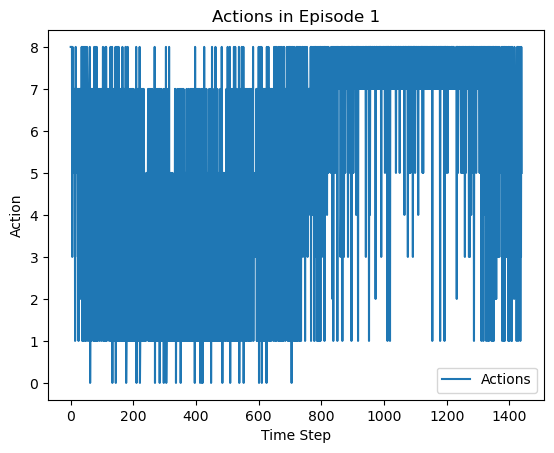

In [98]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=10.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -12100.686486101136, Epsilon: 0.01
Episode 2/100, Total Reward: -8216.883743762972, Epsilon: 0.01
Episode 3/100, Total Reward: -7070.952377700813, Epsilon: 0.01
Episode 4/100, Total Reward: -7754.130966281895, Epsilon: 0.01
Episode 5/100, Total Reward: -6639.339723396298, Epsilon: 0.01
Episode 6/100, Total Reward: -3221.9934438705463, Epsilon: 0.01
Episode 7/100, Total Reward: -4213.039289760585, Epsilon: 0.01
Episode 8/100, Total Reward: -2616.497495937346, Epsilon: 0.01
Episode 9/100, Total Reward: -2967.6923565864513, Epsilon: 0.01
Episode 10/100, Total Reward: -2496.551987838747, Epsilon: 0.01
Episode 11/100, Total Reward: -1934.248698329926, Epsilon: 0.01
Episode 12/100, Total Reward: -1854.73919324875, Epsilon: 0.01
Episode 13/100, Total Reward: -1835.177478218078, Epsilon: 0.01
Episode 14/100, Total Reward: -1886.364743709565, Epsilon: 0.01
Episode 15/100, Total Reward: -1969.1982957839937, Epsilon: 0.01
Episode 16/100, Total Reward: -2292.0792993545

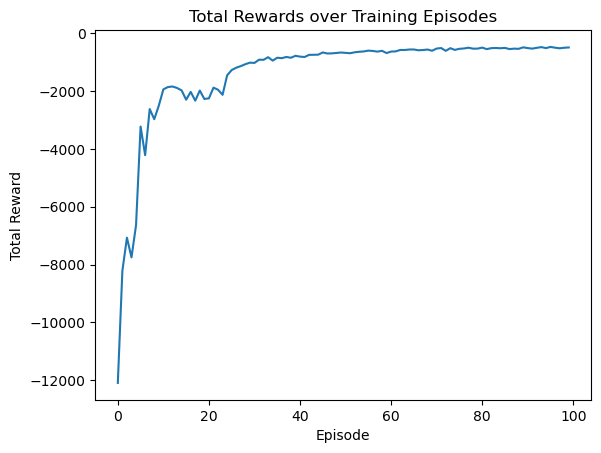

Average Reward over 100 episodes: -773.7673091363907
Total Reward: -769.2837085723888


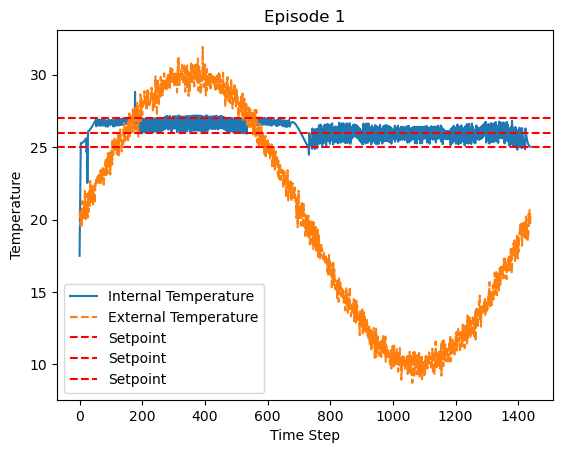

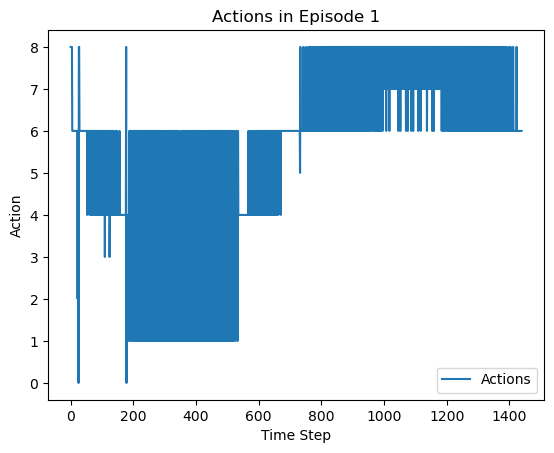

In [99]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11799.038238799189, Epsilon: 0.01
Episode 2/100, Total Reward: -10707.064706611636, Epsilon: 0.01
Episode 3/100, Total Reward: -7003.359673786167, Epsilon: 0.01
Episode 4/100, Total Reward: -4165.386725330351, Epsilon: 0.01
Episode 5/100, Total Reward: -2903.148505973814, Epsilon: 0.01
Episode 6/100, Total Reward: -3247.9064030647305, Epsilon: 0.01
Episode 7/100, Total Reward: -2916.451168727874, Epsilon: 0.01
Episode 8/100, Total Reward: -2200.700556373599, Epsilon: 0.01
Episode 9/100, Total Reward: -1710.1015872955334, Epsilon: 0.01
Episode 10/100, Total Reward: -1392.0757559776323, Epsilon: 0.01
Episode 11/100, Total Reward: -1321.0993884086606, Epsilon: 0.01
Episode 12/100, Total Reward: -1221.4098245620742, Epsilon: 0.01
Episode 13/100, Total Reward: -1242.9870180130013, Epsilon: 0.01
Episode 14/100, Total Reward: -947.1191005706781, Epsilon: 0.01
Episode 15/100, Total Reward: -1038.499406051636, Epsilon: 0.01
Episode 16/100, Total Reward: -1008.57903

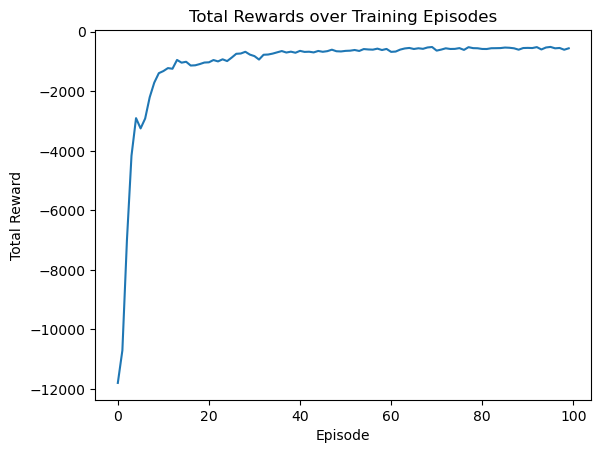

Average Reward over 100 episodes: -596.0569797611238
Total Reward: -602.134893798829


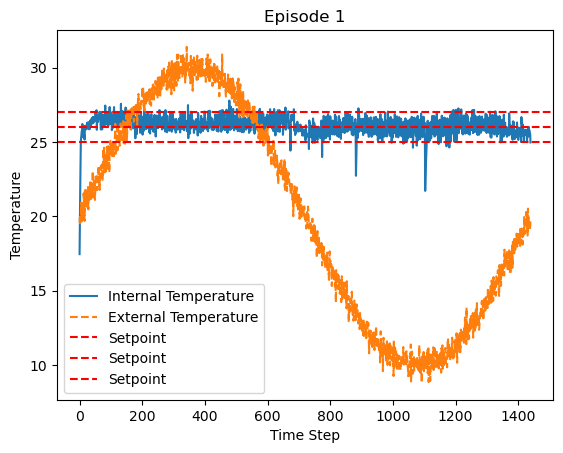

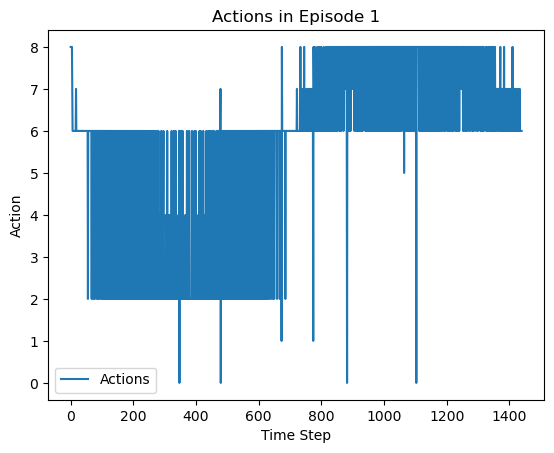

In [100]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.2, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -10887.364290922877, Epsilon: 0.01
Episode 2/100, Total Reward: -7979.539785099029, Epsilon: 0.01
Episode 3/100, Total Reward: -4968.914565467831, Epsilon: 0.01
Episode 4/100, Total Reward: -4135.760136985782, Epsilon: 0.01
Episode 5/100, Total Reward: -2591.910209178926, Epsilon: 0.01
Episode 6/100, Total Reward: -3908.1024529457086, Epsilon: 0.01
Episode 7/100, Total Reward: -4650.704552745823, Epsilon: 0.01
Episode 8/100, Total Reward: -3598.886094951633, Epsilon: 0.01
Episode 9/100, Total Reward: -2084.4543816566456, Epsilon: 0.01
Episode 10/100, Total Reward: -2039.2249297142025, Epsilon: 0.01
Episode 11/100, Total Reward: -2006.5318362236042, Epsilon: 0.01
Episode 12/100, Total Reward: -1606.5300526618946, Epsilon: 0.01
Episode 13/100, Total Reward: -1569.6329965591435, Epsilon: 0.01
Episode 14/100, Total Reward: -1859.0052779197706, Epsilon: 0.01
Episode 15/100, Total Reward: -1548.239334106448, Epsilon: 0.01
Episode 16/100, Total Reward: -1644.04044

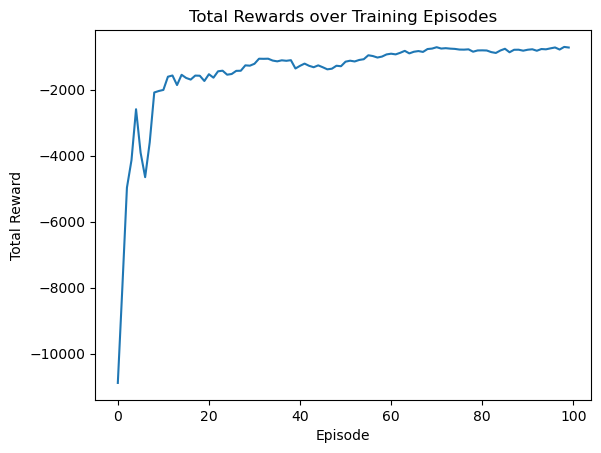

Average Reward over 100 episodes: -1006.6204926414487
Total Reward: -988.3018654823309


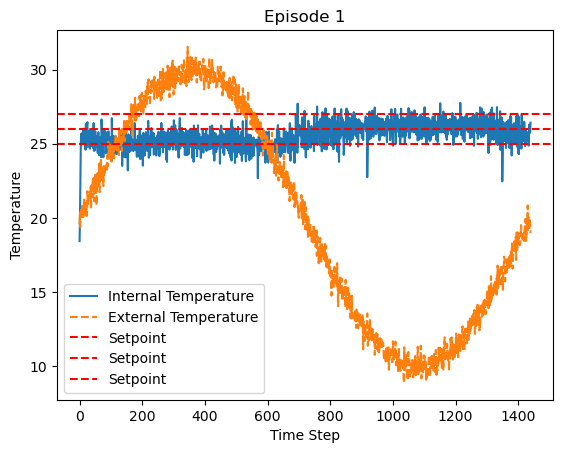

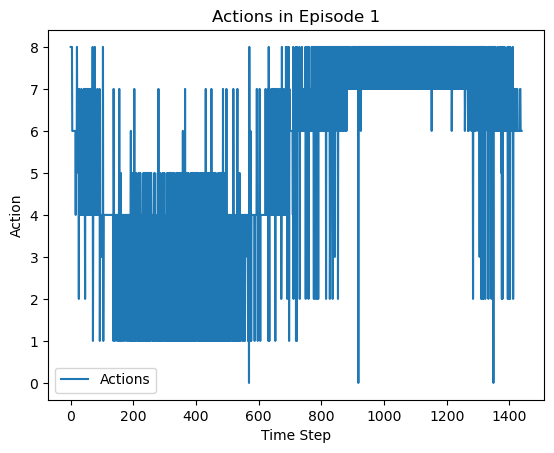

In [101]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.4, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11449.204424428954, Epsilon: 0.01
Episode 2/100, Total Reward: -9870.780251598355, Epsilon: 0.01
Episode 3/100, Total Reward: -5318.349393081667, Epsilon: 0.01
Episode 4/100, Total Reward: -5285.397551727298, Epsilon: 0.01
Episode 5/100, Total Reward: -4656.966918563846, Epsilon: 0.01
Episode 6/100, Total Reward: -3117.0969683647095, Epsilon: 0.01
Episode 7/100, Total Reward: -3160.8935458183273, Epsilon: 0.01
Episode 8/100, Total Reward: -2077.4214299201935, Epsilon: 0.01
Episode 9/100, Total Reward: -1928.7986771583558, Epsilon: 0.01
Episode 10/100, Total Reward: -1739.4405837058998, Epsilon: 0.01
Episode 11/100, Total Reward: -1693.2766363143933, Epsilon: 0.01
Episode 12/100, Total Reward: -1558.921520423892, Epsilon: 0.01
Episode 13/100, Total Reward: -1410.967225360871, Epsilon: 0.01
Episode 14/100, Total Reward: -1476.6882162094123, Epsilon: 0.01
Episode 15/100, Total Reward: -1191.0913683891301, Epsilon: 0.01
Episode 16/100, Total Reward: -1223.7889

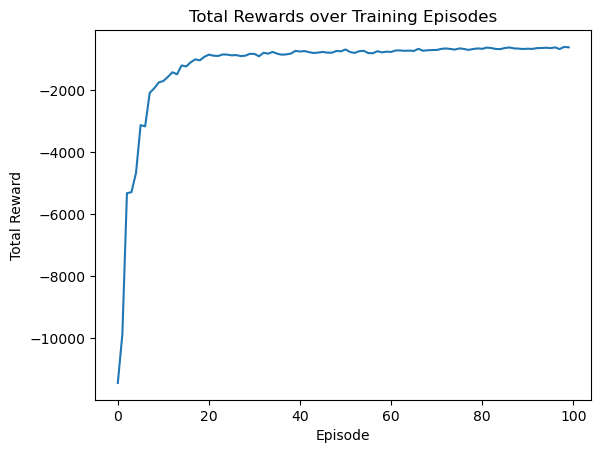

Average Reward over 100 episodes: -619.1723091249465
Total Reward: -611.2724616050717


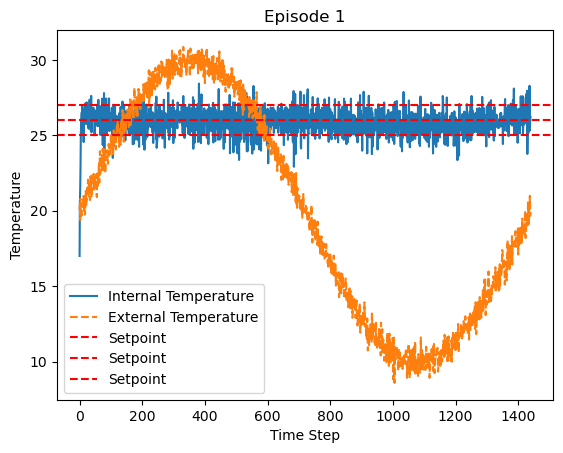

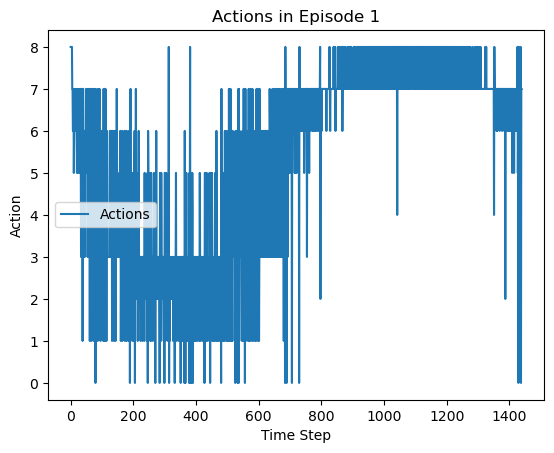

In [102]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.6, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11664.374865698812, Epsilon: 0.01
Episode 2/100, Total Reward: -10181.188853359241, Epsilon: 0.01
Episode 3/100, Total Reward: -6845.967279338833, Epsilon: 0.01
Episode 4/100, Total Reward: -4782.091539955136, Epsilon: 0.01
Episode 5/100, Total Reward: -3666.411558151243, Epsilon: 0.01
Episode 6/100, Total Reward: -2280.431687164303, Epsilon: 0.01
Episode 7/100, Total Reward: -1938.9823965072649, Epsilon: 0.01
Episode 8/100, Total Reward: -1673.5502278327956, Epsilon: 0.01
Episode 9/100, Total Reward: -1667.9252218246454, Epsilon: 0.01
Episode 10/100, Total Reward: -1566.7148829460116, Epsilon: 0.01
Episode 11/100, Total Reward: -1612.2802536010743, Epsilon: 0.01
Episode 12/100, Total Reward: -1472.0381149292007, Epsilon: 0.01
Episode 13/100, Total Reward: -1476.7145527839664, Epsilon: 0.01
Episode 14/100, Total Reward: -1541.0049799919132, Epsilon: 0.01
Episode 15/100, Total Reward: -1471.8811985969523, Epsilon: 0.01
Episode 16/100, Total Reward: -1504.79

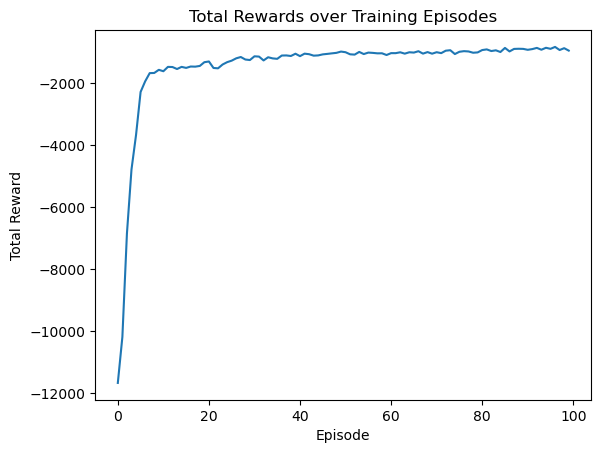

Average Reward over 100 episodes: -893.1452649393083
Total Reward: -896.5709487915036


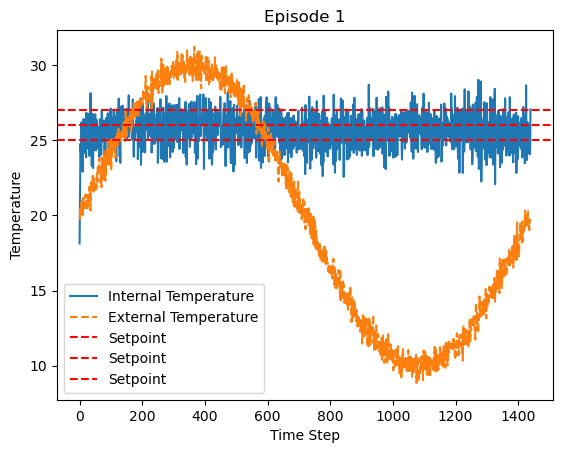

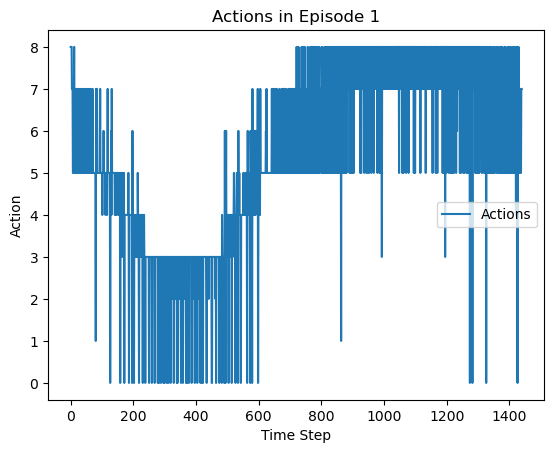

In [103]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.8, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11787.001918268204, Epsilon: 0.01
Episode 2/100, Total Reward: -8532.368630599976, Epsilon: 0.01
Episode 3/100, Total Reward: -6707.834641265868, Epsilon: 0.01
Episode 4/100, Total Reward: -3594.704995822902, Epsilon: 0.01
Episode 5/100, Total Reward: -4489.91410875321, Epsilon: 0.01
Episode 6/100, Total Reward: -2268.202222251892, Epsilon: 0.01
Episode 7/100, Total Reward: -2113.6608650207527, Epsilon: 0.01
Episode 8/100, Total Reward: -2140.0731174469024, Epsilon: 0.01
Episode 9/100, Total Reward: -1854.429205226901, Epsilon: 0.01
Episode 10/100, Total Reward: -1789.24125652313, Epsilon: 0.01
Episode 11/100, Total Reward: -1896.7406520843513, Epsilon: 0.01
Episode 12/100, Total Reward: -1401.6512552261358, Epsilon: 0.01
Episode 13/100, Total Reward: -1525.649334144593, Epsilon: 0.01
Episode 14/100, Total Reward: -1377.4601511001586, Epsilon: 0.01
Episode 15/100, Total Reward: -1402.9594828605643, Epsilon: 0.01
Episode 16/100, Total Reward: -1478.90064859

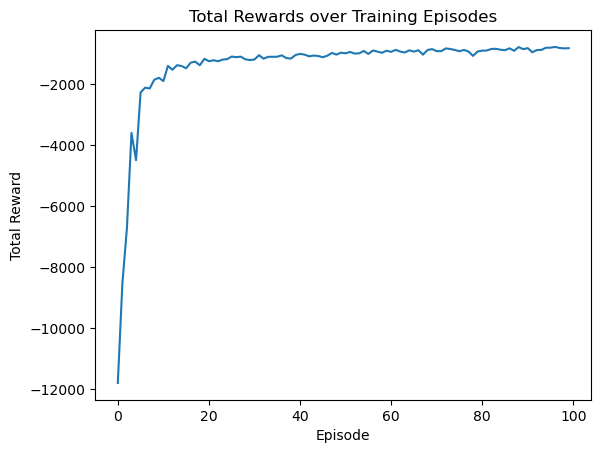

Average Reward over 100 episodes: -765.9359779186249
Total Reward: -813.2139575004571


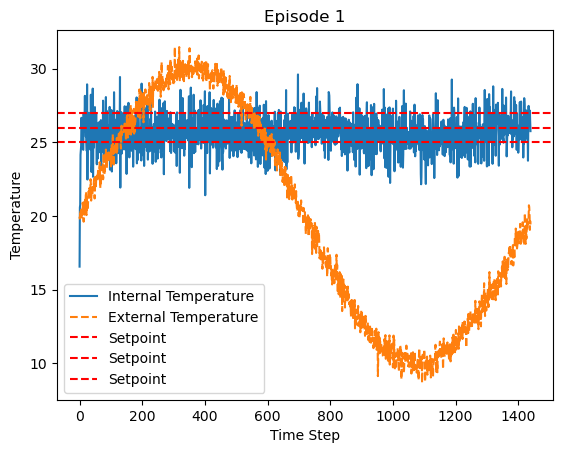

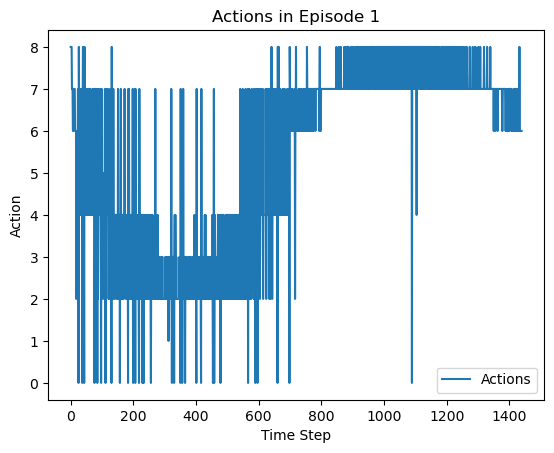

In [104]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=1.0, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11603.632097584008, Epsilon: 0.01
Episode 2/100, Total Reward: -9402.874477005009, Epsilon: 0.01
Episode 3/100, Total Reward: -7329.1343209266515, Epsilon: 0.01
Episode 4/100, Total Reward: -5390.794235610952, Epsilon: 0.01
Episode 5/100, Total Reward: -5336.421242237107, Epsilon: 0.01
Episode 6/100, Total Reward: -3012.603227233889, Epsilon: 0.01
Episode 7/100, Total Reward: -3047.143238067626, Epsilon: 0.01
Episode 8/100, Total Reward: -2967.6993110656736, Epsilon: 0.01
Episode 9/100, Total Reward: -3127.4379687309292, Epsilon: 0.01
Episode 10/100, Total Reward: -2856.1709483146674, Epsilon: 0.01
Episode 11/100, Total Reward: -2475.1427919387825, Epsilon: 0.01
Episode 12/100, Total Reward: -2645.7183262824988, Epsilon: 0.01
Episode 13/100, Total Reward: -2621.9099416732806, Epsilon: 0.01
Episode 14/100, Total Reward: -2237.595900821686, Epsilon: 0.01
Episode 15/100, Total Reward: -2100.209061622621, Epsilon: 0.01
Episode 16/100, Total Reward: -2023.48506

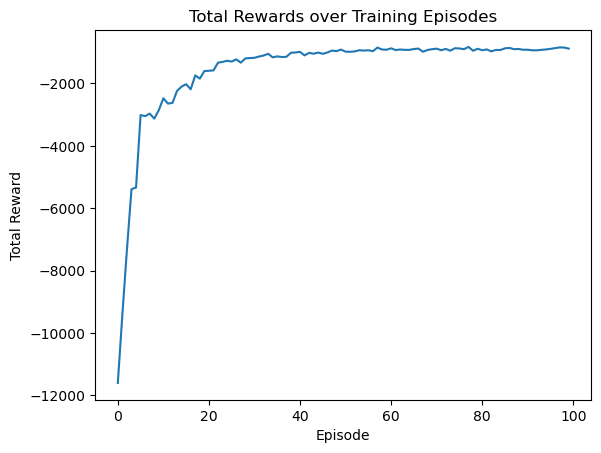

Average Reward over 100 episodes: -872.0702593126297
Total Reward: -843.4084454536436


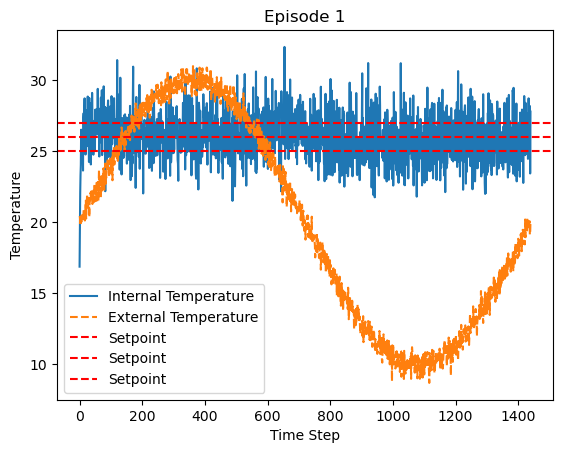

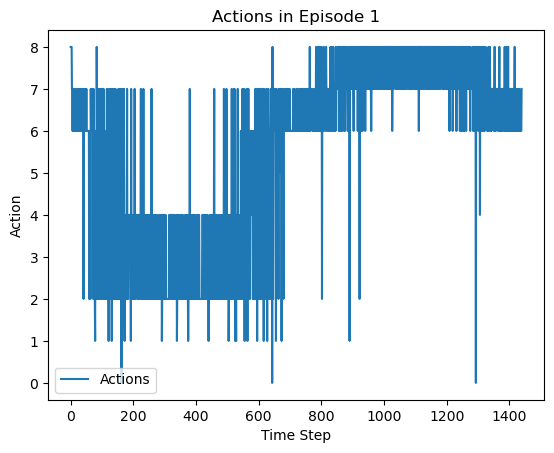

In [105]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=1.5, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11860.483865952485, Epsilon: 0.01
Episode 2/100, Total Reward: -7403.157547187806, Epsilon: 0.01
Episode 3/100, Total Reward: -5112.473647212978, Epsilon: 0.01
Episode 4/100, Total Reward: -4409.287037754061, Epsilon: 0.01
Episode 5/100, Total Reward: -4555.742012977602, Epsilon: 0.01
Episode 6/100, Total Reward: -3945.0471153259273, Epsilon: 0.01
Episode 7/100, Total Reward: -3724.4133175849884, Epsilon: 0.01
Episode 8/100, Total Reward: -3419.4983134269733, Epsilon: 0.01
Episode 9/100, Total Reward: -3141.6622454643266, Epsilon: 0.01
Episode 10/100, Total Reward: -3360.0360481262187, Epsilon: 0.01
Episode 11/100, Total Reward: -2816.834340000156, Epsilon: 0.01
Episode 12/100, Total Reward: -2639.891320991516, Epsilon: 0.01
Episode 13/100, Total Reward: -2152.364483261107, Epsilon: 0.01
Episode 14/100, Total Reward: -2368.326554679873, Epsilon: 0.01
Episode 15/100, Total Reward: -1920.723603534695, Epsilon: 0.01
Episode 16/100, Total Reward: -2010.6288693

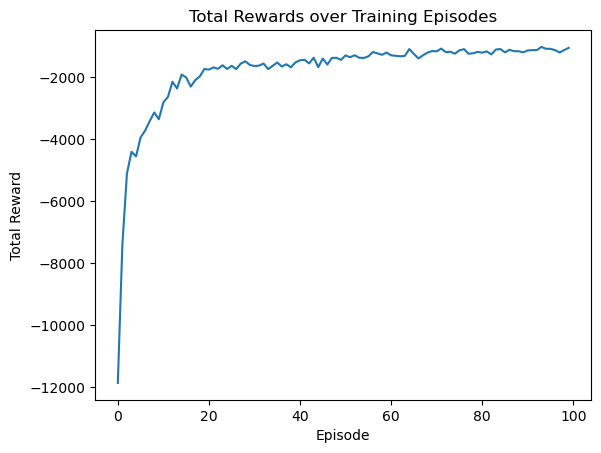

Average Reward over 100 episodes: -1024.5677287082672
Total Reward: -1004.5322632789603


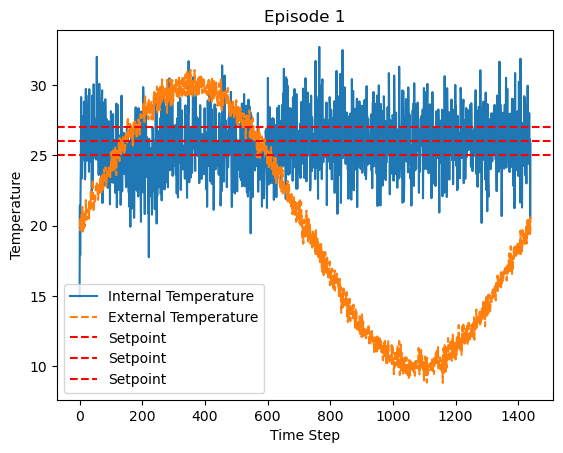

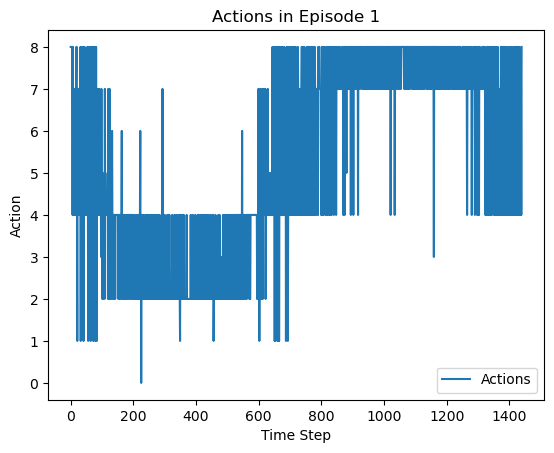

In [106]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=2.0, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11183.646335172658, Epsilon: 0.01
Episode 2/100, Total Reward: -9784.667128562933, Epsilon: 0.01
Episode 3/100, Total Reward: -8864.413773584365, Epsilon: 0.01
Episode 4/100, Total Reward: -4250.163286781306, Epsilon: 0.01
Episode 5/100, Total Reward: -4581.704093456268, Epsilon: 0.01
Episode 6/100, Total Reward: -3656.885831642151, Epsilon: 0.01
Episode 7/100, Total Reward: -2912.5028414726244, Epsilon: 0.01
Episode 8/100, Total Reward: -2796.4541755676273, Epsilon: 0.01
Episode 9/100, Total Reward: -2538.1966218948355, Epsilon: 0.01
Episode 10/100, Total Reward: -2202.217351055144, Epsilon: 0.01
Episode 11/100, Total Reward: -2188.352697753905, Epsilon: 0.01
Episode 12/100, Total Reward: -2110.7671979904176, Epsilon: 0.01
Episode 13/100, Total Reward: -1721.0830593109133, Epsilon: 0.01
Episode 14/100, Total Reward: -1474.8449802398668, Epsilon: 0.01
Episode 15/100, Total Reward: -1587.4370370864879, Epsilon: 0.01
Episode 16/100, Total Reward: -1716.58351

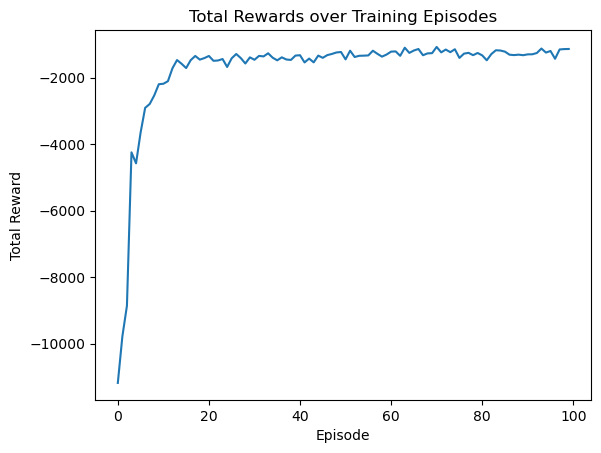

Average Reward over 100 episodes: -1093.280380724907
Total Reward: -1021.8000794410713


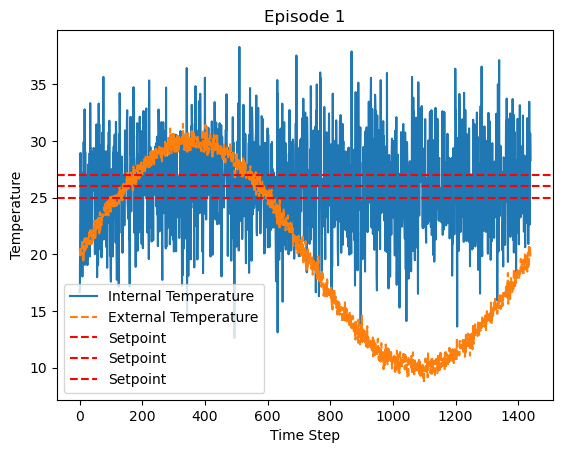

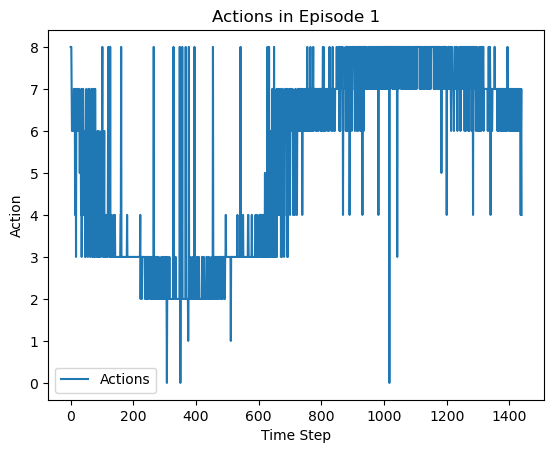

In [107]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=4.0, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11322.24438917638, Epsilon: 0.01
Episode 2/100, Total Reward: -10077.229914855949, Epsilon: 0.01
Episode 3/100, Total Reward: -7265.40253605843, Epsilon: 0.01
Episode 4/100, Total Reward: -3978.6000793457038, Epsilon: 0.01
Episode 5/100, Total Reward: -5016.305950450899, Epsilon: 0.01
Episode 6/100, Total Reward: -4473.893189430236, Epsilon: 0.01
Episode 7/100, Total Reward: -4433.303224563599, Epsilon: 0.01
Episode 8/100, Total Reward: -3001.43952178955, Epsilon: 0.01
Episode 9/100, Total Reward: -3117.409854888916, Epsilon: 0.01
Episode 10/100, Total Reward: -2836.8937211036678, Epsilon: 0.01
Episode 11/100, Total Reward: -2171.2757579803474, Epsilon: 0.01
Episode 12/100, Total Reward: -2587.590827274323, Epsilon: 0.01
Episode 13/100, Total Reward: -2320.206102752681, Epsilon: 0.01
Episode 14/100, Total Reward: -2260.7972679138206, Epsilon: 0.01
Episode 15/100, Total Reward: -2050.7904046058666, Epsilon: 0.01
Episode 16/100, Total Reward: -2347.862295722

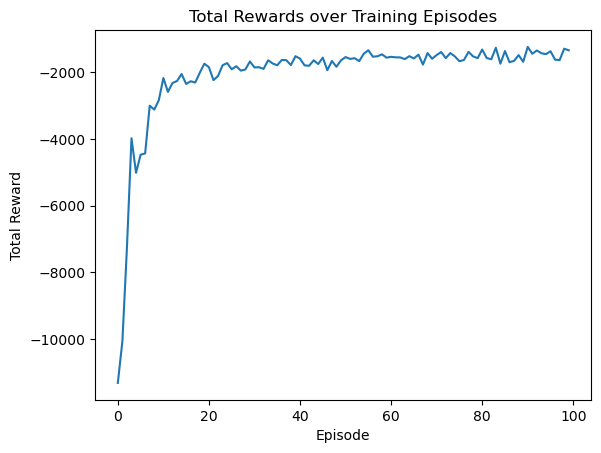

Average Reward over 100 episodes: -1410.307823645592
Total Reward: -1555.4531328201288


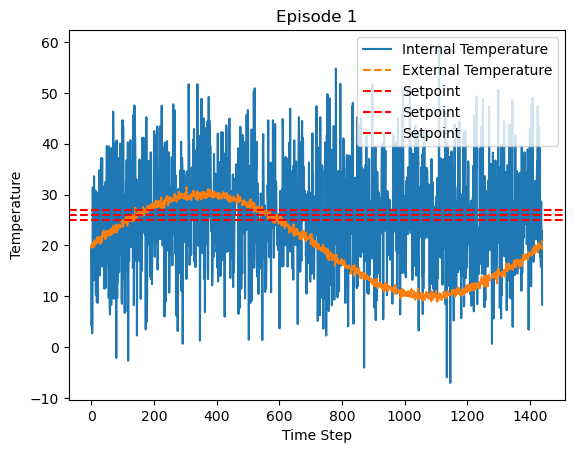

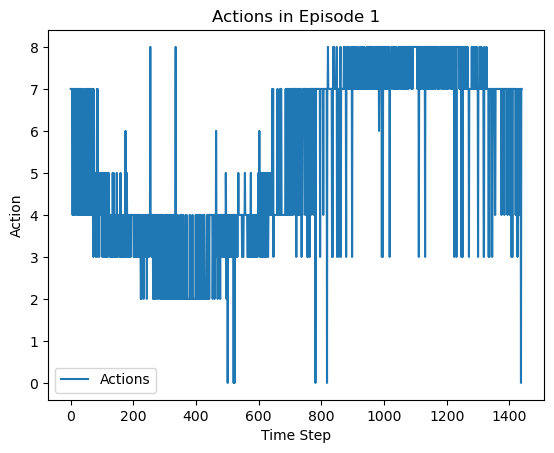

In [108]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -10532.851787638665, Epsilon: 0.01
Episode 2/100, Total Reward: -7215.858163547513, Epsilon: 0.01
Episode 3/100, Total Reward: -5871.178025913246, Epsilon: 0.01
Episode 4/100, Total Reward: -4353.602461624141, Epsilon: 0.01
Episode 5/100, Total Reward: -3086.842574787142, Epsilon: 0.01
Episode 6/100, Total Reward: -2822.349446868896, Epsilon: 0.01
Episode 7/100, Total Reward: -2750.4669008255, Epsilon: 0.01
Episode 8/100, Total Reward: -2603.4234668731656, Epsilon: 0.01
Episode 9/100, Total Reward: -2090.525335502629, Epsilon: 0.01
Episode 10/100, Total Reward: -1880.1431670188913, Epsilon: 0.01
Episode 11/100, Total Reward: -1803.1282233238212, Epsilon: 0.01
Episode 12/100, Total Reward: -1658.346687507632, Epsilon: 0.01
Episode 13/100, Total Reward: -1470.7990361213674, Epsilon: 0.01
Episode 14/100, Total Reward: -1421.400470638274, Epsilon: 0.01
Episode 15/100, Total Reward: -1573.059712791446, Epsilon: 0.01
Episode 16/100, Total Reward: -1586.5339493751

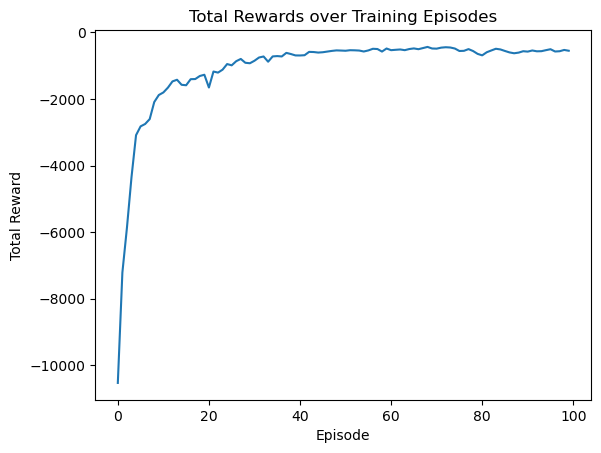

Average Reward over 100 episodes: -420.4692689542771
Total Reward: -431.8566650390627


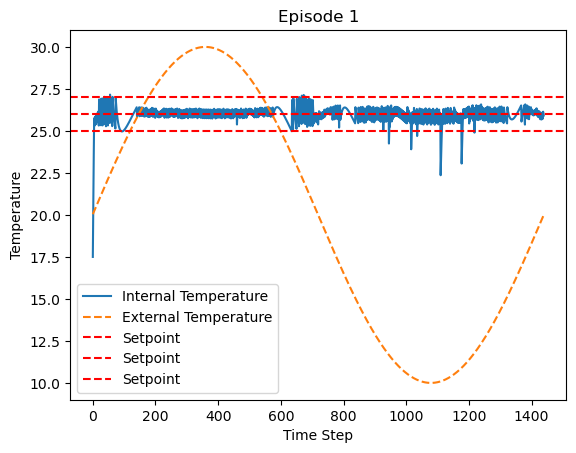

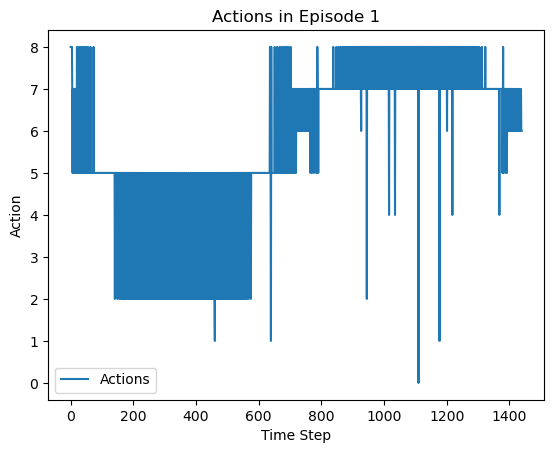

In [109]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.0, noise_ext=0.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -10061.259734475625, Epsilon: 0.01
Episode 2/100, Total Reward: -9047.170801734932, Epsilon: 0.01
Episode 3/100, Total Reward: -3626.860292148591, Epsilon: 0.01
Episode 4/100, Total Reward: -2811.052856445313, Epsilon: 0.01
Episode 5/100, Total Reward: -2950.2928470611573, Epsilon: 0.01
Episode 6/100, Total Reward: -3494.8497211456342, Epsilon: 0.01
Episode 7/100, Total Reward: -2702.4773535728427, Epsilon: 0.01
Episode 8/100, Total Reward: -2923.178242397306, Epsilon: 0.01
Episode 9/100, Total Reward: -2336.214515209198, Epsilon: 0.01
Episode 10/100, Total Reward: -2222.743472862245, Epsilon: 0.01
Episode 11/100, Total Reward: -2589.4777735710136, Epsilon: 0.01
Episode 12/100, Total Reward: -1923.6726793289206, Epsilon: 0.01
Episode 13/100, Total Reward: -1740.7410889625576, Epsilon: 0.01
Episode 14/100, Total Reward: -1365.1595541000358, Epsilon: 0.01
Episode 15/100, Total Reward: -1413.128943157195, Epsilon: 0.01
Episode 16/100, Total Reward: -1540.60657

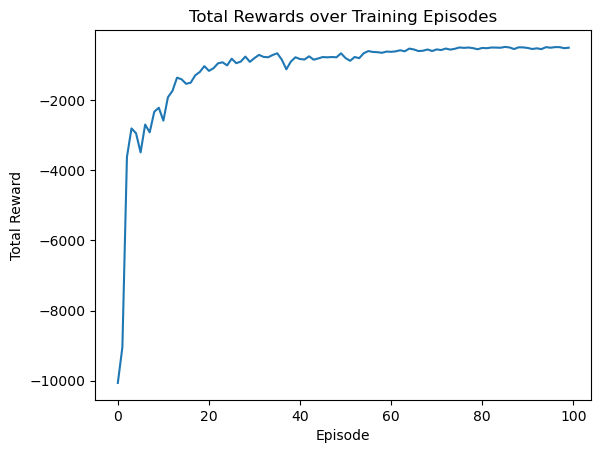

Average Reward over 100 episodes: -505.027565776825
Total Reward: -499.0514810562135


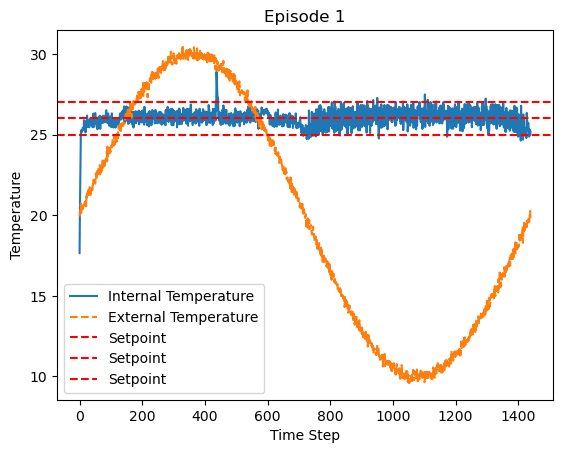

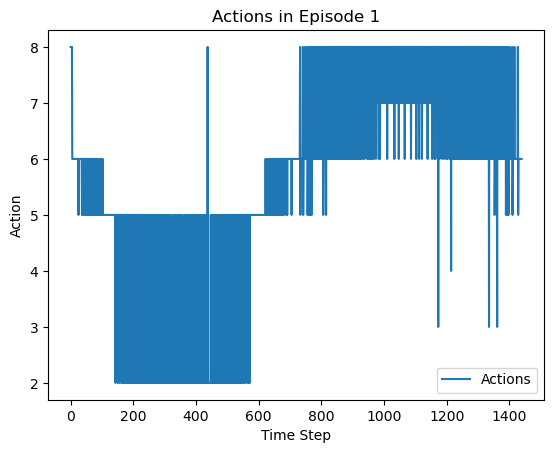

In [110]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.2, noise_ext=0.2)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11147.368119859702, Epsilon: 0.01
Episode 2/100, Total Reward: -7802.11666221619, Epsilon: 0.01
Episode 3/100, Total Reward: -5267.136079025274, Epsilon: 0.01
Episode 4/100, Total Reward: -5446.652777481086, Epsilon: 0.01
Episode 5/100, Total Reward: -4432.959244537353, Epsilon: 0.01
Episode 6/100, Total Reward: -2187.3672742843637, Epsilon: 0.01
Episode 7/100, Total Reward: -1989.751281261443, Epsilon: 0.01
Episode 8/100, Total Reward: -1949.7651755332984, Epsilon: 0.01
Episode 9/100, Total Reward: -2018.4978576660133, Epsilon: 0.01
Episode 10/100, Total Reward: -1876.1283923149117, Epsilon: 0.01
Episode 11/100, Total Reward: -1910.8564902305636, Epsilon: 0.01
Episode 12/100, Total Reward: -1704.3537076950095, Epsilon: 0.01
Episode 13/100, Total Reward: -1512.9766207695018, Epsilon: 0.01
Episode 14/100, Total Reward: -1496.2266537666344, Epsilon: 0.01
Episode 15/100, Total Reward: -1367.3889885902393, Epsilon: 0.01
Episode 16/100, Total Reward: -1600.9885

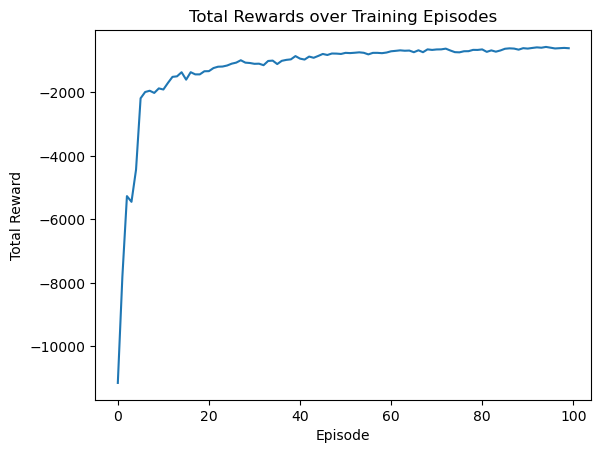

Average Reward over 100 episodes: -562.2894707698822
Total Reward: -559.0982607841489


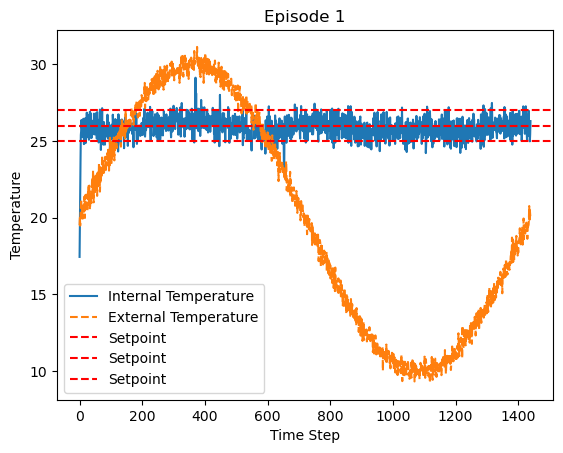

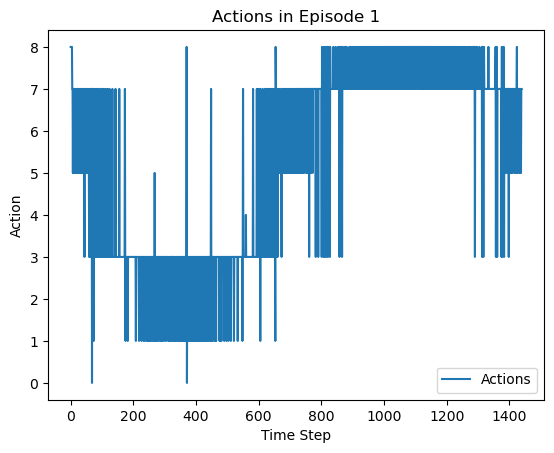

In [111]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.4, noise_ext=0.4)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -12726.883432483664, Epsilon: 0.01
Episode 2/100, Total Reward: -9589.03531999587, Epsilon: 0.01
Episode 3/100, Total Reward: -8904.931561279302, Epsilon: 0.01
Episode 4/100, Total Reward: -4881.788555812837, Epsilon: 0.01
Episode 5/100, Total Reward: -5916.211309242246, Epsilon: 0.01
Episode 6/100, Total Reward: -3268.6459093093877, Epsilon: 0.01
Episode 7/100, Total Reward: -2669.392934799196, Epsilon: 0.01
Episode 8/100, Total Reward: -2357.906186962126, Epsilon: 0.01
Episode 9/100, Total Reward: -2629.2571560859674, Epsilon: 0.01
Episode 10/100, Total Reward: -4317.374945068362, Epsilon: 0.01
Episode 11/100, Total Reward: -2078.116454792024, Epsilon: 0.01
Episode 12/100, Total Reward: -1762.977539157866, Epsilon: 0.01
Episode 13/100, Total Reward: -1546.7721586227428, Epsilon: 0.01
Episode 14/100, Total Reward: -1447.0071044921888, Epsilon: 0.01
Episode 15/100, Total Reward: -1333.9250974655174, Epsilon: 0.01
Episode 16/100, Total Reward: -1246.77612276

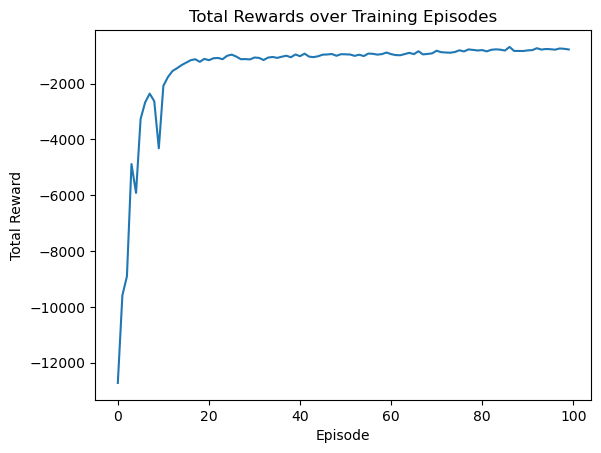

Average Reward over 100 episodes: -714.5881144132613
Total Reward: -709.9597845077511


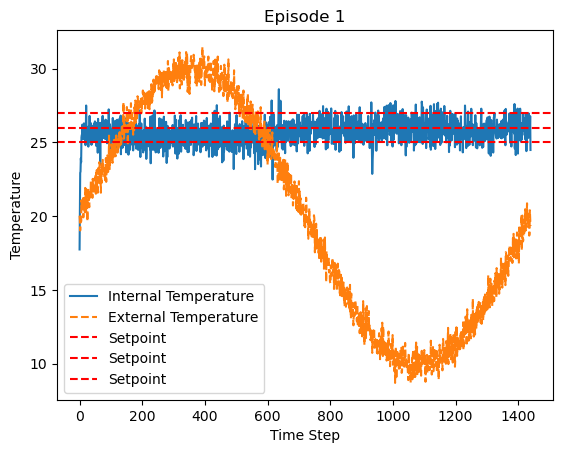

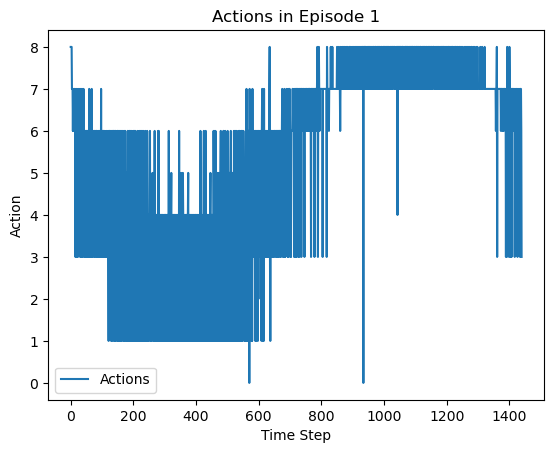

In [112]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.6, noise_ext=0.6)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -12943.807431602481, Epsilon: 0.01
Episode 2/100, Total Reward: -10234.088046979918, Epsilon: 0.01
Episode 3/100, Total Reward: -9636.53787488938, Epsilon: 0.01
Episode 4/100, Total Reward: -4728.378892898559, Epsilon: 0.01
Episode 5/100, Total Reward: -4565.032441997529, Epsilon: 0.01
Episode 6/100, Total Reward: -3362.335307693477, Epsilon: 0.01
Episode 7/100, Total Reward: -3081.9910525321966, Epsilon: 0.01
Episode 8/100, Total Reward: -2614.7083342552146, Epsilon: 0.01
Episode 9/100, Total Reward: -2305.964746093748, Epsilon: 0.01
Episode 10/100, Total Reward: -1884.281407833103, Epsilon: 0.01
Episode 11/100, Total Reward: -1894.6396988868714, Epsilon: 0.01
Episode 12/100, Total Reward: -1859.2396780967717, Epsilon: 0.01
Episode 13/100, Total Reward: -1657.4377892494197, Epsilon: 0.01
Episode 14/100, Total Reward: -1725.1711385726958, Epsilon: 0.01
Episode 15/100, Total Reward: -1854.3162353515618, Epsilon: 0.01
Episode 16/100, Total Reward: -1646.64919

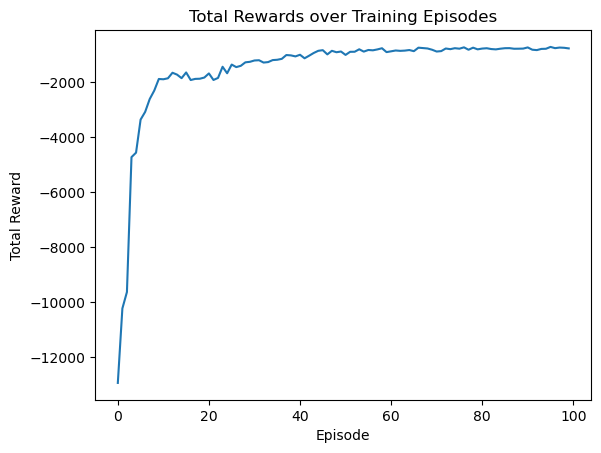

Average Reward over 100 episodes: -623.3321729898452
Total Reward: -622.6267350196827


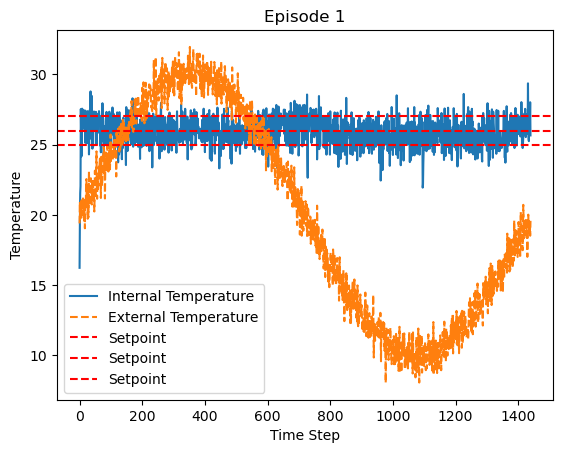

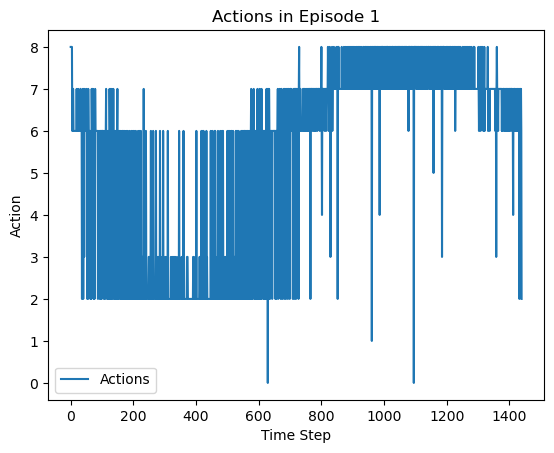

In [113]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.8, noise_ext=0.8)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -12624.450267601002, Epsilon: 0.01
Episode 2/100, Total Reward: -10809.517238831515, Epsilon: 0.01
Episode 3/100, Total Reward: -7352.7872327804635, Epsilon: 0.01
Episode 4/100, Total Reward: -5868.781477069862, Epsilon: 0.01
Episode 5/100, Total Reward: -4717.612127590177, Epsilon: 0.01
Episode 6/100, Total Reward: -2441.4417840957585, Epsilon: 0.01
Episode 7/100, Total Reward: -3160.406041908266, Epsilon: 0.01
Episode 8/100, Total Reward: -2443.839670372015, Epsilon: 0.01
Episode 9/100, Total Reward: -2334.5162482261653, Epsilon: 0.01
Episode 10/100, Total Reward: -1808.0422412872344, Epsilon: 0.01
Episode 11/100, Total Reward: -1720.0229018211373, Epsilon: 0.01
Episode 12/100, Total Reward: -1624.0518997192391, Epsilon: 0.01
Episode 13/100, Total Reward: -1589.160933876038, Epsilon: 0.01
Episode 14/100, Total Reward: -1339.9996088981627, Epsilon: 0.01
Episode 15/100, Total Reward: -1973.7785826683064, Epsilon: 0.01
Episode 16/100, Total Reward: -1301.385

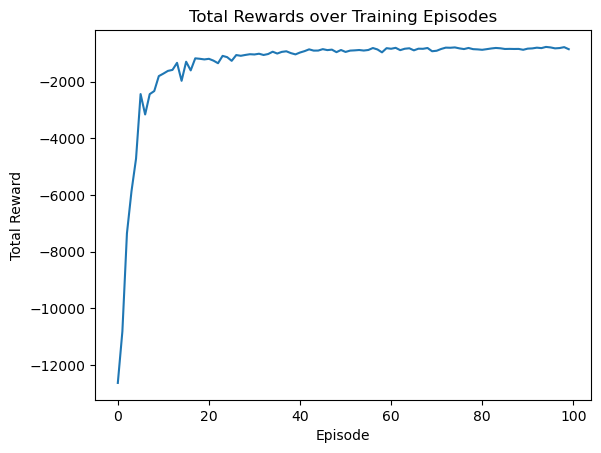

Average Reward over 100 episodes: -731.8405800762176
Total Reward: -734.8845025062554


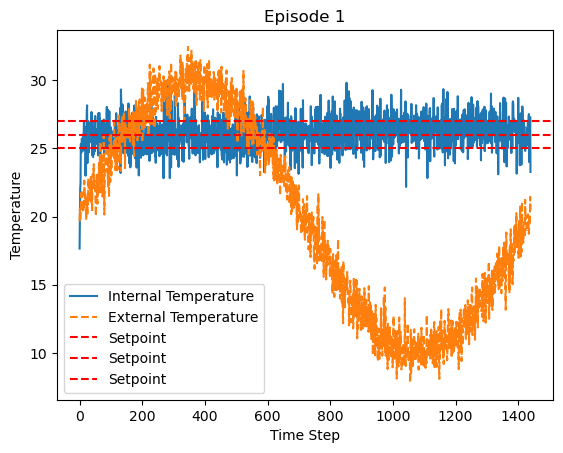

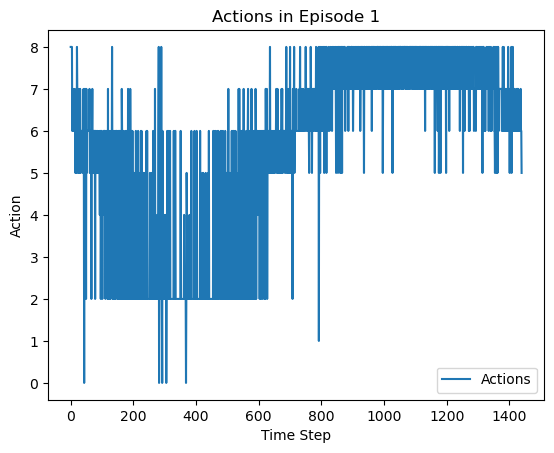

In [114]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=1.0, noise_ext=1.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -14293.866046005496, Epsilon: 0.01
Episode 2/100, Total Reward: -12599.171281480785, Epsilon: 0.01
Episode 3/100, Total Reward: -6582.202892303472, Epsilon: 0.01
Episode 4/100, Total Reward: -3918.648229789737, Epsilon: 0.01
Episode 5/100, Total Reward: -3547.802393341064, Epsilon: 0.01
Episode 6/100, Total Reward: -3091.0229222297676, Epsilon: 0.01
Episode 7/100, Total Reward: -2816.479346561433, Epsilon: 0.01
Episode 8/100, Total Reward: -2543.5874364852907, Epsilon: 0.01
Episode 9/100, Total Reward: -3014.575309848781, Epsilon: 0.01
Episode 10/100, Total Reward: -2797.69965076446, Epsilon: 0.01
Episode 11/100, Total Reward: -2244.819626617432, Epsilon: 0.01
Episode 12/100, Total Reward: -1849.6739601135291, Epsilon: 0.01
Episode 13/100, Total Reward: -1897.3923579215996, Epsilon: 0.01
Episode 14/100, Total Reward: -1611.6304450988757, Epsilon: 0.01
Episode 15/100, Total Reward: -1588.4185877799994, Epsilon: 0.01
Episode 16/100, Total Reward: -1669.635633

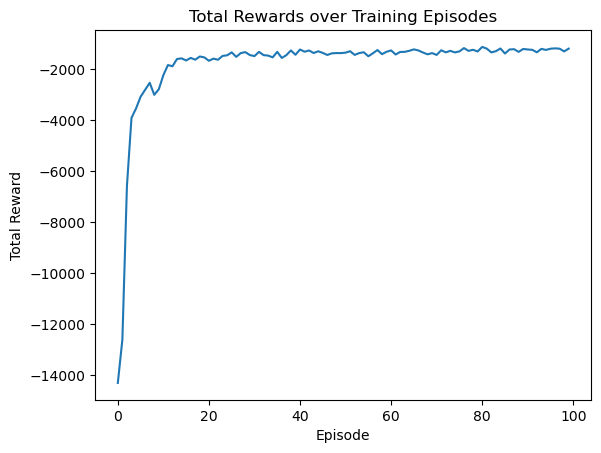

Average Reward over 100 episodes: -1008.5759331941604
Total Reward: -1024.6405039787298


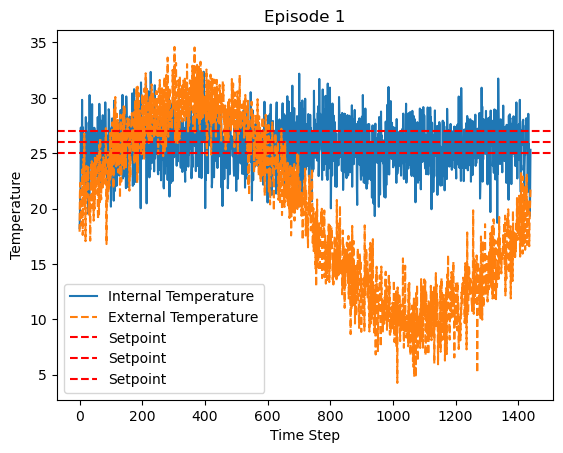

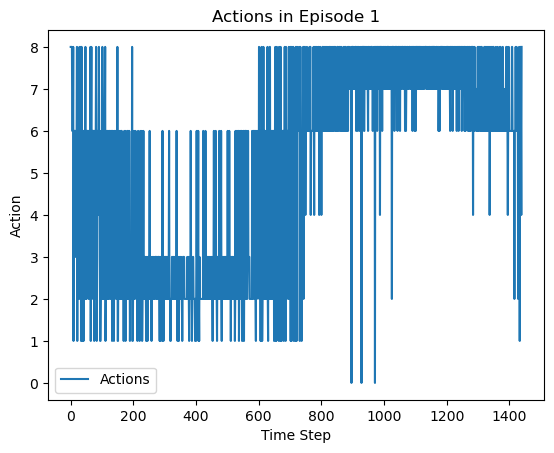

In [115]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=2.0, noise_ext=2.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11339.944595336898, Epsilon: 0.01
Episode 2/100, Total Reward: -7522.092493629442, Epsilon: 0.01
Episode 3/100, Total Reward: -4010.4950948715195, Epsilon: 0.01
Episode 4/100, Total Reward: -2674.213682842252, Epsilon: 0.01
Episode 5/100, Total Reward: -2637.957256603242, Epsilon: 0.01
Episode 6/100, Total Reward: -2451.863352489475, Epsilon: 0.01
Episode 7/100, Total Reward: -2235.547080039979, Epsilon: 0.01
Episode 8/100, Total Reward: -2040.9816819190974, Epsilon: 0.01
Episode 9/100, Total Reward: -1987.521166515348, Epsilon: 0.01
Episode 10/100, Total Reward: -1616.4844129562382, Epsilon: 0.01
Episode 11/100, Total Reward: -1977.058034896852, Epsilon: 0.01
Episode 12/100, Total Reward: -1769.342256259913, Epsilon: 0.01
Episode 13/100, Total Reward: -1803.3954796791127, Epsilon: 0.01
Episode 14/100, Total Reward: -1617.6180755615255, Epsilon: 0.01
Episode 15/100, Total Reward: -1752.6458591461162, Epsilon: 0.01
Episode 16/100, Total Reward: -1838.998963

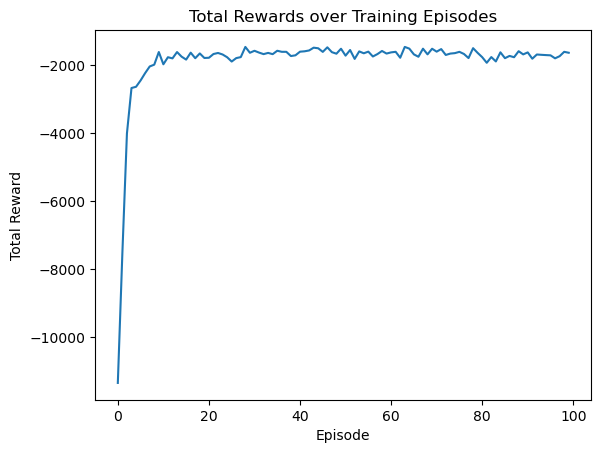

Average Reward over 100 episodes: -2474.903389645576
Total Reward: -2299.816676425932


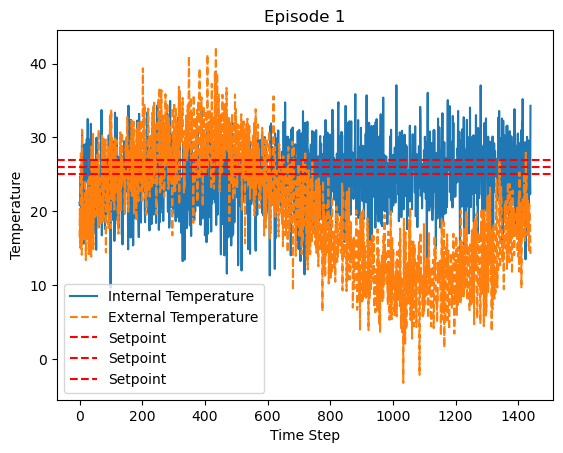

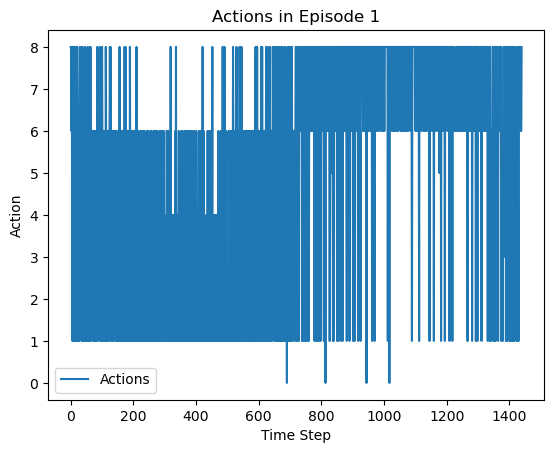

In [116]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=4.0, noise_ext=4.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11810.777682971964, Epsilon: 0.01
Episode 2/100, Total Reward: -5342.620474815377, Epsilon: 0.01
Episode 3/100, Total Reward: -5282.436980915065, Epsilon: 0.01
Episode 4/100, Total Reward: -4972.4056726455765, Epsilon: 0.01
Episode 5/100, Total Reward: -3889.3891879081734, Epsilon: 0.01
Episode 6/100, Total Reward: -3895.2761290550225, Epsilon: 0.01
Episode 7/100, Total Reward: -3660.1640693664576, Epsilon: 0.01
Episode 8/100, Total Reward: -3472.560246944425, Epsilon: 0.01
Episode 9/100, Total Reward: -3793.0600431442235, Epsilon: 0.01
Episode 10/100, Total Reward: -4169.215889549255, Epsilon: 0.01
Episode 11/100, Total Reward: -4318.865616989135, Epsilon: 0.01
Episode 12/100, Total Reward: -4192.544301033018, Epsilon: 0.01
Episode 13/100, Total Reward: -3361.131361675265, Epsilon: 0.01
Episode 14/100, Total Reward: -4926.18907957077, Epsilon: 0.01
Episode 15/100, Total Reward: -4226.621055126191, Epsilon: 0.01
Episode 16/100, Total Reward: -4057.88714208

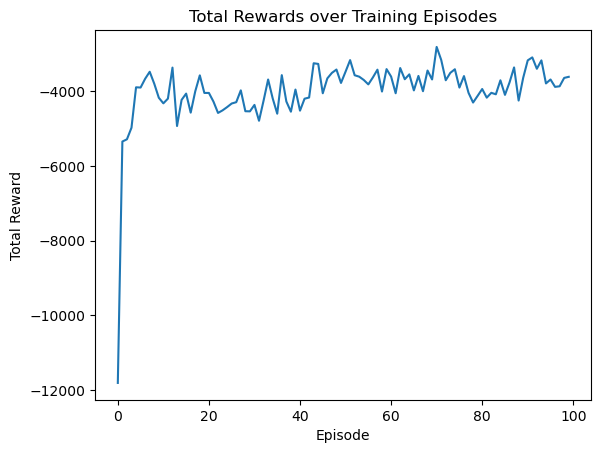

Average Reward over 100 episodes: -3103.05806124115
Total Reward: -3290.648325634004


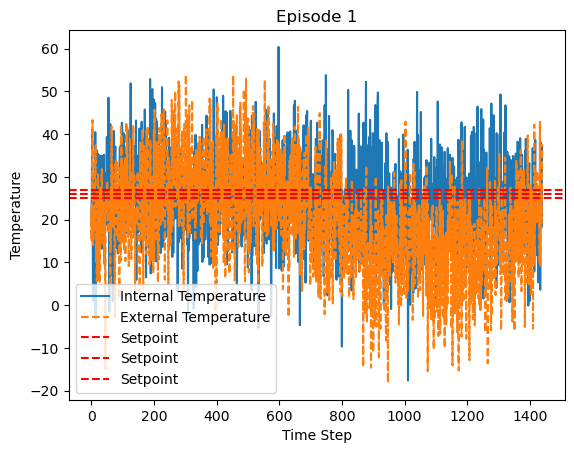

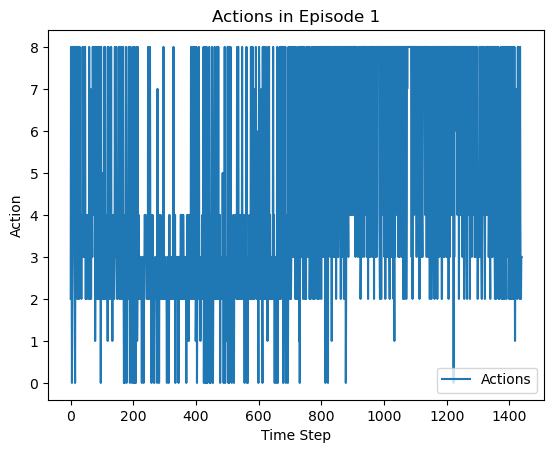

In [117]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=10.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(state_size, action_size)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

In [9]:
def parameter_sensitivity(env, parameter_name, parameter_values, episodes=100, eval_episodes=100):
    results = {}
    for value in parameter_values:
        if parameter_name == "gamma":
            agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, gamma=value)
        elif parameter_name == "lr":
            agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, lr=value)
        elif parameter_name == "epsilon_decay":
            agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, epsilon_decay=value)
        
        agent.train(env, episodes)
        avg_reward, rewards = agent.evaluate(env, eval_episodes)
        results[value] = avg_reward
        print(f"{parameter_name}={value}, Average Reward={avg_reward}")
    
    plt.figure()
    plt.plot(list(results.keys()), list(results.values()), marker='o')
    plt.xlabel(parameter_name)
    plt.ylabel("Average Reward")
    plt.title(f"Sensitivity Analysis for {parameter_name}")
    plt.show()

/var/folders/bc/w0vf4dmn7p1407d71bmfq97r0000gn/T/ipykernel_66262/3887376785.py:69: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:281.)
  states = torch.FloatTensor(states).to(self.device)


Episode 1/100, Total Reward: -17501.567481824026, Epsilon: 0.01
Episode 2/100, Total Reward: -18265.798105326252, Epsilon: 0.01
Episode 3/100, Total Reward: -10628.014121913899, Epsilon: 0.01
Episode 4/100, Total Reward: -9940.547538757319, Epsilon: 0.01
Episode 5/100, Total Reward: -11129.529881763458, Epsilon: 0.01
Episode 6/100, Total Reward: -10604.956381511694, Epsilon: 0.01
Episode 7/100, Total Reward: -10566.620214843753, Epsilon: 0.01
Episode 8/100, Total Reward: -10490.134741592412, Epsilon: 0.01
Episode 9/100, Total Reward: -11355.949356365214, Epsilon: 0.01
Episode 10/100, Total Reward: -11425.616027355194, Epsilon: 0.01
Episode 11/100, Total Reward: -10933.129570102696, Epsilon: 0.01
Episode 12/100, Total Reward: -10821.723916912091, Epsilon: 0.01
Episode 13/100, Total Reward: -10706.695203495035, Epsilon: 0.01
Episode 14/100, Total Reward: -10781.399812793725, Epsilon: 0.01
Episode 15/100, Total Reward: -10799.768837738025, Epsilon: 0.01
Episode 16/100, Total Reward: -1112

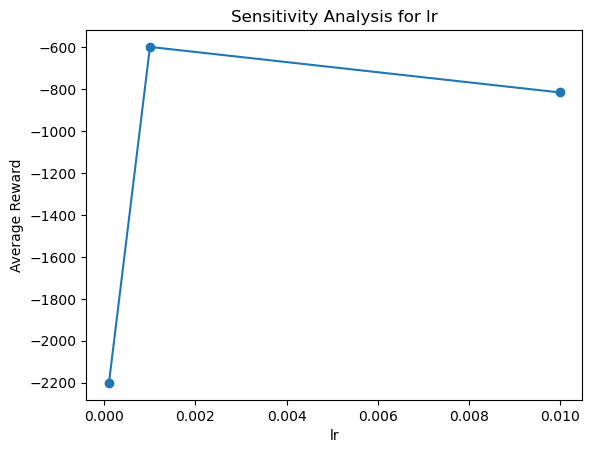

In [12]:
env = RoomTemperatureControlEnv()
    
learning_rates = [0.0001, 0.001, 0.01]
parameter_sensitivity(env, "lr", learning_rates, episodes=100, eval_episodes=100)

Episode 1/100, Total Reward: -10583.850362205489, Epsilon: 0.01
Episode 2/100, Total Reward: -7338.96953668593, Epsilon: 0.01
Episode 3/100, Total Reward: -2821.8731293678347, Epsilon: 0.01
Episode 4/100, Total Reward: -5022.804643917086, Epsilon: 0.01
Episode 5/100, Total Reward: -2381.522355270384, Epsilon: 0.01
Episode 6/100, Total Reward: -1423.9312266349793, Epsilon: 0.01
Episode 7/100, Total Reward: -1335.8260407447833, Epsilon: 0.01
Episode 8/100, Total Reward: -1198.7499706268316, Epsilon: 0.01
Episode 9/100, Total Reward: -1149.267192840576, Epsilon: 0.01
Episode 10/100, Total Reward: -993.5642425537117, Epsilon: 0.01
Episode 11/100, Total Reward: -985.656302070617, Epsilon: 0.01
Episode 12/100, Total Reward: -940.1504971504212, Epsilon: 0.01
Episode 13/100, Total Reward: -937.8489486694334, Epsilon: 0.01
Episode 14/100, Total Reward: -870.53992881775, Epsilon: 0.01
Episode 15/100, Total Reward: -843.6952385902409, Epsilon: 0.01
Episode 16/100, Total Reward: -844.4587402343753

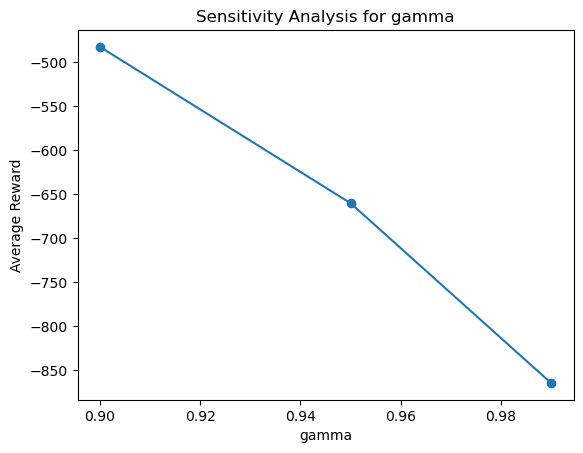

In [13]:
env = RoomTemperatureControlEnv()

discount_factors = [0.9, 0.95, 0.99]
parameter_sensitivity(env, "gamma", discount_factors, episodes=100, eval_episodes=100)

Episode 1/100, Total Reward: -11556.471692752832, Epsilon: 0.01
Episode 2/100, Total Reward: -9829.902268314372, Epsilon: 0.01
Episode 3/100, Total Reward: -8200.456094646455, Epsilon: 0.01
Episode 4/100, Total Reward: -6759.113232612594, Epsilon: 0.01
Episode 5/100, Total Reward: -6193.1842712402395, Epsilon: 0.01
Episode 6/100, Total Reward: -4127.526417160037, Epsilon: 0.01
Episode 7/100, Total Reward: -3290.0318639755224, Epsilon: 0.01
Episode 8/100, Total Reward: -2399.709703159332, Epsilon: 0.01
Episode 9/100, Total Reward: -2185.6438843727124, Epsilon: 0.01
Episode 10/100, Total Reward: -2503.1391199111954, Epsilon: 0.01
Episode 11/100, Total Reward: -2584.920235252382, Epsilon: 0.01
Episode 12/100, Total Reward: -2456.591394329074, Epsilon: 0.01
Episode 13/100, Total Reward: -2427.276400566099, Epsilon: 0.01
Episode 14/100, Total Reward: -2210.8135107040416, Epsilon: 0.01
Episode 15/100, Total Reward: -2412.4422212600716, Epsilon: 0.01
Episode 16/100, Total Reward: -2109.786027

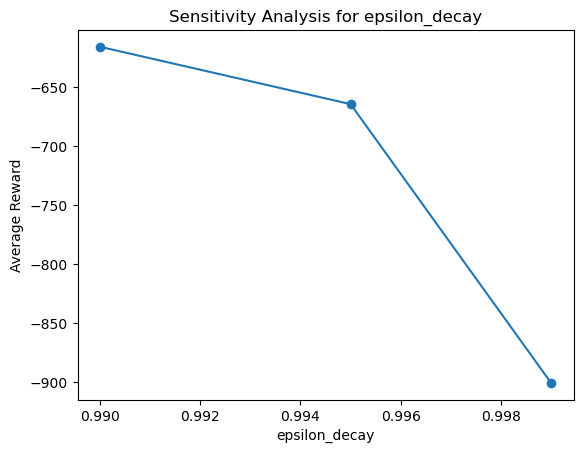

In [22]:
env = RoomTemperatureControlEnv()

epsilon_decays = [0.99, 0.995, 0.999]
parameter_sensitivity(env, "epsilon_decay", epsilon_decays, episodes=100, eval_episodes=100)

Episode 1/100, Total Reward: -11281.850363799924, Epsilon: 0.01
Episode 2/100, Total Reward: -6650.057266521453, Epsilon: 0.01
Episode 3/100, Total Reward: -4456.4657447814925, Epsilon: 0.01
Episode 4/100, Total Reward: -3777.131377410888, Epsilon: 0.01
Episode 5/100, Total Reward: -3398.4890722274768, Epsilon: 0.01
Episode 6/100, Total Reward: -3100.2390823364285, Epsilon: 0.01
Episode 7/100, Total Reward: -2344.5301394462576, Epsilon: 0.01
Episode 8/100, Total Reward: -2575.5374709129374, Epsilon: 0.01
Episode 9/100, Total Reward: -1310.586916255951, Epsilon: 0.01
Episode 10/100, Total Reward: -1070.0374143600461, Epsilon: 0.01
Episode 11/100, Total Reward: -903.4184550285344, Epsilon: 0.01
Episode 12/100, Total Reward: -939.9199415206917, Epsilon: 0.01
Episode 13/100, Total Reward: -853.6487090110778, Epsilon: 0.01
Episode 14/100, Total Reward: -795.0826676368712, Epsilon: 0.01
Episode 15/100, Total Reward: -784.9052082061779, Epsilon: 0.01
Episode 16/100, Total Reward: -776.5114998

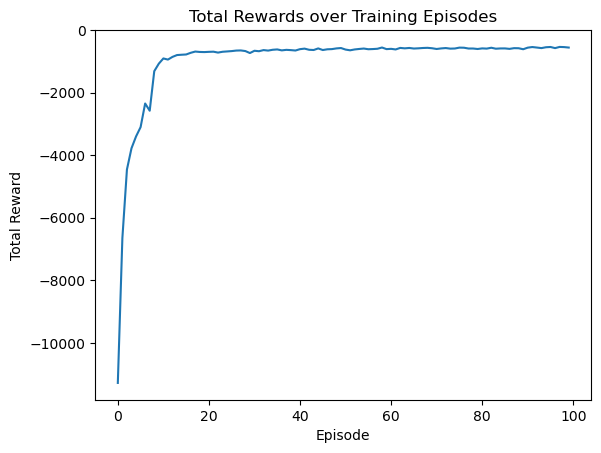

Average Reward over 100 episodes: -686.0778654823303
Total Reward: -694.1159709930425


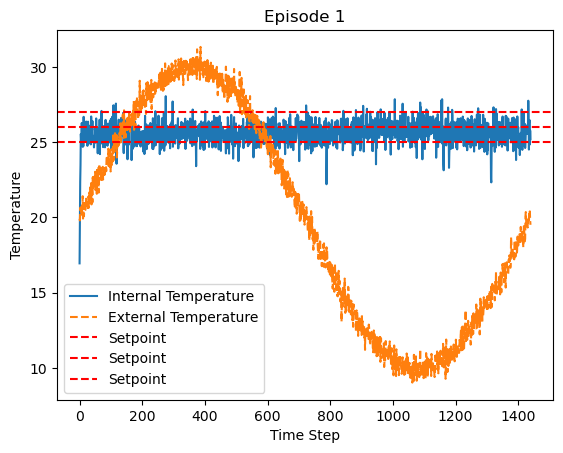

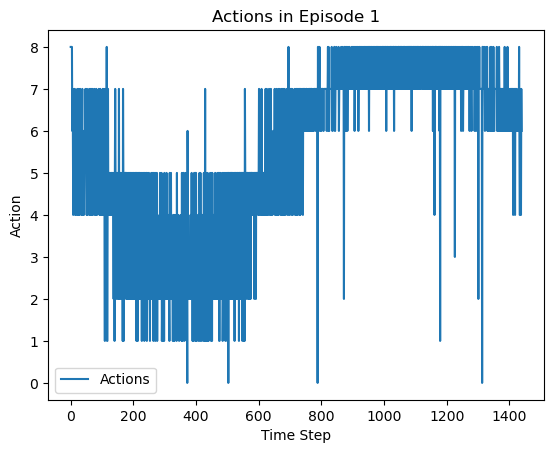

In [30]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv()
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, lr=0.001, epsilon_decay=0.99, gamma=0.9)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -9667.315390634538, Epsilon: 0.01
Episode 2/100, Total Reward: -4668.169293689725, Epsilon: 0.01
Episode 3/100, Total Reward: -3418.7068549156184, Epsilon: 0.01
Episode 4/100, Total Reward: -2861.3157474517807, Epsilon: 0.01
Episode 5/100, Total Reward: -1516.069883632659, Epsilon: 0.01
Episode 6/100, Total Reward: -1070.7682154655438, Epsilon: 0.01
Episode 7/100, Total Reward: -841.807704448701, Epsilon: 0.01
Episode 8/100, Total Reward: -834.9725963592532, Epsilon: 0.01
Episode 9/100, Total Reward: -764.2842614173879, Epsilon: 0.01
Episode 10/100, Total Reward: -749.0871998786938, Epsilon: 0.01
Episode 11/100, Total Reward: -672.6495264053352, Epsilon: 0.01
Episode 12/100, Total Reward: -664.7925757408141, Epsilon: 0.01
Episode 13/100, Total Reward: -626.5754281997683, Epsilon: 0.01
Episode 14/100, Total Reward: -667.1300445556633, Epsilon: 0.01
Episode 15/100, Total Reward: -581.8544188499452, Epsilon: 0.01
Episode 16/100, Total Reward: -594.119578647613

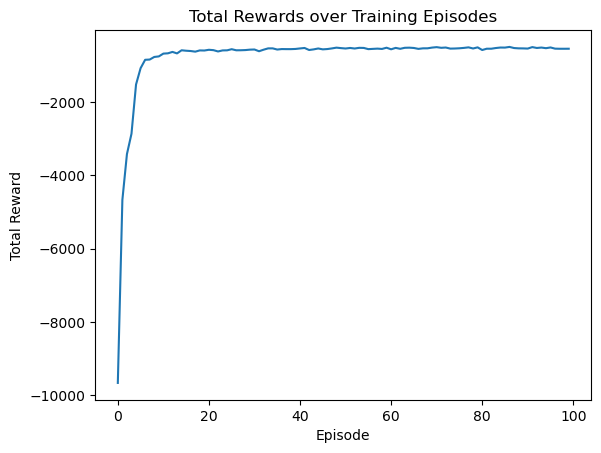

Average Reward over 100 episodes: -449.3398739109039
Total Reward: -469.01828184127805


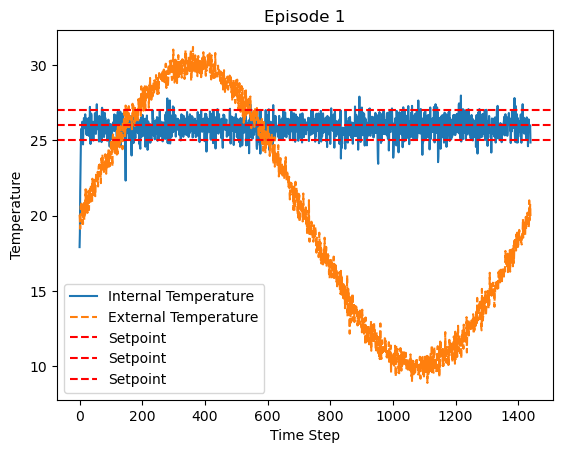

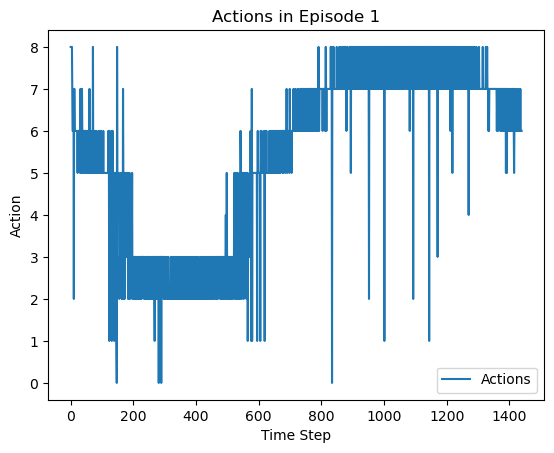

In [32]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv()
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, lr=0.001, epsilon_decay=0.99, gamma=0.9)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -10395.083660244936, Epsilon: 0.01
Episode 2/100, Total Reward: -4665.612732028953, Epsilon: 0.01
Episode 3/100, Total Reward: -4041.1552756309493, Epsilon: 0.01
Episode 4/100, Total Reward: -3316.389227008815, Epsilon: 0.01
Episode 5/100, Total Reward: -3476.085562419886, Epsilon: 0.01
Episode 6/100, Total Reward: -3067.119641494751, Epsilon: 0.01
Episode 7/100, Total Reward: -3300.5918722152683, Epsilon: 0.01
Episode 8/100, Total Reward: -3258.483858108524, Epsilon: 0.01
Episode 9/100, Total Reward: -3151.7714898109402, Epsilon: 0.01
Episode 10/100, Total Reward: -3097.8769399642924, Epsilon: 0.01
Episode 11/100, Total Reward: -3034.869669532772, Epsilon: 0.01
Episode 12/100, Total Reward: -3102.0539224624613, Epsilon: 0.01
Episode 13/100, Total Reward: -3206.909620952608, Epsilon: 0.01
Episode 14/100, Total Reward: -3096.6376449584914, Epsilon: 0.01
Episode 15/100, Total Reward: -3280.454954624174, Epsilon: 0.01
Episode 16/100, Total Reward: -3258.234071

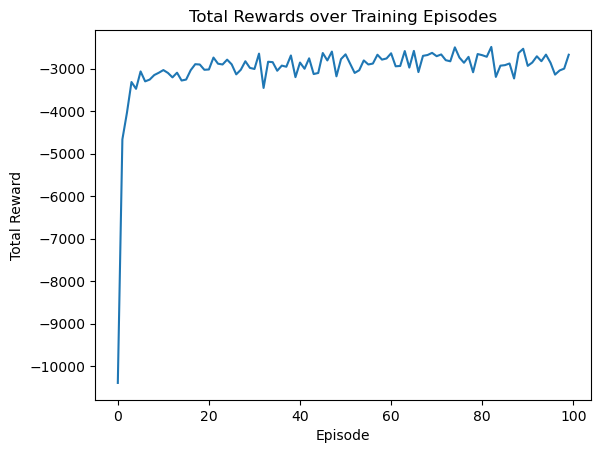

Average Reward over 100 episodes: -2717.231517654418
Total Reward: -2688.6956224441506


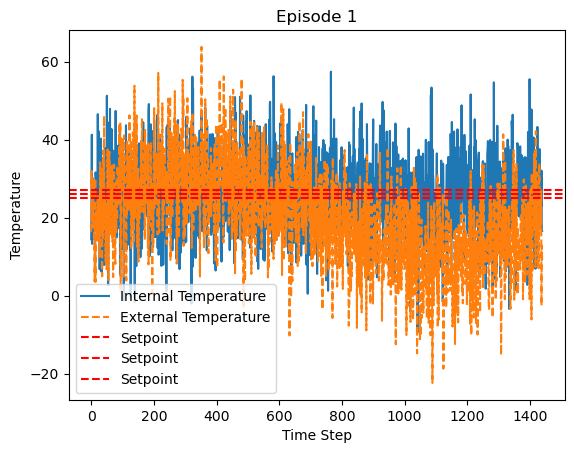

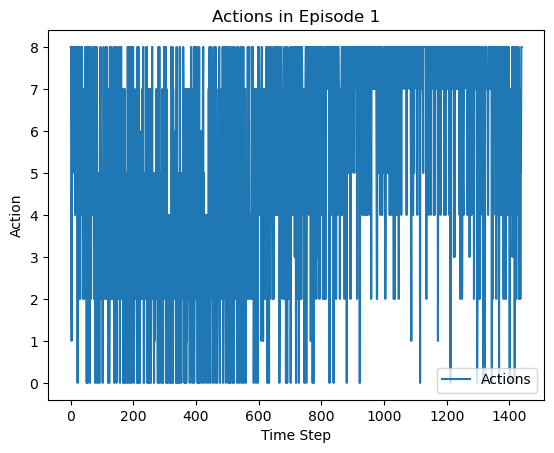

In [34]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=10.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, lr=0.001, epsilon_decay=0.99, gamma=0.9)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -11585.825882285828, Epsilon: 0.01
Episode 2/100, Total Reward: -3110.705274391176, Epsilon: 0.01
Episode 3/100, Total Reward: -3839.516028404238, Epsilon: 0.01
Episode 4/100, Total Reward: -2732.9852006912247, Epsilon: 0.01
Episode 5/100, Total Reward: -1695.3875297546392, Epsilon: 0.01
Episode 6/100, Total Reward: -1279.8473299026502, Epsilon: 0.01
Episode 7/100, Total Reward: -1262.107827186586, Epsilon: 0.01
Episode 8/100, Total Reward: -1137.9330475807217, Epsilon: 0.01
Episode 9/100, Total Reward: -1134.4624632835387, Epsilon: 0.01
Episode 10/100, Total Reward: -1138.4740958213797, Epsilon: 0.01
Episode 11/100, Total Reward: -1100.2662591934209, Epsilon: 0.01
Episode 12/100, Total Reward: -1079.2200937271105, Epsilon: 0.01
Episode 13/100, Total Reward: -1101.4927166938776, Epsilon: 0.01
Episode 14/100, Total Reward: -1089.0175232887268, Epsilon: 0.01
Episode 15/100, Total Reward: -1083.1665561676023, Epsilon: 0.01
Episode 16/100, Total Reward: -1063.8

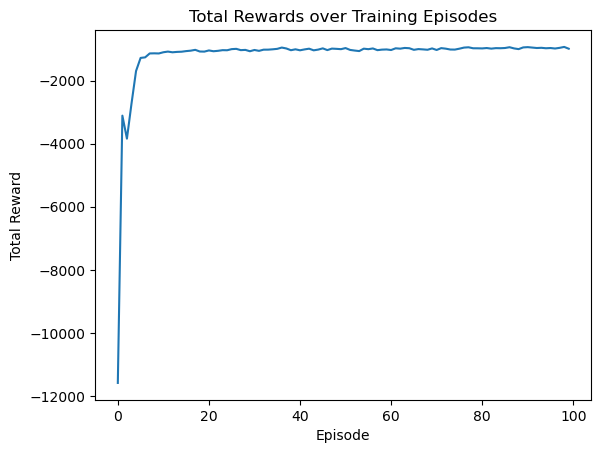

Average Reward over 100 episodes: -965.5479191589357
Total Reward: -954.8243574142449


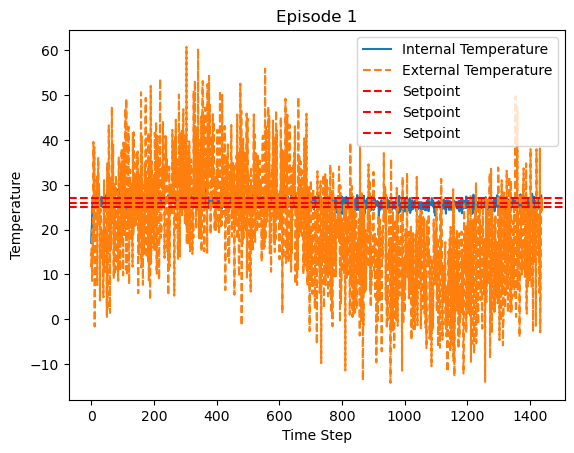

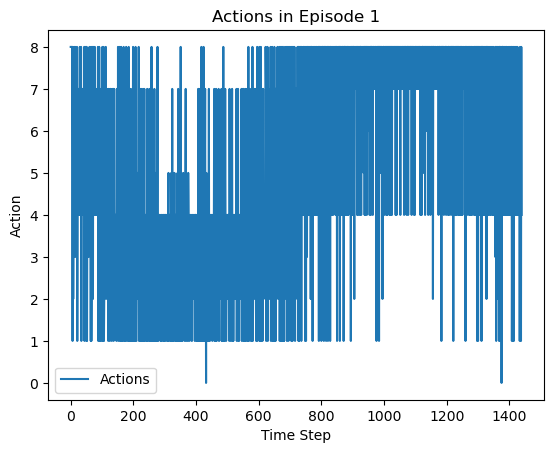

In [44]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=10.0)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, lr=0.001, epsilon_decay=0.99, gamma=0.9)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -8887.392781591414, Epsilon: 0.01
Episode 2/100, Total Reward: -5275.794204616551, Epsilon: 0.01
Episode 3/100, Total Reward: -2866.393538665763, Epsilon: 0.01
Episode 4/100, Total Reward: -3203.5229373931897, Epsilon: 0.01
Episode 5/100, Total Reward: -2461.8053672790493, Epsilon: 0.01
Episode 6/100, Total Reward: -2461.182558250429, Epsilon: 0.01
Episode 7/100, Total Reward: -2668.1844810485823, Epsilon: 0.01
Episode 8/100, Total Reward: -2552.2103462219225, Epsilon: 0.01
Episode 9/100, Total Reward: -2257.8070813179024, Epsilon: 0.01
Episode 10/100, Total Reward: -1858.1435709953284, Epsilon: 0.01
Episode 11/100, Total Reward: -1683.9926001548772, Epsilon: 0.01
Episode 12/100, Total Reward: -1480.2100979804986, Epsilon: 0.01
Episode 13/100, Total Reward: -1771.7989867210397, Epsilon: 0.01
Episode 14/100, Total Reward: -1619.8366460800185, Epsilon: 0.01
Episode 15/100, Total Reward: -1768.3467692375157, Epsilon: 0.01
Episode 16/100, Total Reward: -1647.97

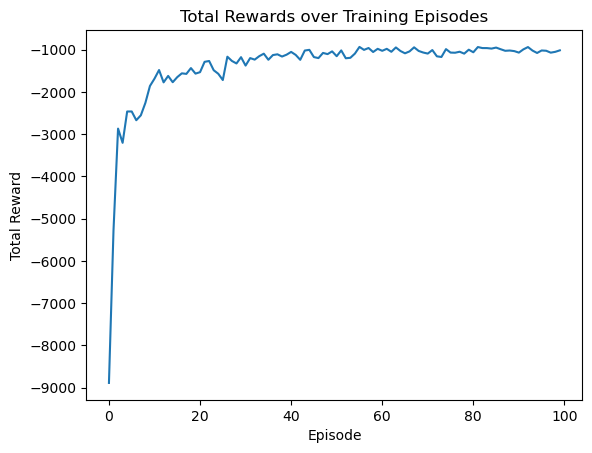

Average Reward over 100 episodes: -1043.3450360660554
Total Reward: -1005.071530151368


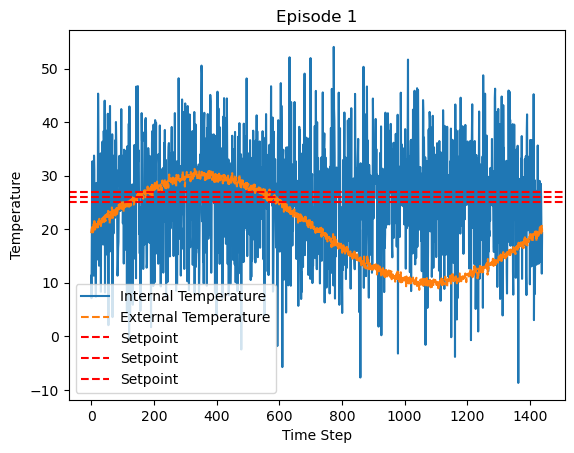

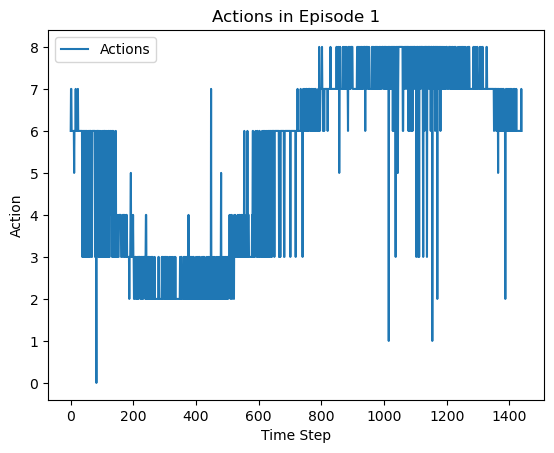

In [40]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=0.5)
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, lr=0.001, epsilon_decay=0.99, gamma=0.9)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Episode 1/100, Total Reward: -10495.111224582784, Epsilon: 0.01
Episode 2/100, Total Reward: -5076.55385961532, Epsilon: 0.01
Episode 3/100, Total Reward: -2580.634820461273, Epsilon: 0.01
Episode 4/100, Total Reward: -2397.4360701560972, Epsilon: 0.01
Episode 5/100, Total Reward: -1950.688284969329, Epsilon: 0.01
Episode 6/100, Total Reward: -1453.0884710311932, Epsilon: 0.01
Episode 7/100, Total Reward: -1215.9682492256156, Epsilon: 0.01
Episode 8/100, Total Reward: -1080.4247247695928, Epsilon: 0.01
Episode 9/100, Total Reward: -1117.6629537582398, Epsilon: 0.01
Episode 10/100, Total Reward: -1151.6848403930671, Epsilon: 0.01
Episode 11/100, Total Reward: -1048.3103744506845, Epsilon: 0.01
Episode 12/100, Total Reward: -1086.195378494264, Epsilon: 0.01
Episode 13/100, Total Reward: -1034.4777687072738, Epsilon: 0.01
Episode 14/100, Total Reward: -1027.563591384887, Epsilon: 0.01
Episode 15/100, Total Reward: -1033.006278705598, Epsilon: 0.01
Episode 16/100, Total Reward: -1054.14558

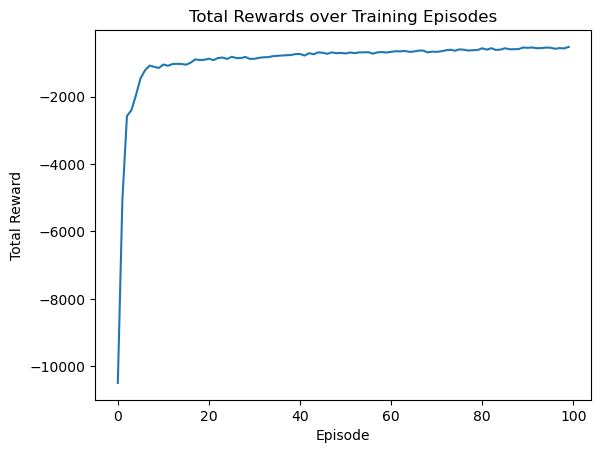

In [35]:
# Train and evaluate the DQN agent
env = RoomTemperatureControlEnv()
state_size = env.observation_space.shape[0]
action_size = env.action_space.n

dqn_agent = DQNAgent(env.observation_space.shape[0], env.action_space.n, lr=0.001, epsilon_decay=0.99, gamma=0.9)
dqn_agent.train(env, episodes=100)

# Plot training rewards
plot_training_rewards(dqn_agent.training_rewards)

Average Reward over 100 episodes: -588.7255757761002
Total Reward: -593.1453994750982


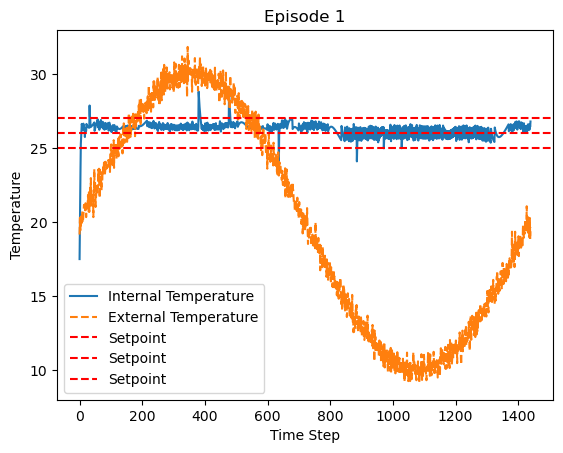

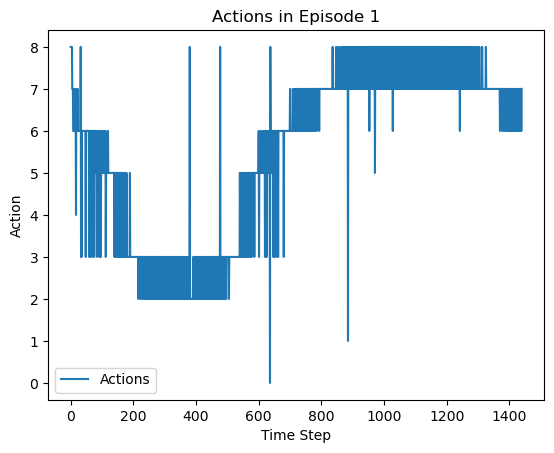

In [50]:
env = RoomTemperatureControlEnv(noise_int=0.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1328.8927962436674
Total Reward: -1340.1287610053998


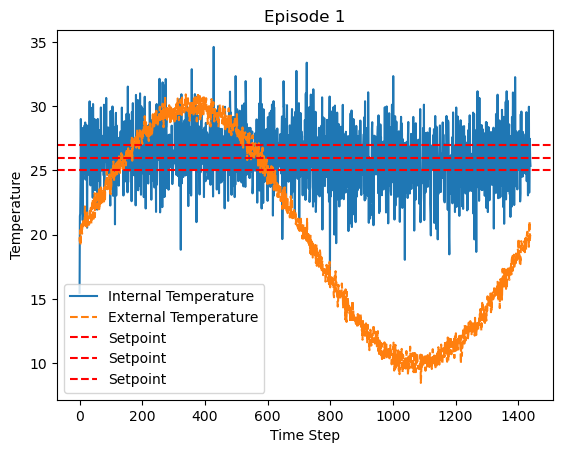

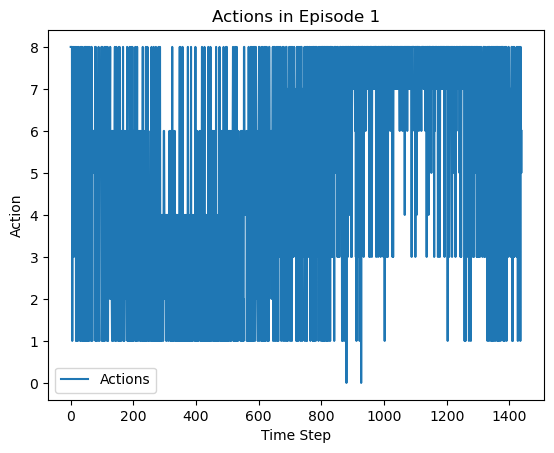

In [19]:
env = RoomTemperatureControlEnv(noise_int=2.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1810.0856180152887
Total Reward: -1890.8849135398846


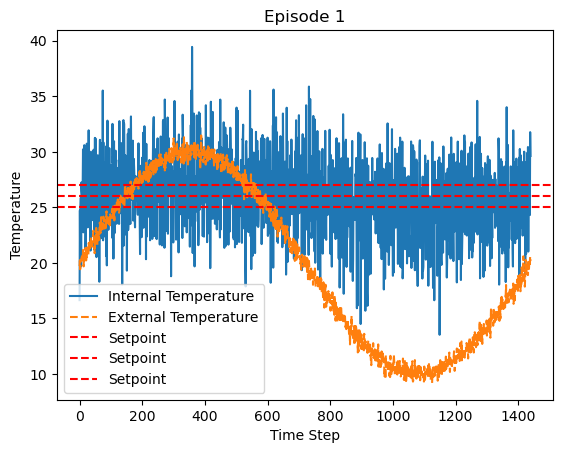

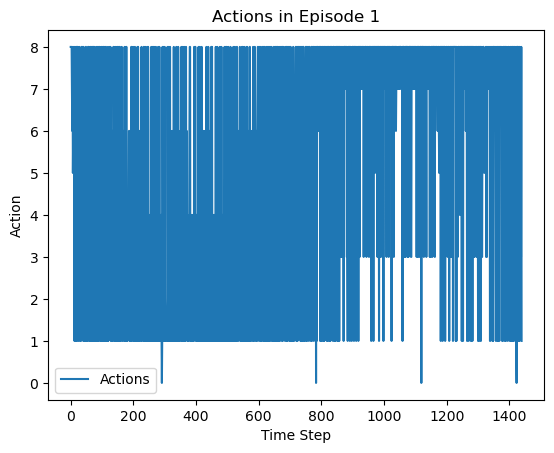

In [21]:
env = RoomTemperatureControlEnv(noise_int=3.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -2257.336992353439
Total Reward: -2208.376446151734


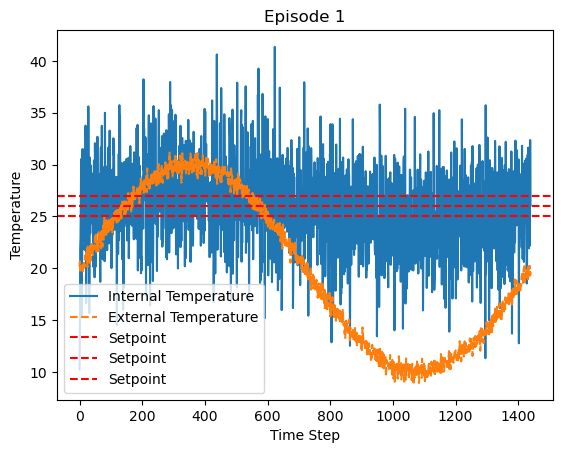

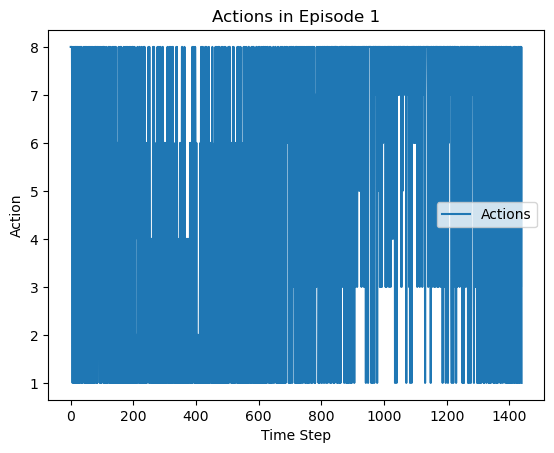

In [23]:
env = RoomTemperatureControlEnv(noise_int=4.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -2677.174092617034
Total Reward: -2572.9493046760545


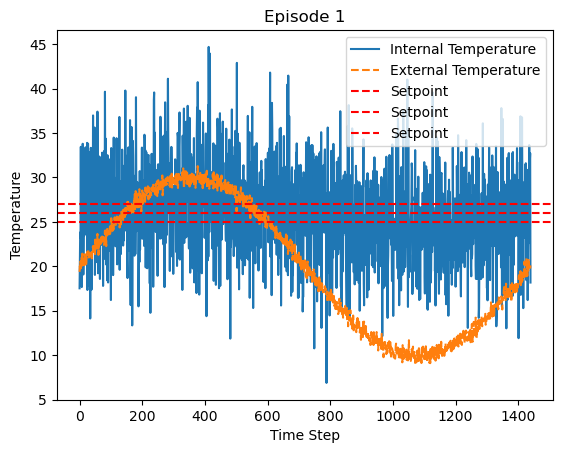

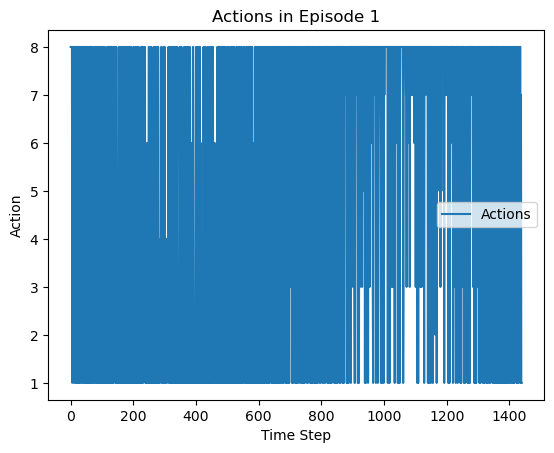

In [24]:
env = RoomTemperatureControlEnv(noise_int=5.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3079.7909331417077
Total Reward: -3128.8479958534244


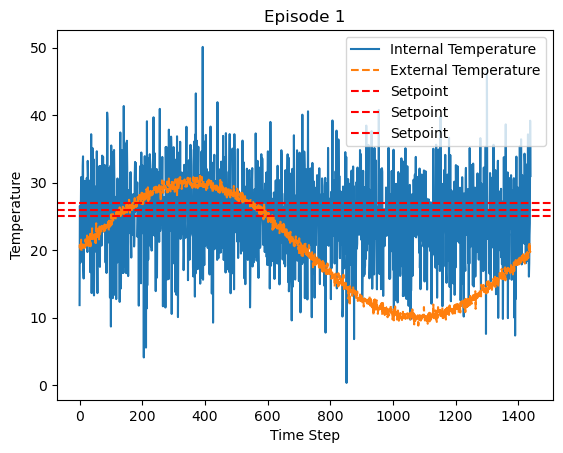

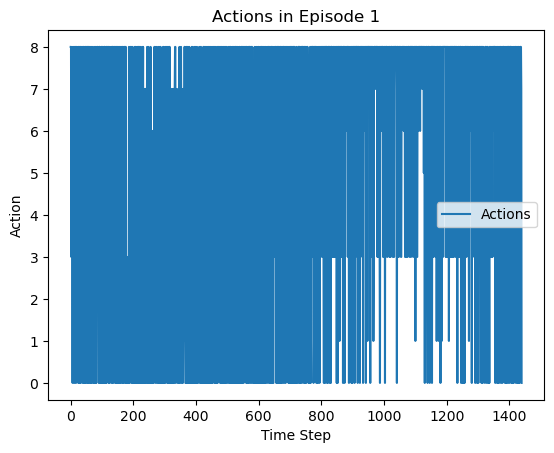

In [36]:
env = RoomTemperatureControlEnv(noise_int=6.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3424.491347865104
Total Reward: -3339.2487463951084


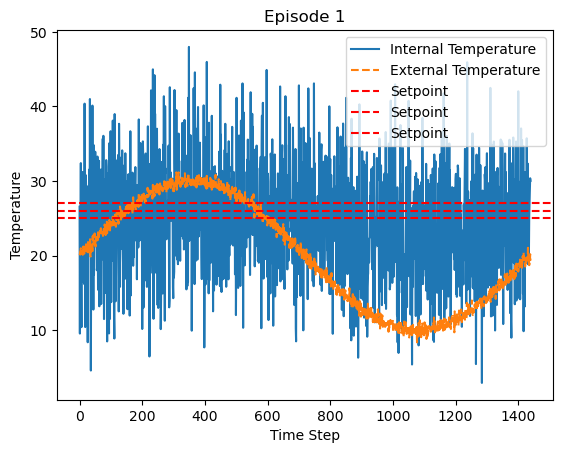

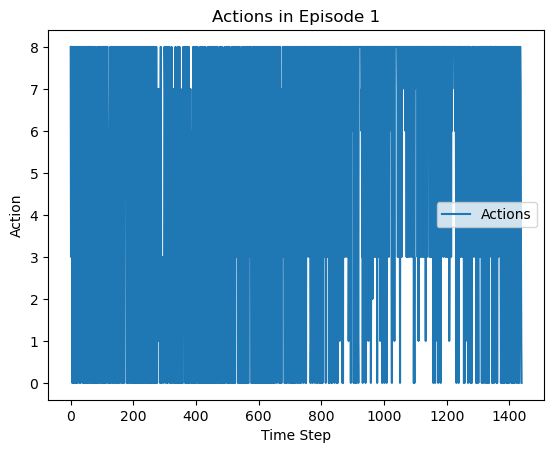

In [37]:
env = RoomTemperatureControlEnv(noise_int=7.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3793.874418568611
Total Reward: -3763.4001719474786


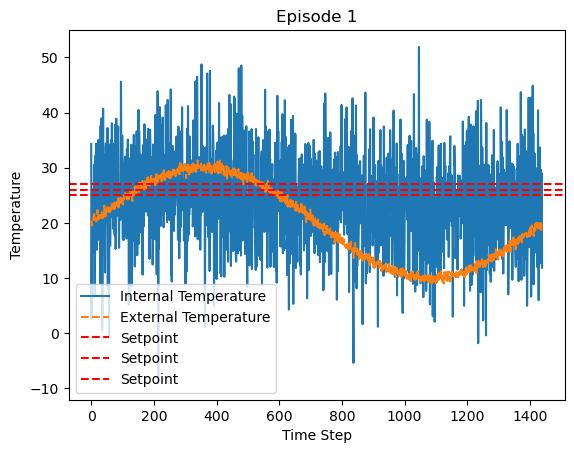

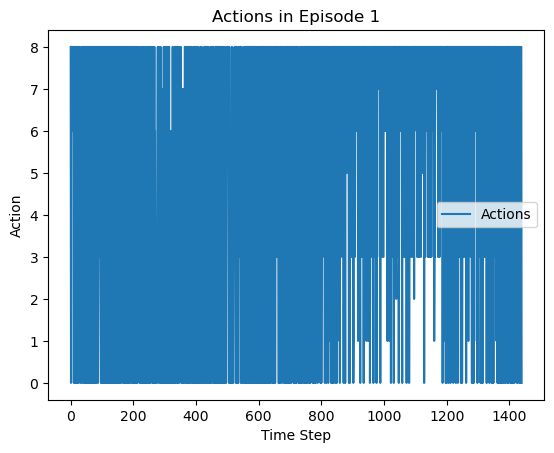

In [38]:
env = RoomTemperatureControlEnv(noise_int=8.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -4070.5474424676895
Total Reward: -4187.7679406166135


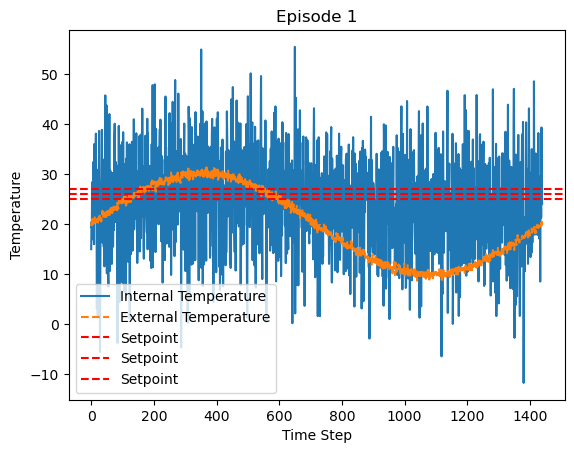

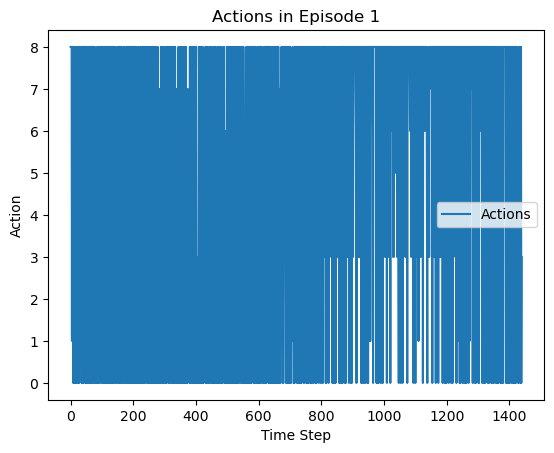

In [39]:
env = RoomTemperatureControlEnv(noise_int=9.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -4402.719548719408
Total Reward: -4379.989226436613


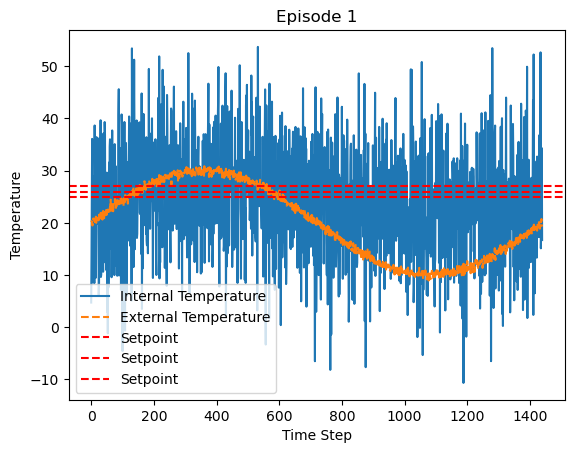

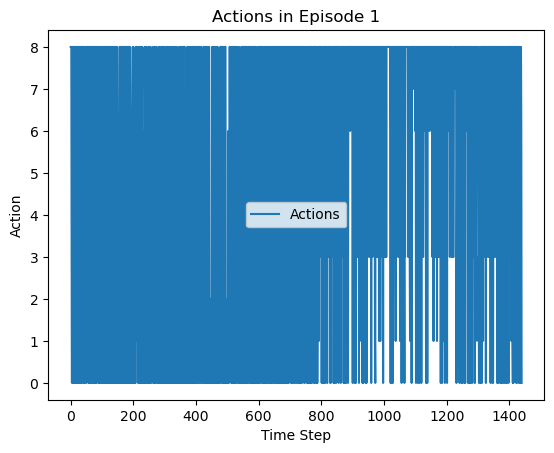

In [45]:
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -651.5739189558029
Total Reward: -635.2871293067931


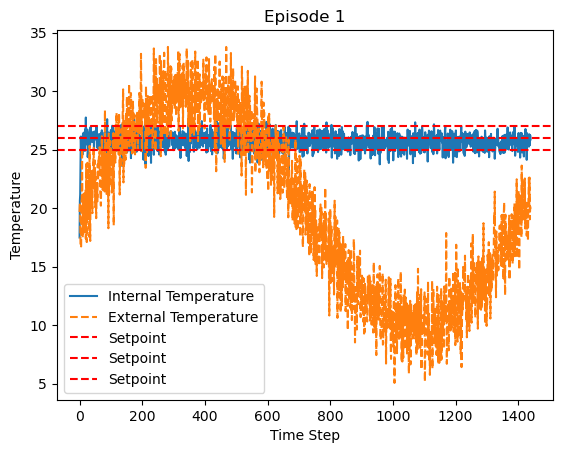

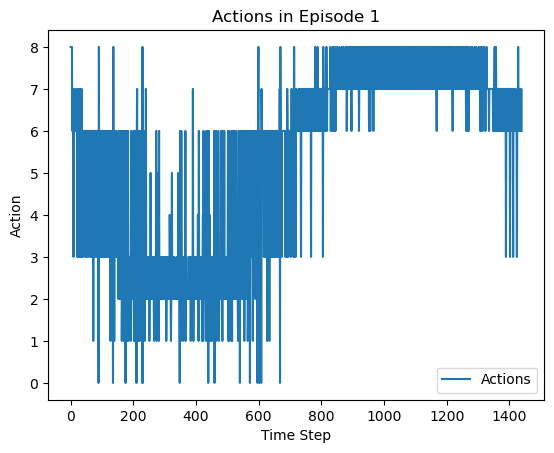

In [47]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=2.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -692.1295243825911
Total Reward: -709.447267150879


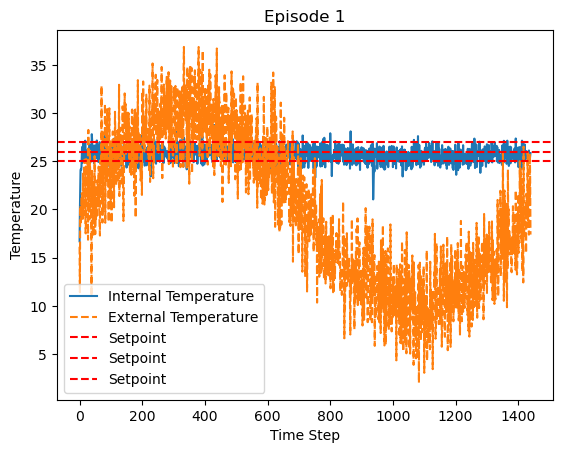

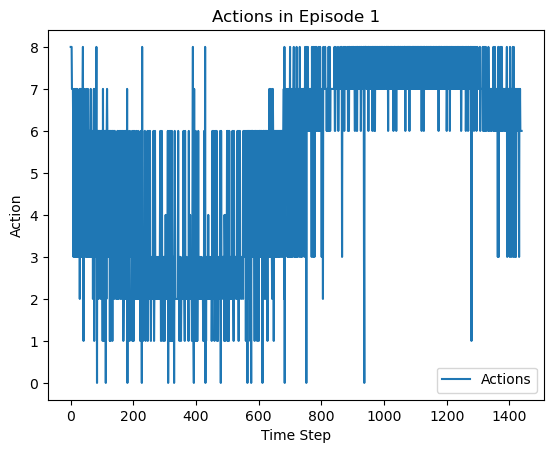

In [48]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=3.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -753.7727734899521
Total Reward: -764.2971686363209


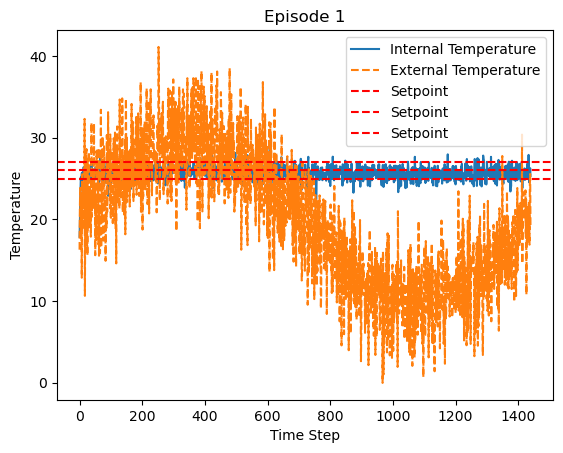

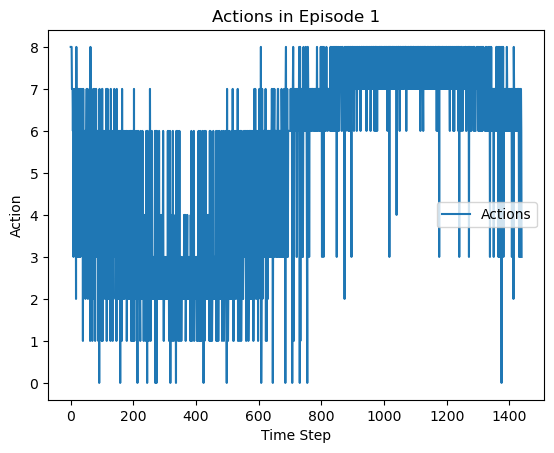

In [49]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=4.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -831.9115047483446
Total Reward: -816.7741293907185


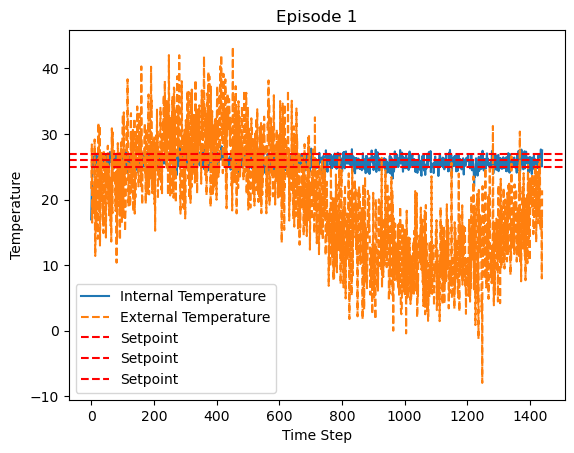

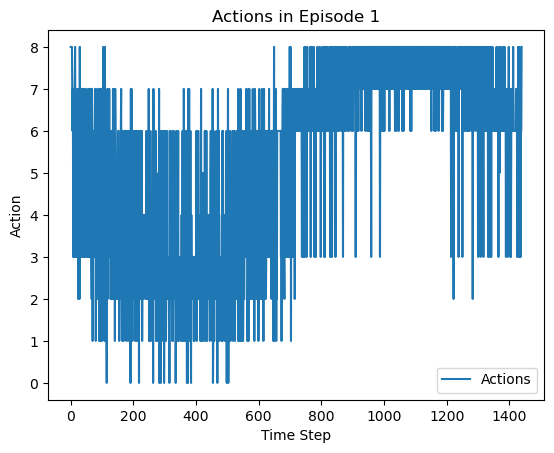

In [51]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=5.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -915.4091401672362
Total Reward: -896.2278827667237


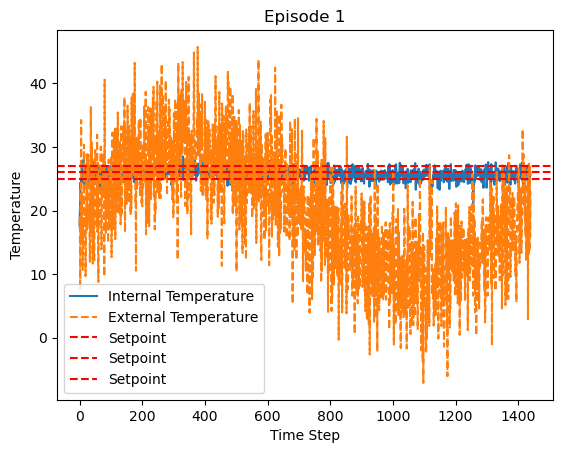

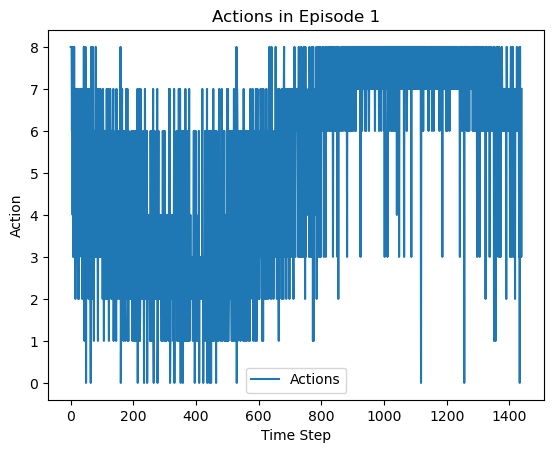

In [52]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=6.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1012.4693394756318
Total Reward: -995.0157500267009


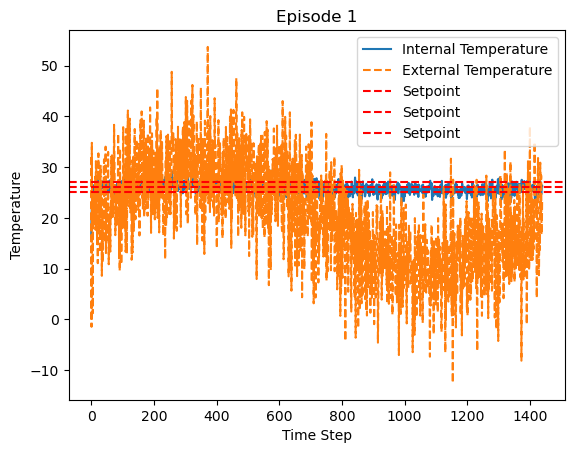

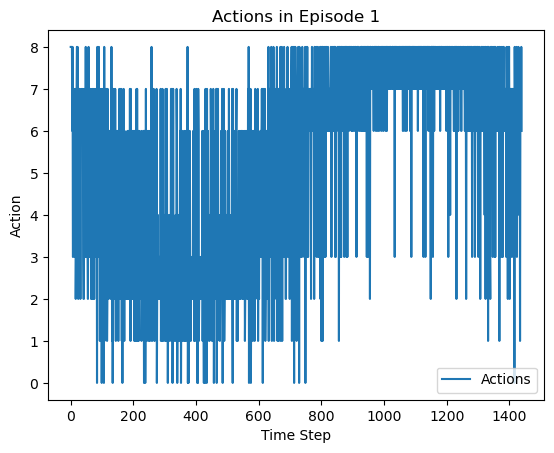

In [54]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=7.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1117.2856636953352
Total Reward: -1199.5182134628299


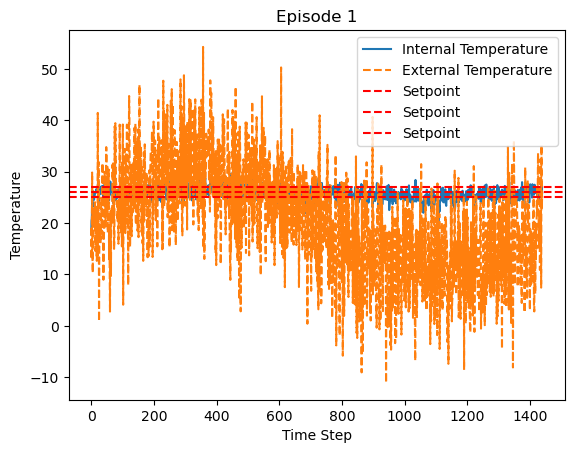

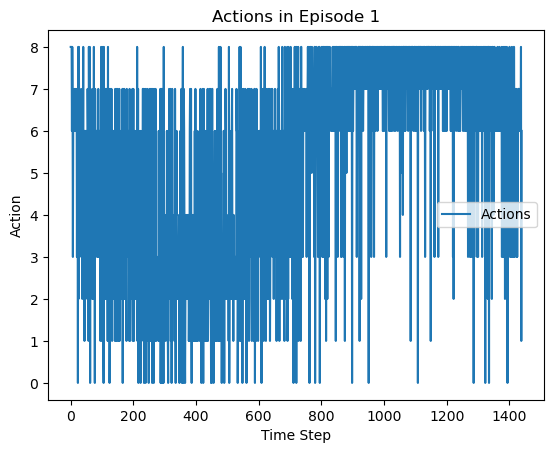

In [55]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=8.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1208.0519634513855
Total Reward: -1271.9581524848948


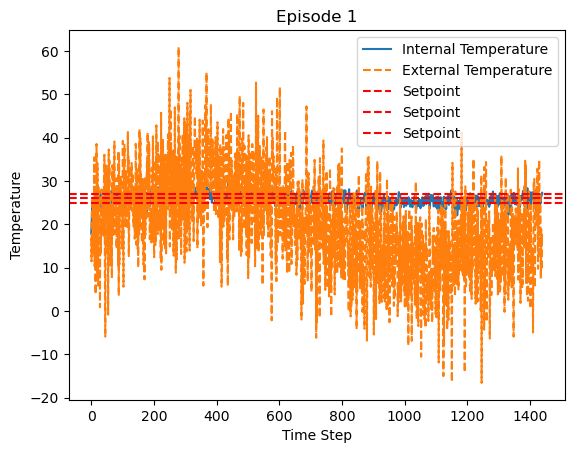

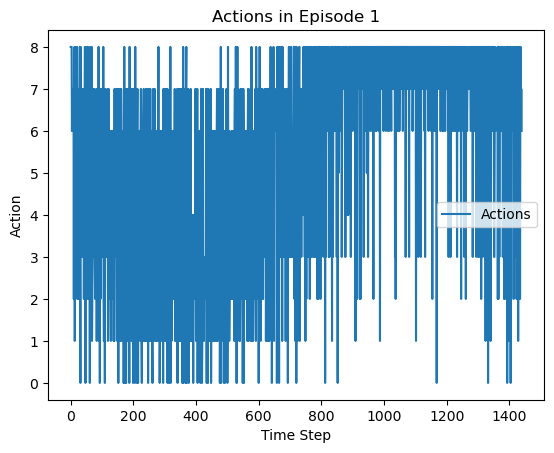

In [56]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=9.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1319.482926338196
Total Reward: -1386.473207283018


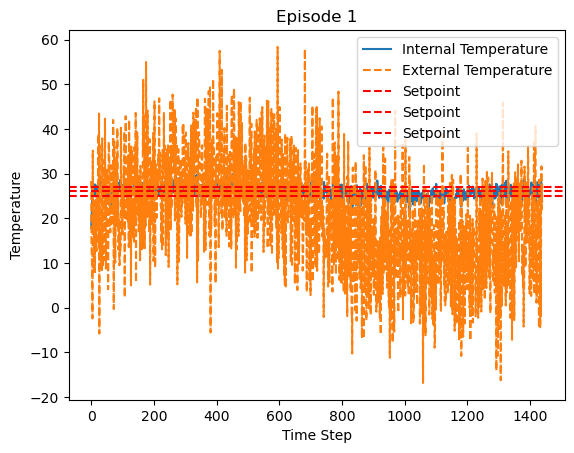

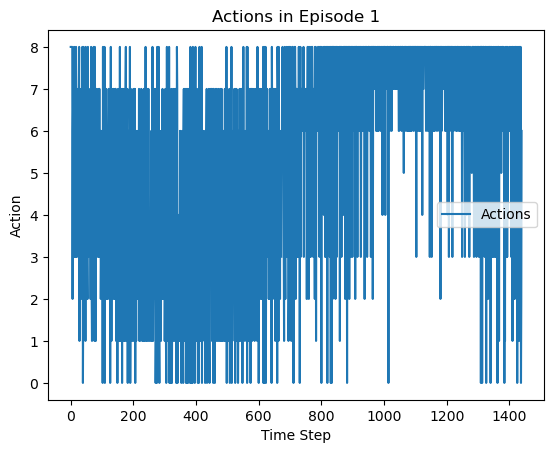

In [58]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=10.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1423.5760534095762
Total Reward: -1490.9975651741026


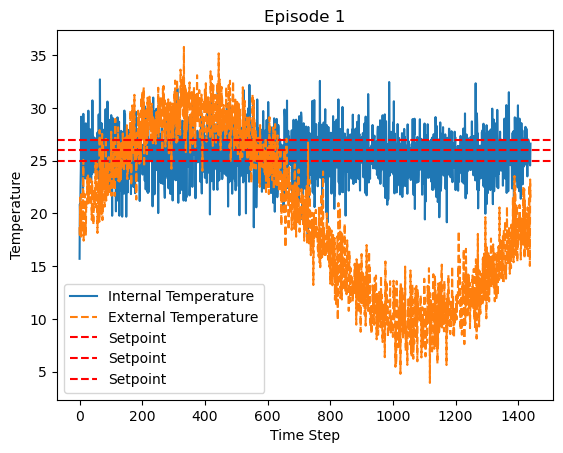

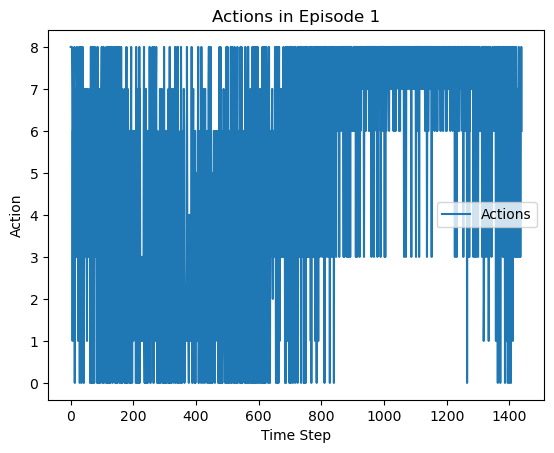

In [65]:
env = RoomTemperatureControlEnv(noise_int=2.0, noise_ext=2.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1914.6919939022064
Total Reward: -1883.8685423851014


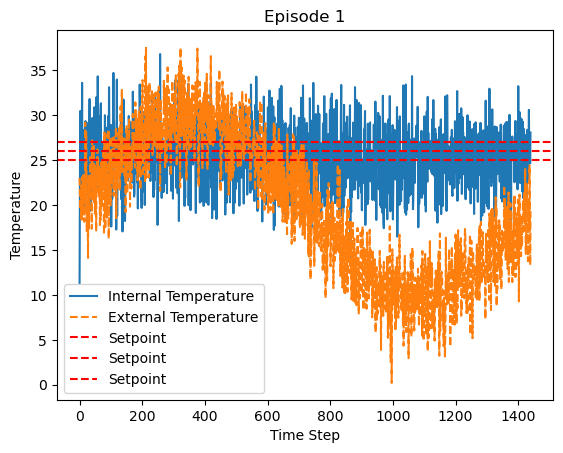

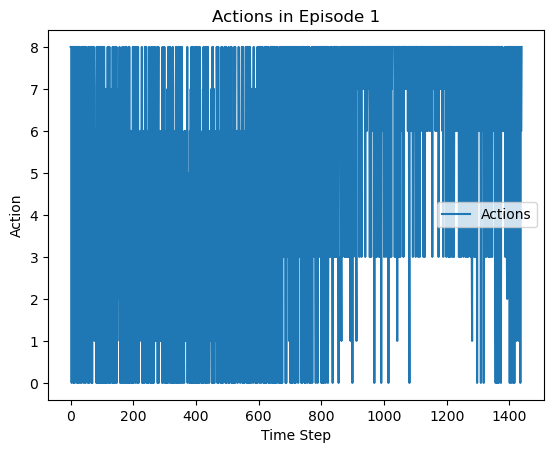

In [66]:
env = RoomTemperatureControlEnv(noise_int=3.0, noise_ext=3.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -2353.1762349081037
Total Reward: -2335.582903385163


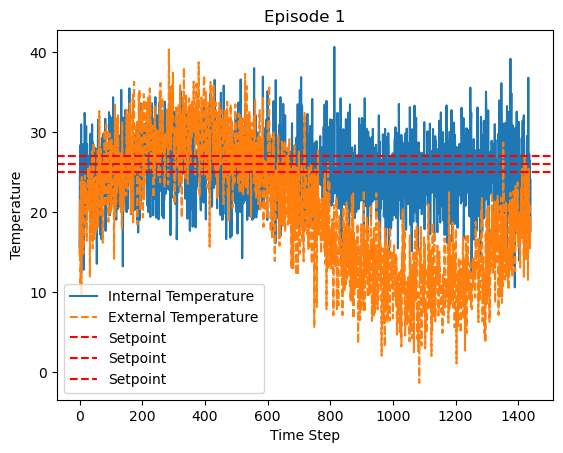

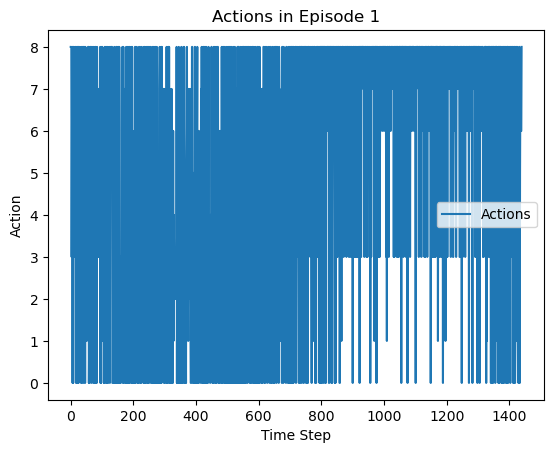

In [67]:
env = RoomTemperatureControlEnv(noise_int=4.0, noise_ext=4.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -2737.616093358994
Total Reward: -2857.215473842616


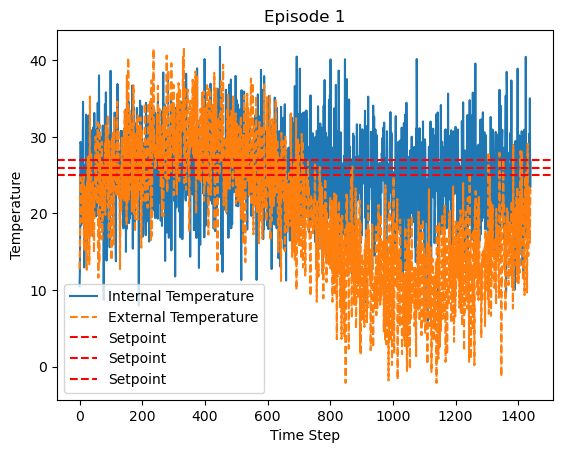

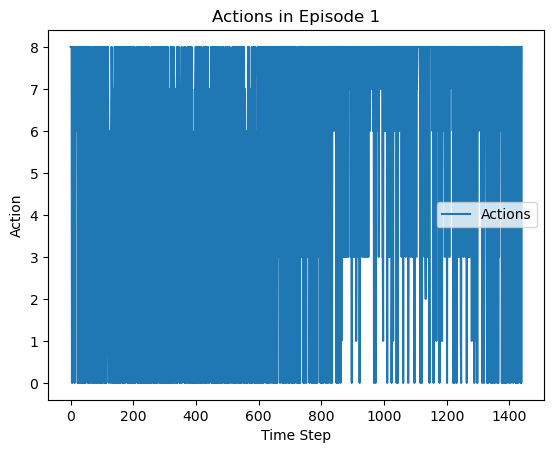

In [69]:
env = RoomTemperatureControlEnv(noise_int=5.0, noise_ext=5.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3081.624973934173
Total Reward: -3004.114984989162


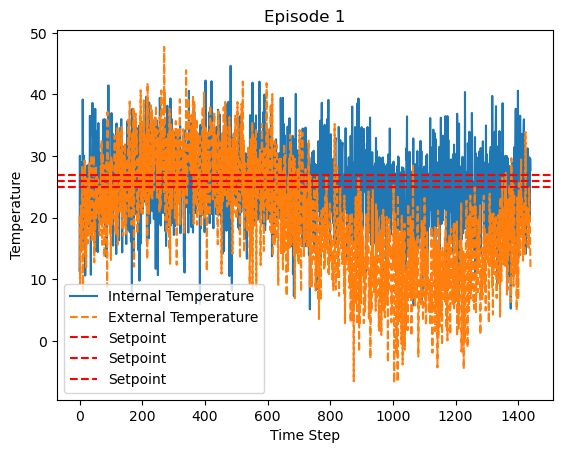

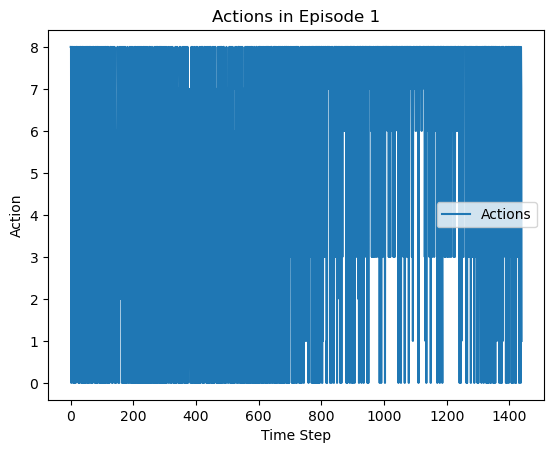

In [70]:
env = RoomTemperatureControlEnv(noise_int=6.0, noise_ext=6.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3422.65193962574
Total Reward: -3242.05732164383


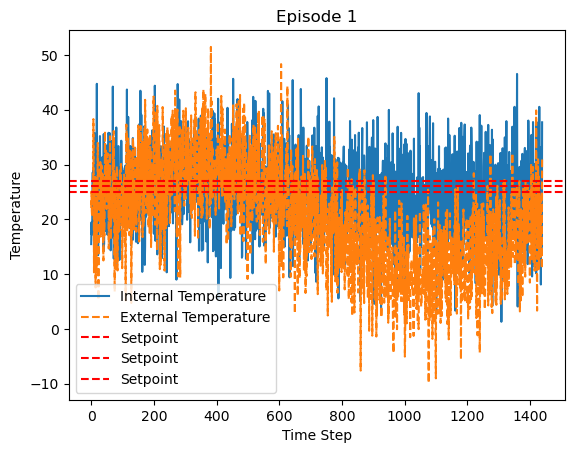

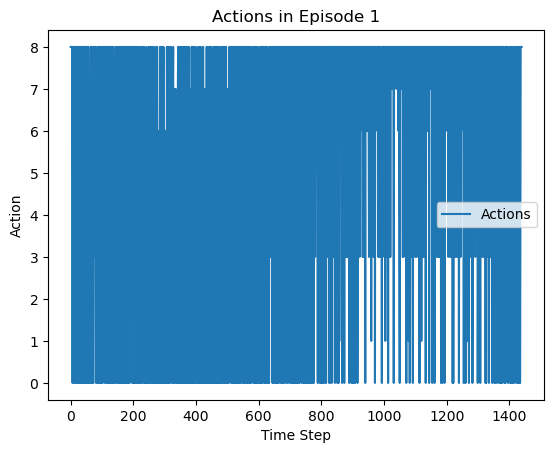

In [71]:
env = RoomTemperatureControlEnv(noise_int=7.0, noise_ext=7.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3680.443198669433
Total Reward: -3825.252112770076


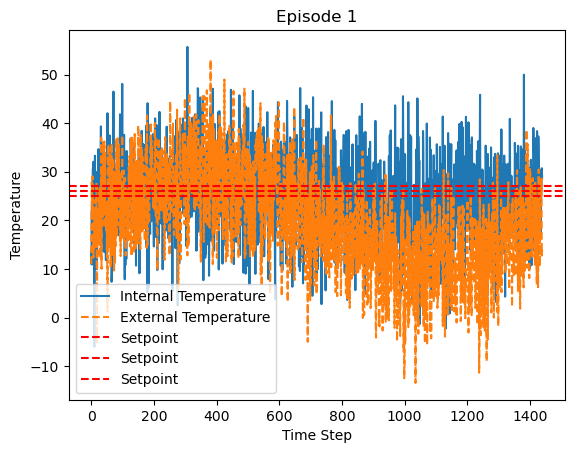

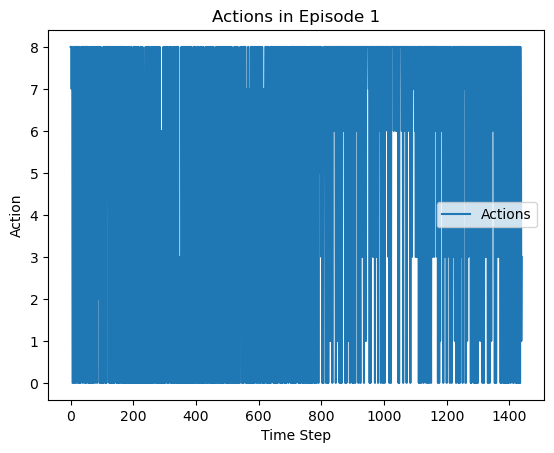

In [74]:
env = RoomTemperatureControlEnv(noise_int=8.0, noise_ext=8.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3958.8981457138066
Total Reward: -3993.386759948731


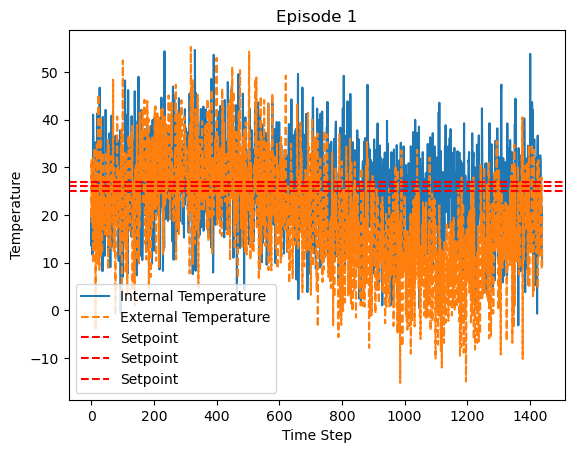

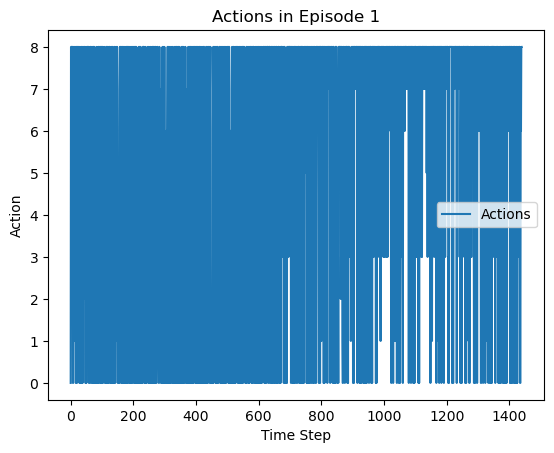

In [75]:
env = RoomTemperatureControlEnv(noise_int=9.0, noise_ext=9.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -4176.474657073019
Total Reward: -4065.1190912246684


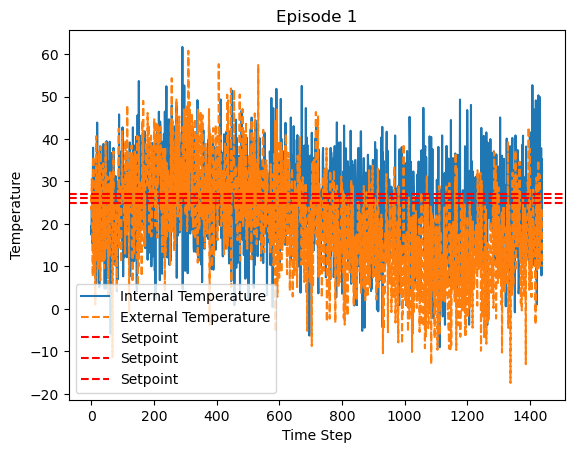

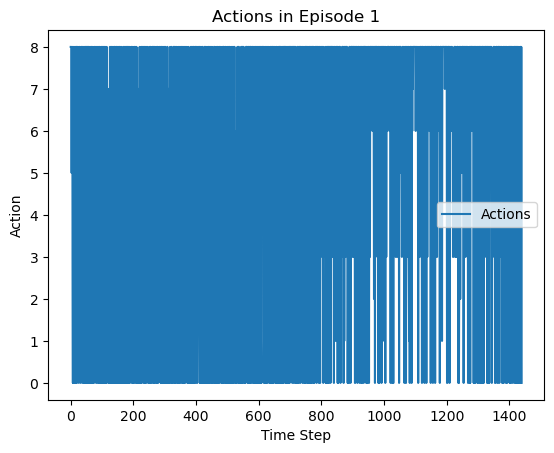

In [76]:
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=10.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -586.9483089580536
Total Reward: -570.1099209785449


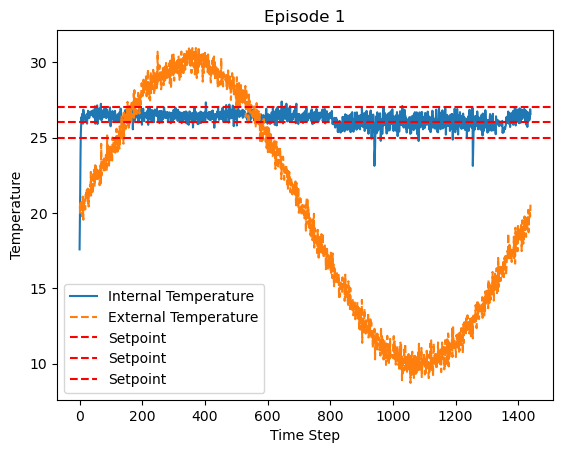

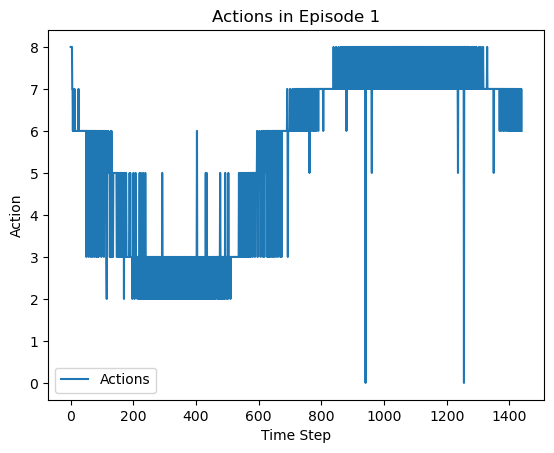

In [48]:
env = RoomTemperatureControlEnv(noise_int=0.2, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -613.8607815589904
Total Reward: -641.5362789154046


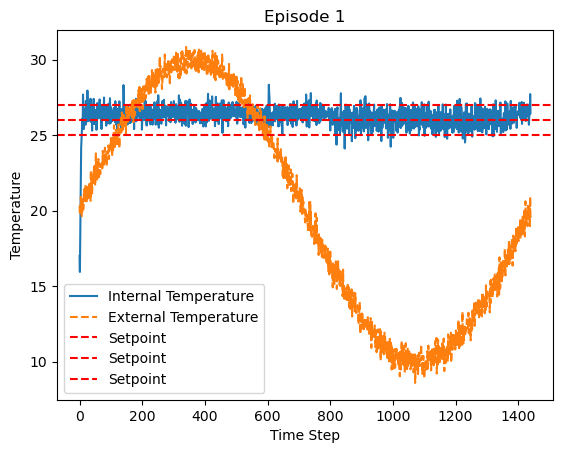

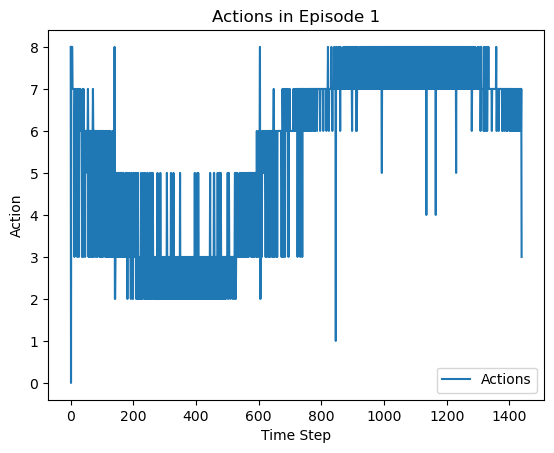

In [57]:
env = RoomTemperatureControlEnv(noise_int=0.4, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -664.6920275287629
Total Reward: -675.6876242637625


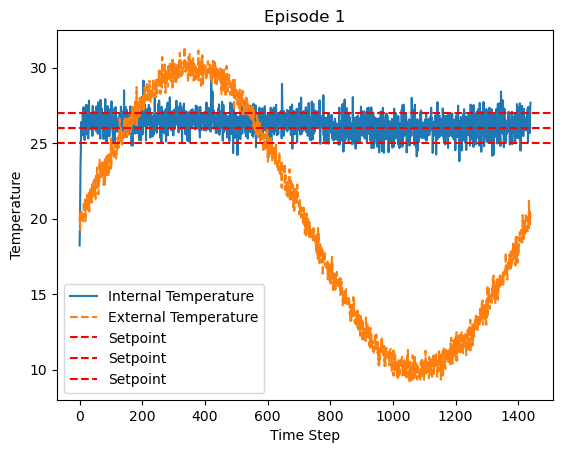

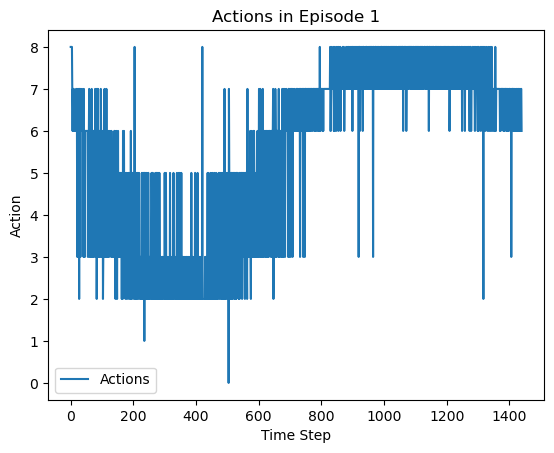

In [58]:
env = RoomTemperatureControlEnv(noise_int=0.6, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -735.5150693206789
Total Reward: -761.1911264419554


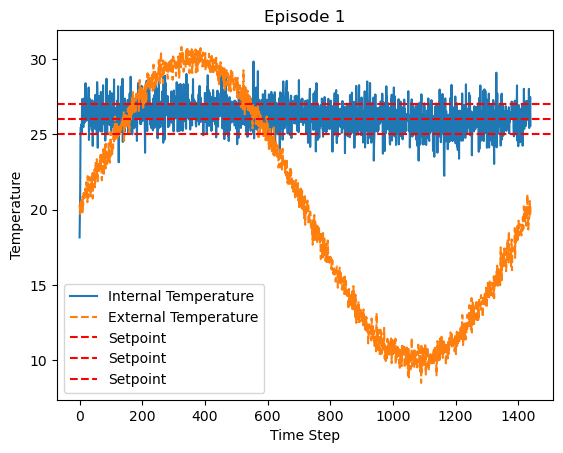

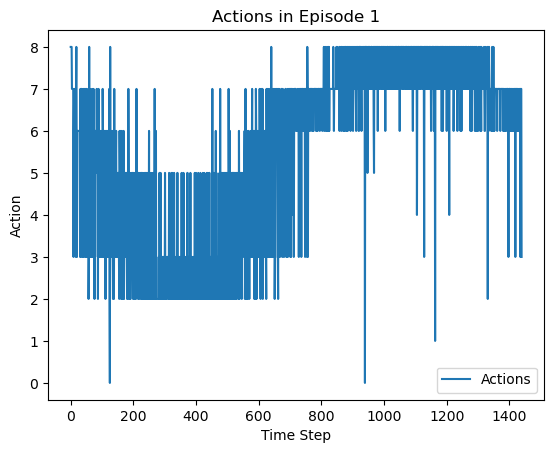

In [59]:
env = RoomTemperatureControlEnv(noise_int=0.8, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -820.5209632463453
Total Reward: -819.0441580772407


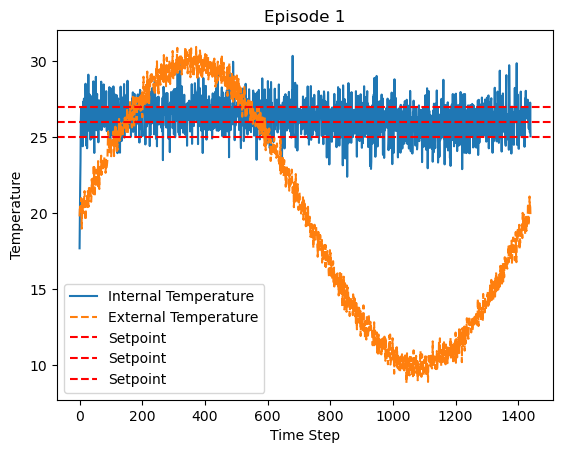

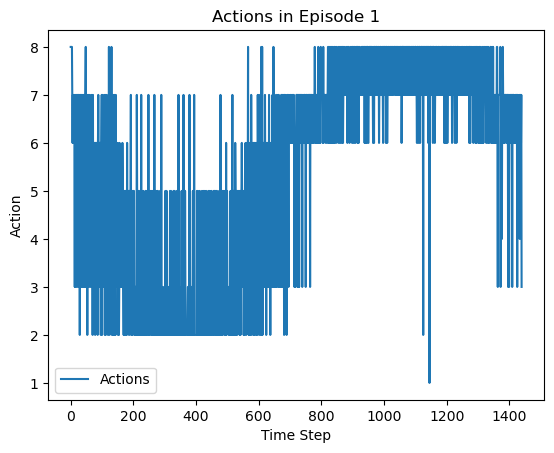

In [60]:
env = RoomTemperatureControlEnv(noise_int=1.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3106.3679148597726
Total Reward: -3222.7206905364983


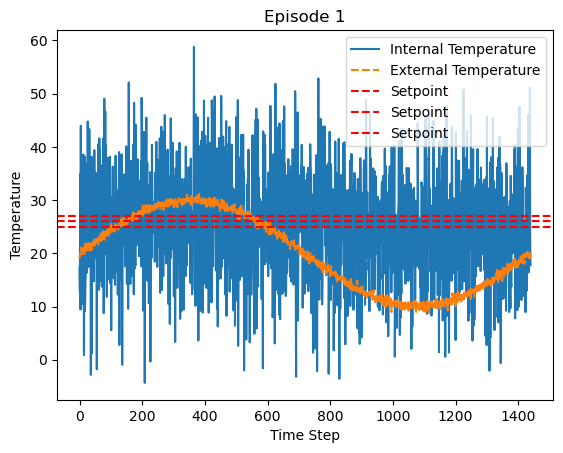

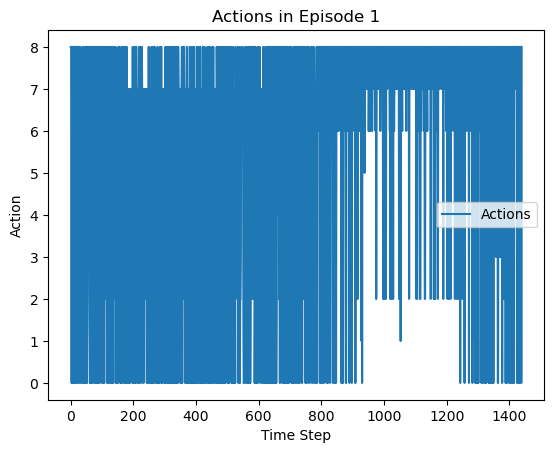

In [62]:
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=0.5)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -631.4632064352036
Total Reward: -624.0238455772406


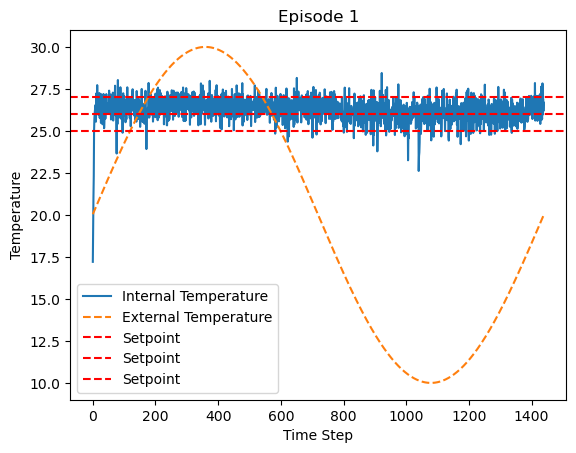

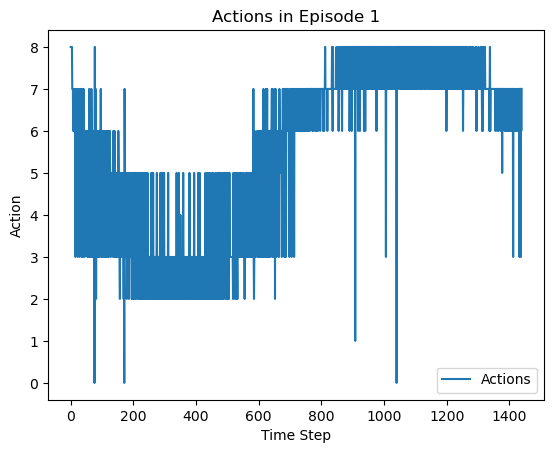

In [64]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -635.1313400087358
Total Reward: -647.2301570892344


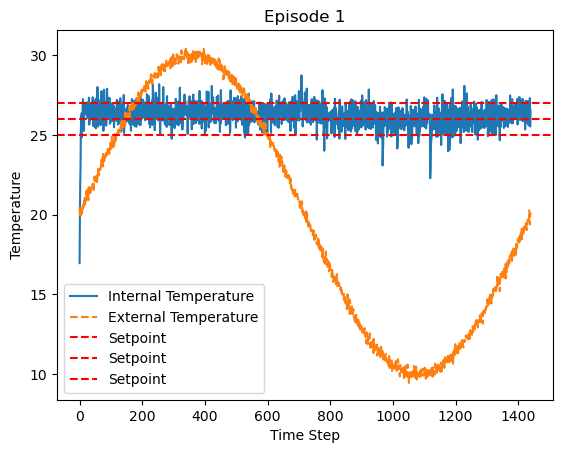

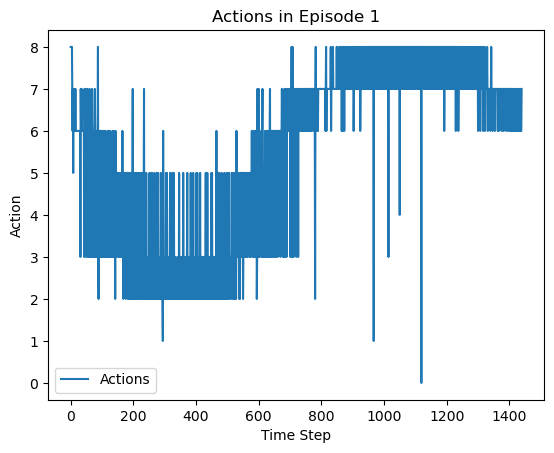

In [66]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.2)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -634.3901736402512
Total Reward: -655.5785288810738


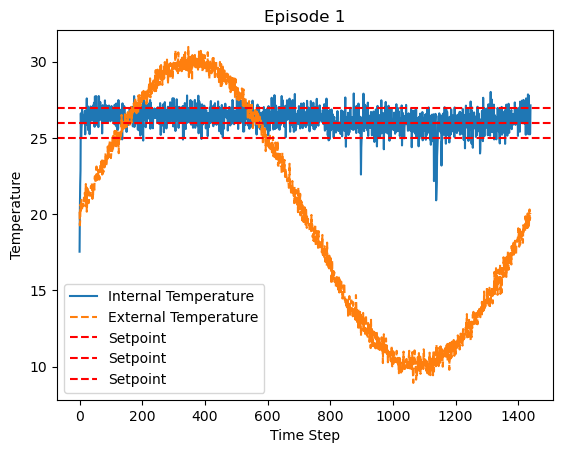

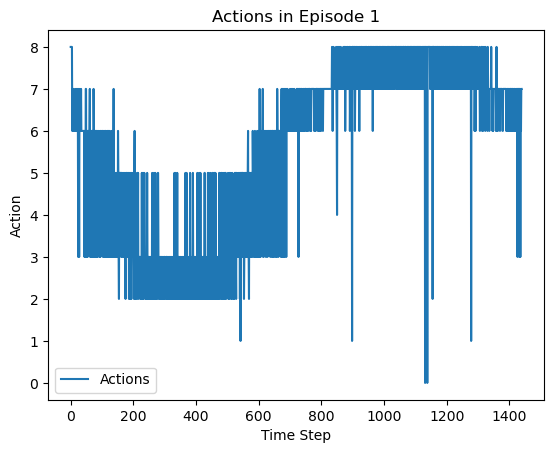

In [69]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.4)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -635.7256472997665
Total Reward: -637.3940045356733


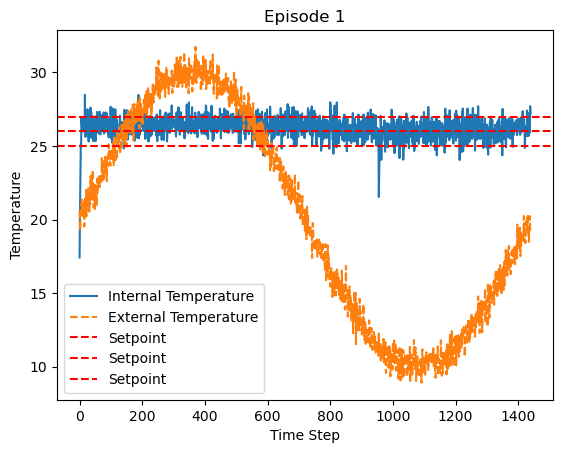

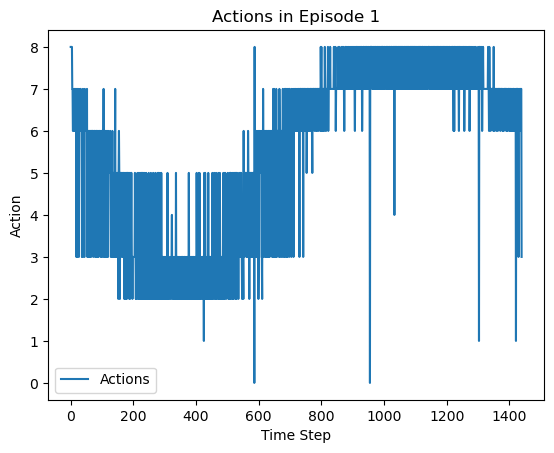

In [70]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.6)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -636.8981941604613
Total Reward: -610.7742084503183


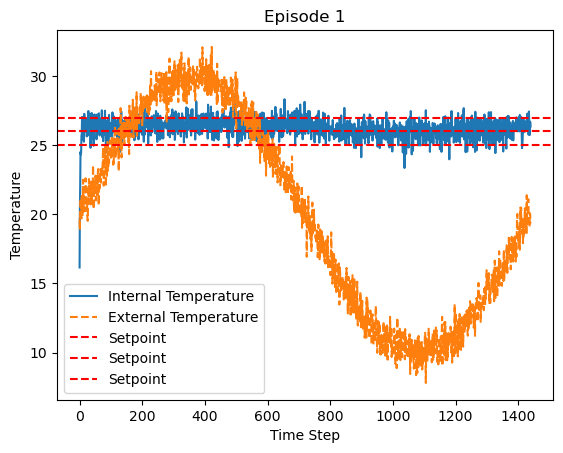

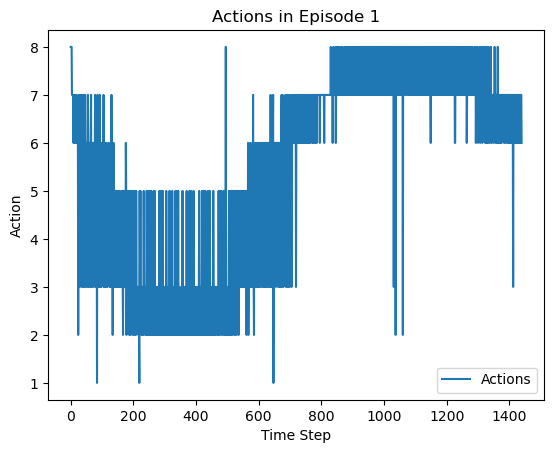

In [72]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=0.8)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -642.4072976331713
Total Reward: -655.6303838729864


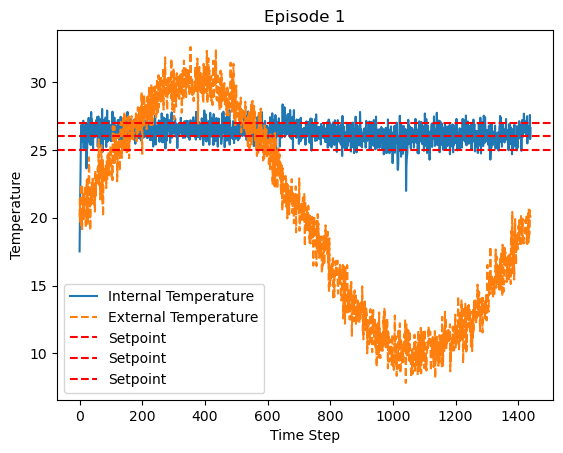

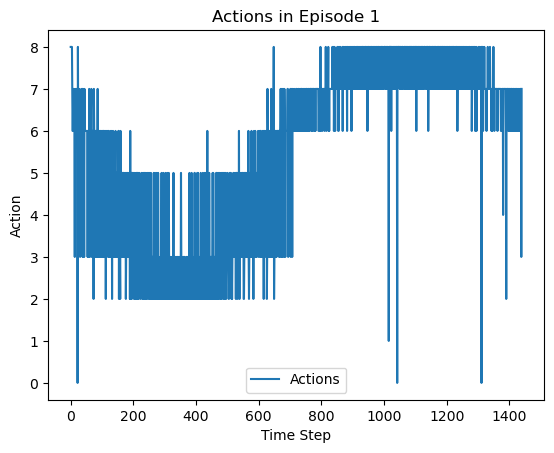

In [73]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=1.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -1934.460331999778
Total Reward: -2005.7334692955


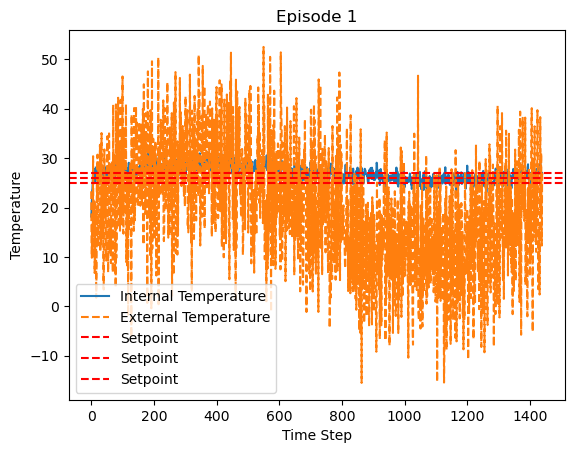

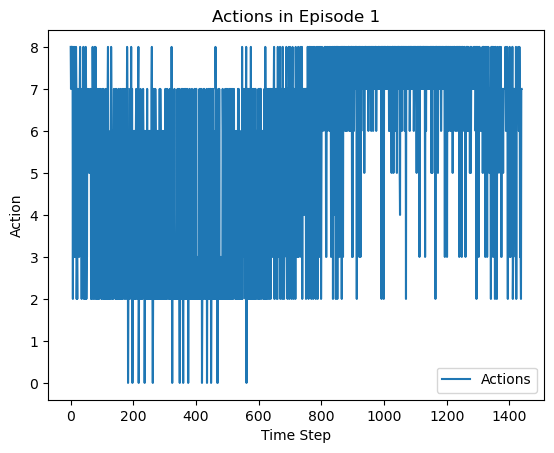

In [74]:
env = RoomTemperatureControlEnv(noise_int=0.5, noise_ext=10.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -587.8141612548831
Total Reward: -606.1295842170717


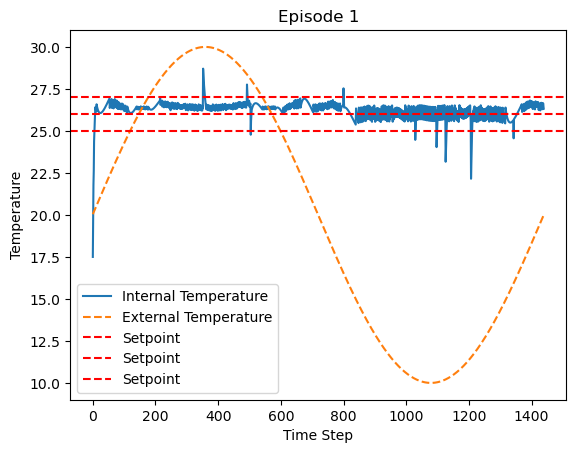

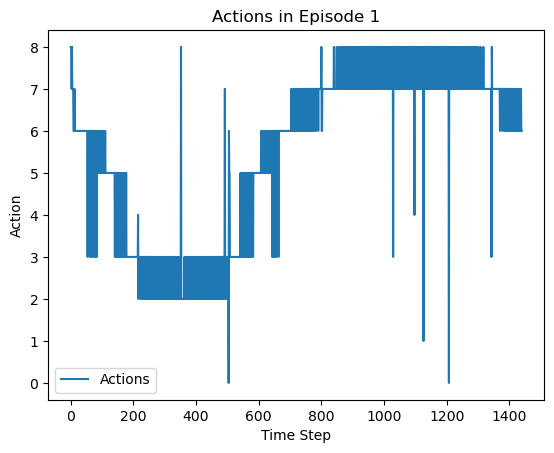

In [93]:
env = RoomTemperatureControlEnv(noise_int=0.0, noise_ext=0.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -587.7536027746202
Total Reward: -573.7785761833179


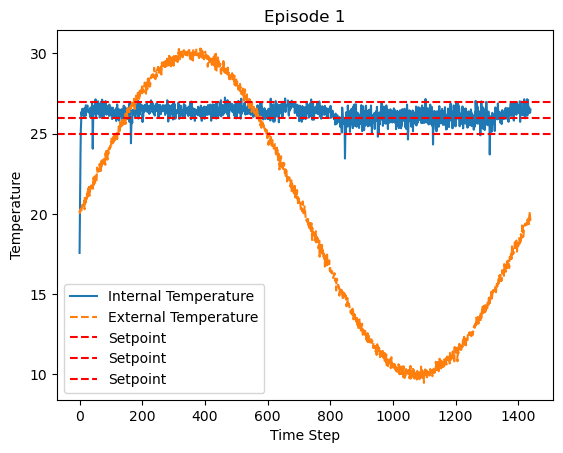

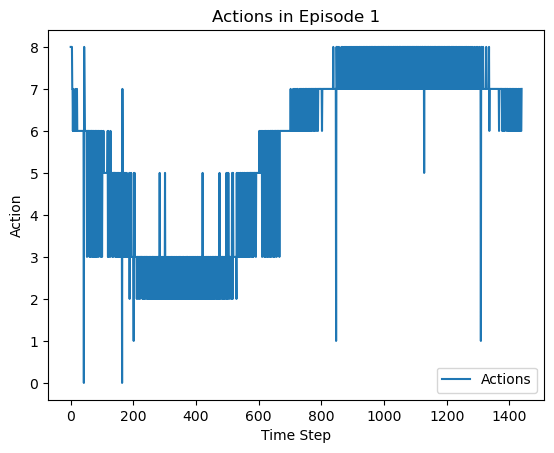

In [77]:
env = RoomTemperatureControlEnv(noise_int=0.2, noise_ext=0.2)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -611.5968583889008
Total Reward: -620.221654605866


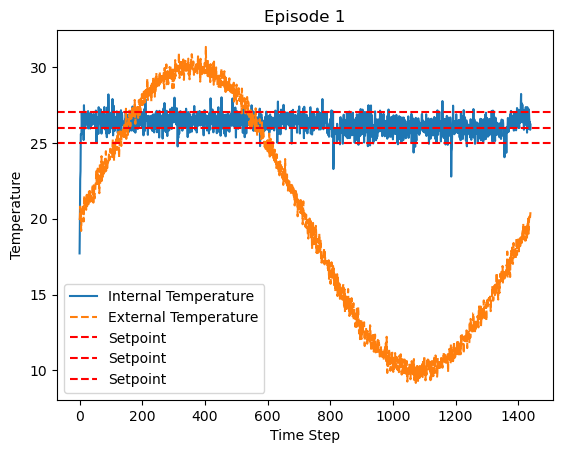

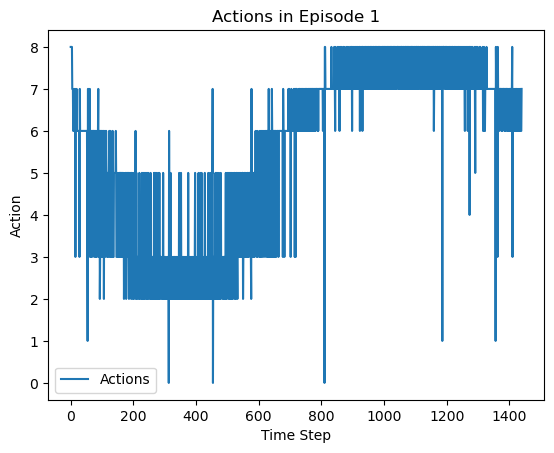

In [79]:
env = RoomTemperatureControlEnv(noise_int=0.4, noise_ext=0.4)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -664.1913464012146
Total Reward: -653.7109465599065


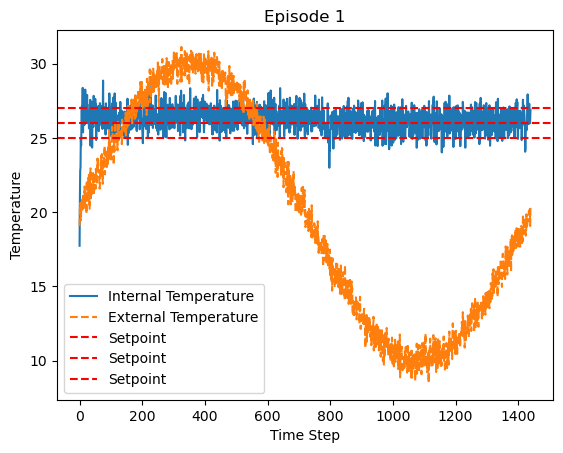

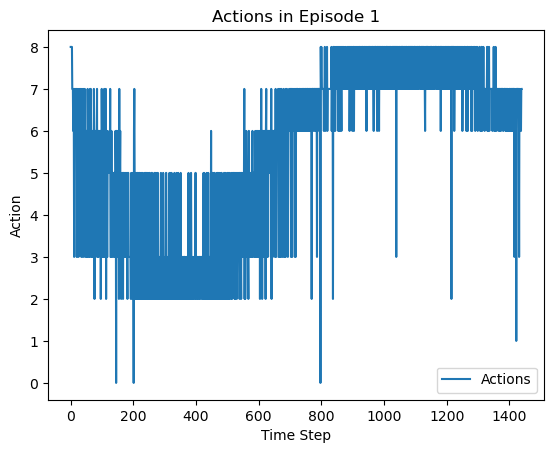

In [80]:
env = RoomTemperatureControlEnv(noise_int=0.6, noise_ext=0.6)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -738.1959523735045
Total Reward: -741.1804862022412


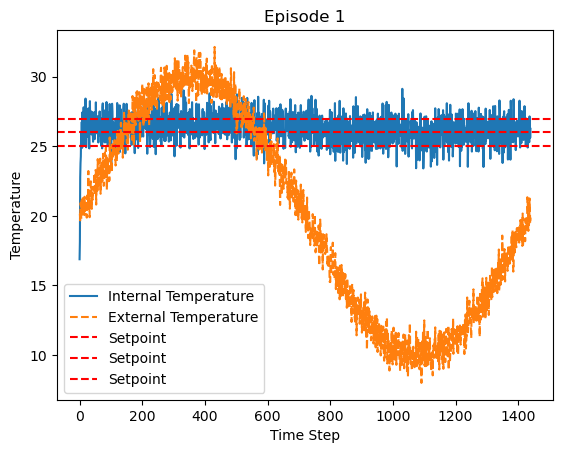

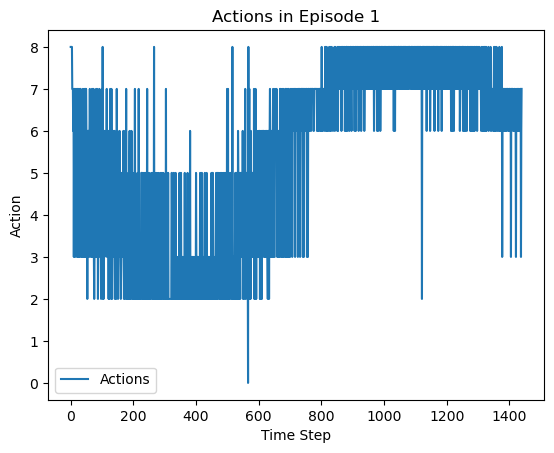

In [81]:
env = RoomTemperatureControlEnv(noise_int=0.8, noise_ext=0.8)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -837.5701070833209
Total Reward: -837.967605781555


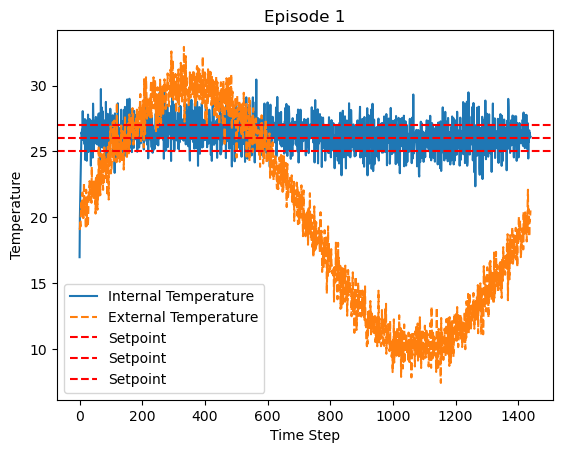

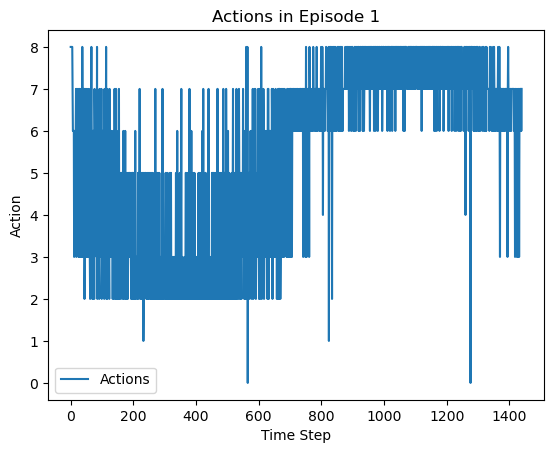

In [83]:
env = RoomTemperatureControlEnv(noise_int=1.0, noise_ext=1.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

Average Reward over 100 episodes: -3713.7972018918995
Total Reward: -3540.1237246513415


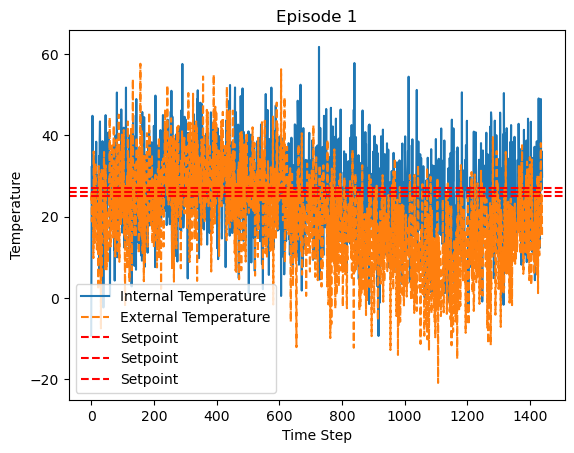

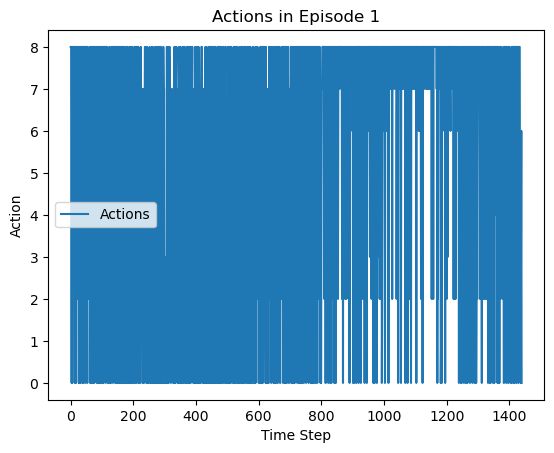

In [55]:
env = RoomTemperatureControlEnv(noise_int=10.0, noise_ext=10.0)

# Evaluate and track performance
average_reward, rewards = dqn_agent.evaluate(env)
print(f"Average Reward over {len(rewards)} episodes: {average_reward}")
track_temperature_and_actions_precise(dqn_agent, env)

In [85]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the provided Excel file
file_path = 'Noise Evaluation Data Best DQN.xlsx'
df = pd.read_excel(file_path, sheet_name=None)

# Load the data from the first sheet
data = df['Sheet1']

# Extract the data for plotting
rewards = data['Average Reward Over 100 Episodes']

# Extracting data ranges for each experiment with correct indices
x_y_rewards = rewards.iloc[0:15].values
y_x_rewards = rewards.iloc[15:30].values
y_y_rewards = rewards.iloc[30:45].values

print(x_y_rewards)
print(y_x_rewards)
print(y_y_rewards)

[ -588.72  -586.94  -613.86  -664.69  -735.51  -820.52 -1328.89 -1810.08
 -2257.33 -2677.17 -3027.11 -3349.91 -3670.7  -3948.6  -4402.71]
[ -631.46  -635.13  -634.39  -635.72  -636.89  -642.4   -651.57  -692.12
  -753.77  -831.91  -915.4  -1012.46 -1117.28 -1208.05 -1319.48]
[ -587.83  -587.75  -611.59  -664.19  -738.19  -837.57 -1423.57 -1914.69
 -2353.17 -2737.61 -3081.62 -3422.65 -3680.44 -3958.89 -4176.47]


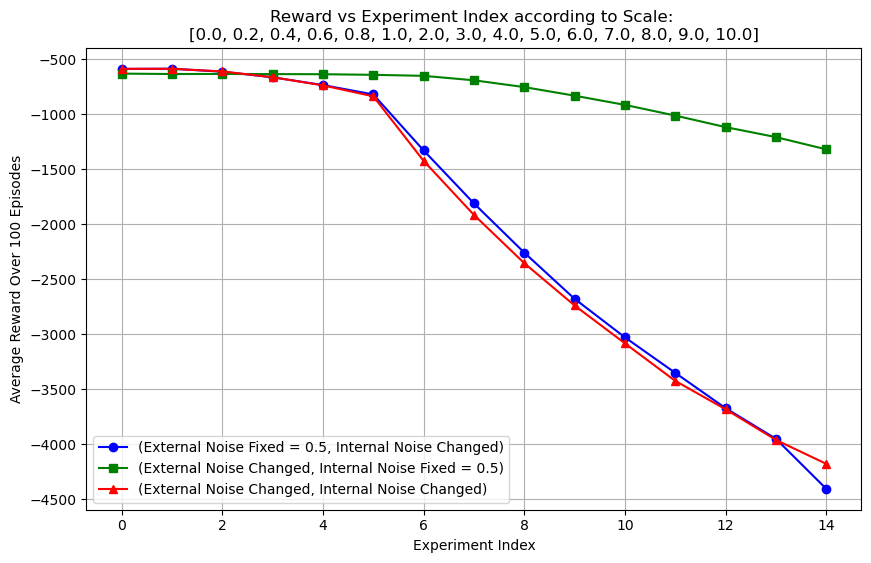

In [93]:
# Creating the plot with specified ranges
plt.figure(figsize=(10, 6))
plt.plot(range(0, 15), x_y_rewards, label='(External Noise Fixed = 0.5, Internal Noise Changed)', marker='o', color='blue')
plt.plot(range(0, 15), y_x_rewards, label='(External Noise Changed, Internal Noise Fixed = 0.5)', marker='s', color='green')
plt.plot(range(0, 15), y_y_rewards, label='(External Noise Changed, Internal Noise Changed)', marker='^', color='red')

# Customizing the plot
plt.xlabel('Experiment Index')
plt.ylabel('Average Reward Over 100 Episodes')
plt.title('Reward vs Experiment Index according to Scale: \n[0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0]')
plt.legend()
plt.grid(True)

# Displaying the plot
plt.show()
